# G2M Insight for Cab Investment Firm

### Preparation of Data

Load the required libraries.

In [2]:
library(tidyverse)
library(zoo)

Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang
Registered S3 method overwritten by 'rvest':
  method            from
  read_xml.response xml2
── Attaching packages ─────────────────────────────────────── tidyverse 1.2.1 ──
✔ ggplot2 3.1.1       ✔ purrr   0.3.2  
✔ tibble  2.1.1       ✔ dplyr   0.8.0.1
✔ tidyr   0.8.3       ✔ stringr 1.4.0  
✔ readr   1.3.1       ✔ forcats 0.4.0  
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘zoo’

The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



Read in the data & display small portion of each data set.

In [3]:
cab_data <- as_tibble(read.csv('Cab_Data.csv'))
head(cab_data)
city_data <- as_tibble(read.csv('City.csv'))
head(city_data)
customer_data <- as_tibble(read.csv('Customer_ID.csv'))
head(customer_data)
transaction_data <- as_tibble(read.csv('Transaction_ID.csv'))
head(transaction_data)

Transaction.ID,Date.of.Travel,Company,City,KM.Travelled,Price.Charged,Cost.of.Trip
10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632
10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.602
10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.776
10000016,42376,Pink Cab,ATLANTA GA,6.06,72.43,63.024


City,Population,Users
NEW YORK NY,"8,405,837","302,149"
CHICAGO IL,"1,955,130","164,468"
LOS ANGELES CA,"1,595,037","144,132"
MIAMI FL,"1,339,155","17,675"
SILICON VALLEY,"1,177,609","27,247"
ORANGE COUNTY,"1,030,185","12,994"


Customer.ID,Gender,Age,Income..USD.Month.
29290,Male,28,10813
27703,Male,27,9237
28712,Male,53,11242
28020,Male,23,23327
27182,Male,33,8536
27318,Male,25,13984


Transaction.ID,Customer.ID,Payment_Mode
10000011,29290,Card
10000012,27703,Card
10000013,28712,Cash
10000014,28020,Cash
10000015,27182,Card
10000016,27318,Cash


Merge cab, customer, transaction data set into one data set. From the newly created data set, remove rows with missing values & keep unique rows. Add variable `Profit`, that is the cost of the trip subtracted from the price charged for the trip. Convert `Date.of.Travel` variable to Gregorian dates & reduce to months, save as `Month.of.Travel`.

In [8]:
master_data <- merge(merge(cab_data, transaction_data, by = 'Transaction.ID'), customer_data, by = 'Customer.ID')
master_data <- unique(na.omit(master_data))
master_data <- mutate(master_data, Profit = round(Price.Charged - Cost.of.Trip, digits = 2),
                                   Profit.per.Km = Profit / KM.Travelled,
                                   
                                   Date.of.Travel = as.Date(Date.of.Travel, origin = as.Date('1900-01-01')),
                                   Year.Quarter = as.factor(as.yearqtr(Date.of.Travel)))
master_data <- filter(master_data, Date.of.Travel <= '2018-12-31')
head(master_data)

Customer.ID,Transaction.ID,Date.of.Travel,Company,City,KM.Travelled,Price.Charged,Cost.of.Trip,Payment_Mode,Gender,Age,Income..USD.Month.,Profit,Profit.per.Km,Year.Quarter
1,10148559,2017-02-26,Yellow Cab,NEW YORK NY,11.99,340.87,172.6560,Cash,Male,36,16359,168.21,14.029191,2017 Q1
1,10053182,2016-07-15,Yellow Cab,NEW YORK NY,8.12,233.10,100.3632,Card,Male,36,16359,132.74,16.347291,2016 Q3
1,10239813,2017-10-17,Yellow Cab,NEW YORK NY,45.60,856.24,580.0320,Card,Male,36,16359,276.21,6.057237,2017 Q4
1,10055394,2016-07-26,Yellow Cab,NEW YORK NY,20.52,564.04,278.2512,Cash,Male,36,16359,285.79,13.927388,2016 Q3
1,10292534,2018-01-04,Yellow Cab,NEW YORK NY,25.53,752.63,333.9324,Card,Male,36,16359,418.70,16.400313,2018 Q1
1,10104483,2016-11-14,Yellow Cab,NEW YORK NY,40.60,1014.40,496.9440,Card,Male,36,16359,517.46,12.745320,2016 Q4


The following questions will help determine which company is the better investment in my opinion.

* Is the company popular with its customers? 
* Do they purchase cab rides frequently again? 
* Do they have a large number of installed base of locations?
* What is the cost per ride? How many rides per city? Overall?
* Have profits increased consistently over time?
* How much profit has the company made?

My assumptions about the data overall include:

* All customers pay the cab fare after their ride, so there is realised profit.
* All variables/features are true at the population level.
* All variables/features were recorded without error.
* Observations for a customer are independent to that of another customer (i.e. no ride-sharing).

***

Grouping by company & city, count number of rides. Visualise differences in bar plot.

City,Num.Rides
ATLANTA GA,1759
AUSTIN TX,1864
BOSTON MA,5180
CHICAGO IL,9351
DALLAS TX,1379
DENVER CO,1393
LOS ANGELES CA,19839
MIAMI FL,2000
NASHVILLE TN,1840
NEW YORK NY,13945


City,Num.Rides
ATLANTA GA,5789
AUSTIN TX,3020
BOSTON MA,24479
CHICAGO IL,47193
DALLAS TX,5622
DENVER CO,2427
LOS ANGELES CA,28127
MIAMI FL,4442
NASHVILLE TN,1167
NEW YORK NY,85799


Company,Num.Rides
Pink Cab,84597
Yellow Cab,274282


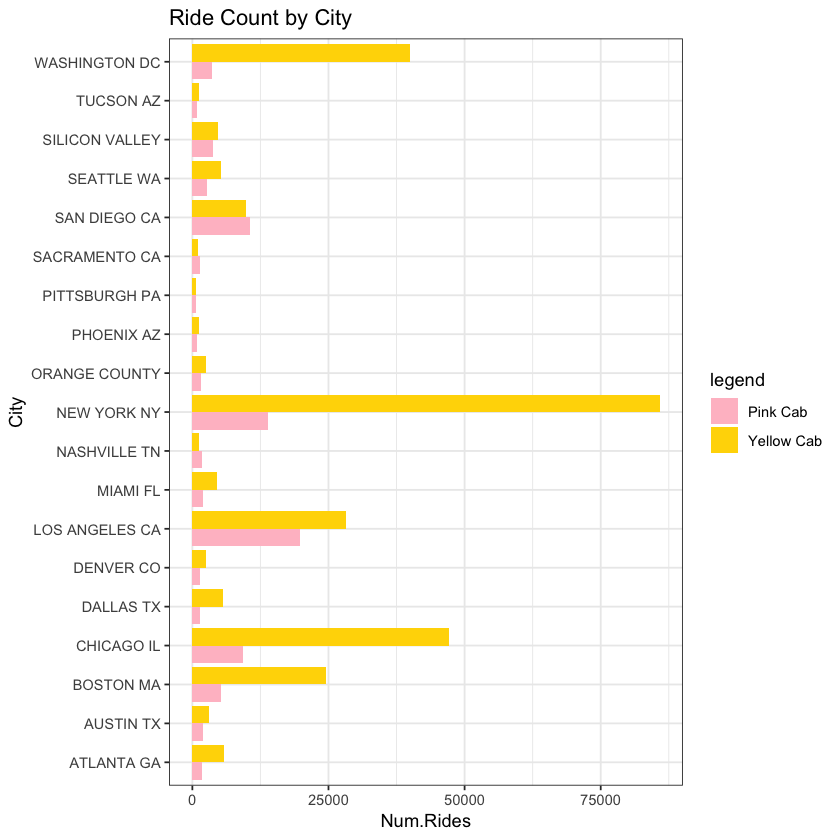

In [9]:
master_data %>% 
    filter(Company == 'Pink Cab') %>%
    group_by(City) %>% 
    summarise(Num.Rides = n()) 

master_data %>% 
    filter(Company == 'Yellow Cab') %>%
    group_by(City) %>% 
    summarise(Num.Rides = n()) 

master_data %>%
    group_by(Company) %>%
    summarise(Num.Rides = n())

ggplot(master_data %>% group_by(Company, City) %>% summarise(Num.Rides = n()),
       aes(x = City, y = Num.Rides, fill = Company)) + 
    geom_bar(position = 'dodge', stat = 'identity') + 
    scale_fill_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    coord_flip() +
    labs(title = 'Ride Count by City')

In 16 of the 19 cities where both Pink Cab company & Yellow Cab company services are provided, Yellow Cab company performs better in providing rides to its customers. In the 3 cities where Pink Cab company performs better, Nashville, San Diego & Sacramento, Pink Cab company only edges out Yellow Cab company. However, in major cities like Boston, Chicago, New York, & Washington DC, Yellow Cab company dominates, providing multiple times more rides than Pink Cab company does. It is reflected both in the tables & in the figure, that Yellow Cab company overshadows Pink Cab company in providing their services to their customers, more than tripling their number of rides provided.

Company,Year.Quarter,Num.Rides
Pink Cab,2016 Q1,3154
Pink Cab,2016 Q2,4504
Pink Cab,2016 Q3,7196
Pink Cab,2016 Q4,9986
Pink Cab,2017 Q1,4533
Pink Cab,2017 Q2,5221
Pink Cab,2017 Q3,8551
Pink Cab,2017 Q4,11996
Pink Cab,2018 Q1,5115
Pink Cab,2018 Q2,4971


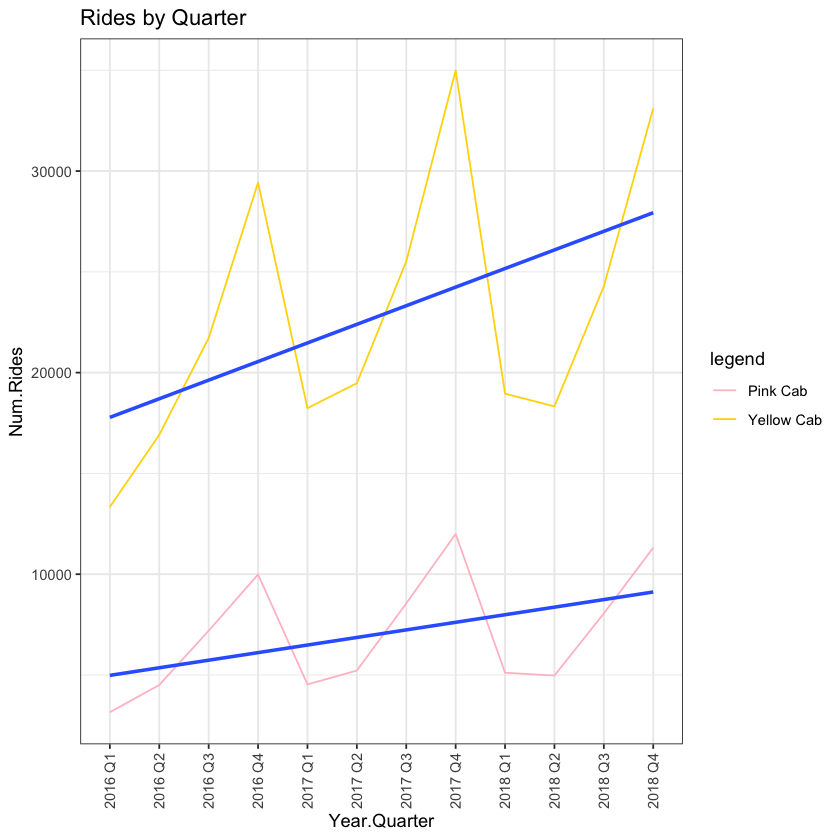

In [10]:
master_data %>%
    group_by(Company, Year.Quarter) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           group_by(Company, Year.Quarter) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter')

Seems to peak for both companies in Q4. I imagine because the last quarter of the year is when there is the most holidays, & people are flying in/flying out to see their families, giving the companies more rides. 

Now for each city.

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,70
2016 Q1,Yellow Cab,242
2016 Q2,Pink Cab,109
2016 Q2,Yellow Cab,340
2016 Q3,Pink Cab,152
2016 Q3,Yellow Cab,485
2016 Q4,Pink Cab,187
2016 Q4,Yellow Cab,626
2017 Q1,Pink Cab,100
2017 Q1,Yellow Cab,363


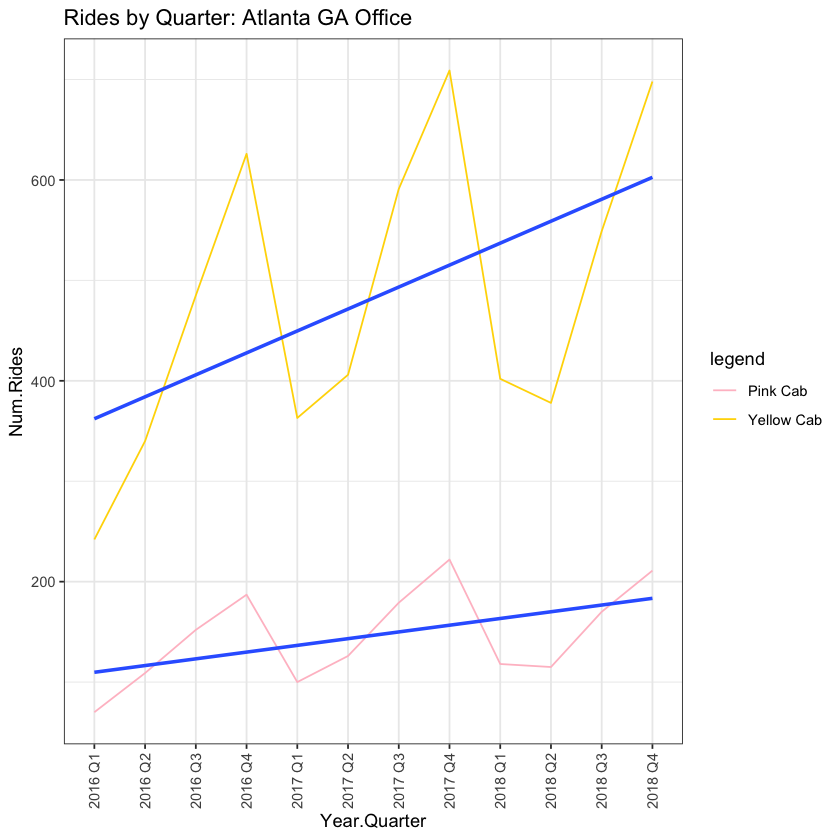

In [11]:
master_data %>%
    filter(City == 'ATLANTA GA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'ATLANTA GA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Atlanta GA Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,28
2016 Q1,Yellow Cab,91
2016 Q2,Pink Cab,60
2016 Q2,Yellow Cab,117
2016 Q3,Pink Cab,193
2016 Q3,Yellow Cab,272
2016 Q4,Pink Cab,252
2016 Q4,Yellow Cab,440
2017 Q1,Pink Cab,58
2017 Q1,Yellow Cab,150


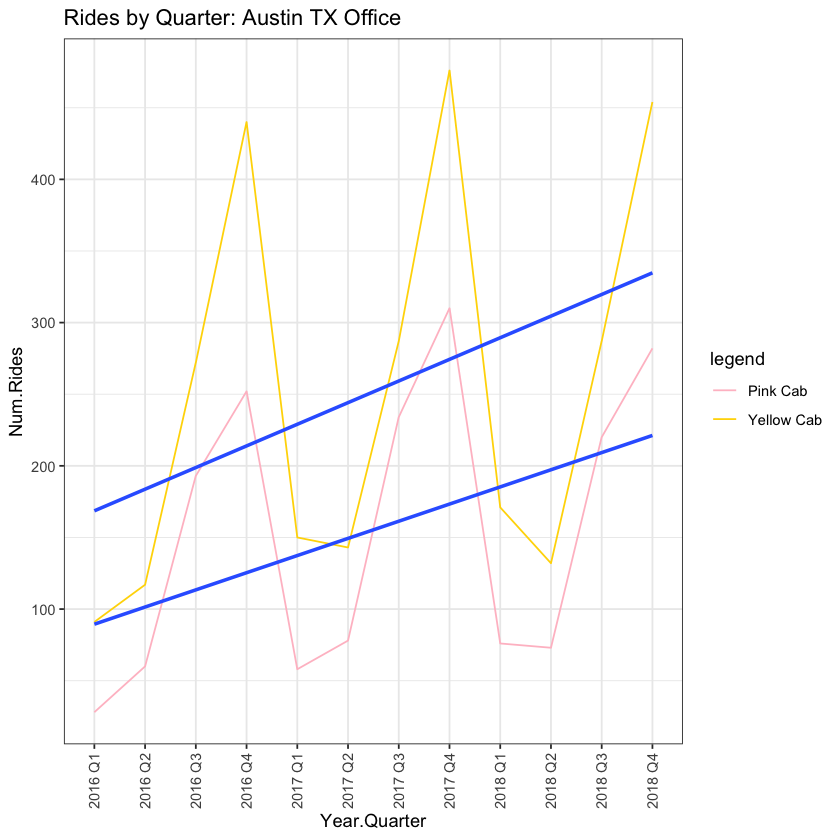

In [12]:
master_data %>%
    filter(City == 'AUSTIN TX') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'AUSTIN TX') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Austin TX Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,231
2016 Q1,Yellow Cab,1332
2016 Q2,Pink Cab,276
2016 Q2,Yellow Cab,1702
2016 Q3,Pink Cab,341
2016 Q3,Yellow Cab,1846
2016 Q4,Pink Cab,667
2016 Q4,Yellow Cab,2438
2017 Q1,Pink Cab,338
2017 Q1,Yellow Cab,1677


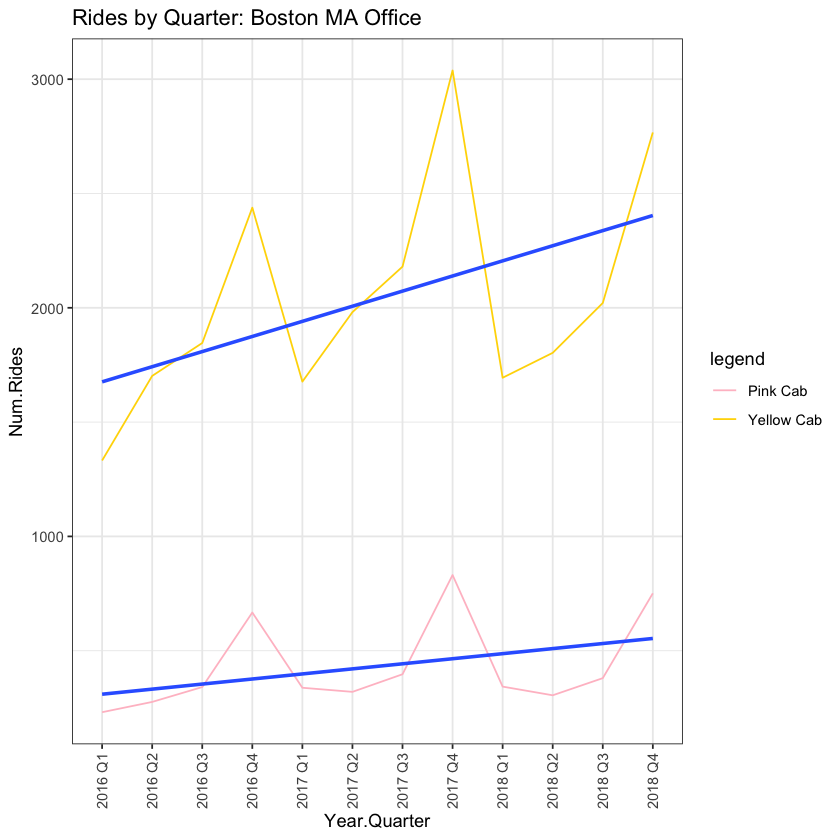

In [13]:
master_data %>%
    filter(City == 'BOSTON MA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'BOSTON MA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Boston MA Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,391
2016 Q1,Yellow Cab,2632
2016 Q2,Pink Cab,512
2016 Q2,Yellow Cab,3113
2016 Q3,Pink Cab,692
2016 Q3,Yellow Cab,3580
2016 Q4,Pink Cab,1161
2016 Q4,Yellow Cab,4552
2017 Q1,Pink Cab,549
2017 Q1,Yellow Cab,3599


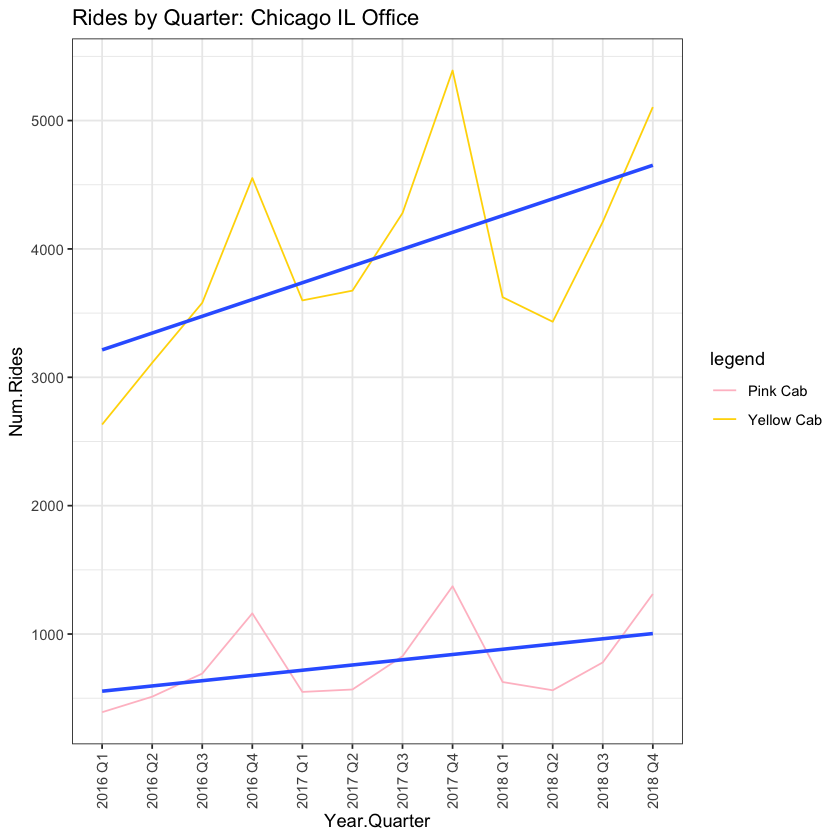

In [14]:
master_data %>%
    filter(City == 'CHICAGO IL') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'CHICAGO IL') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Chicago IL Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,73
2016 Q1,Yellow Cab,278
2016 Q2,Pink Cab,80
2016 Q2,Yellow Cab,349
2016 Q3,Pink Cab,109
2016 Q3,Yellow Cab,443
2016 Q4,Pink Cab,149
2016 Q4,Yellow Cab,575
2017 Q1,Pink Cab,92
2017 Q1,Yellow Cab,384


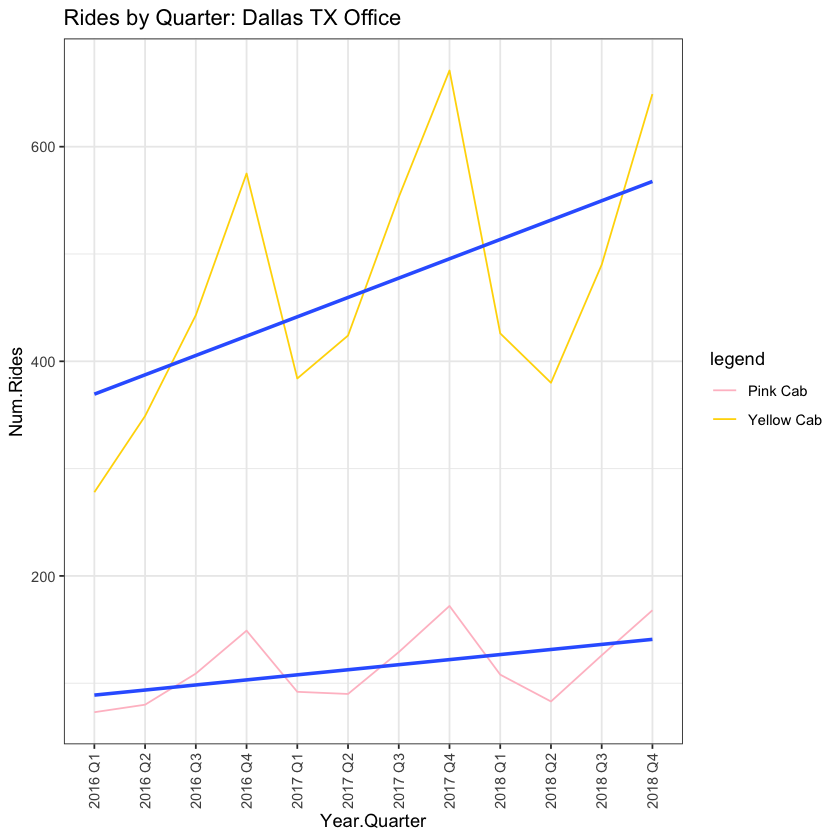

In [15]:
master_data %>%
    filter(City == 'DALLAS TX') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'DALLAS TX') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Dallas TX Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,46
2016 Q1,Yellow Cab,108
2016 Q2,Pink Cab,79
2016 Q2,Yellow Cab,142
2016 Q3,Pink Cab,119
2016 Q3,Yellow Cab,179
2016 Q4,Pink Cab,160
2016 Q4,Yellow Cab,273
2017 Q1,Pink Cab,81
2017 Q1,Yellow Cab,168


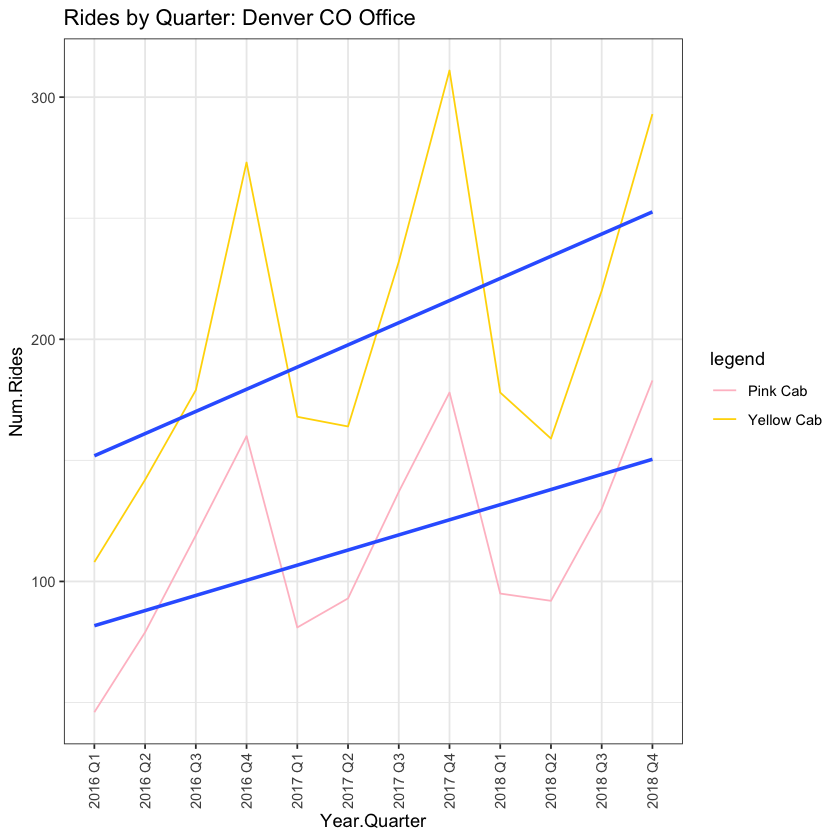

In [16]:
master_data %>%
    filter(City == 'DENVER CO') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'DENVER CO') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Denver CO Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,784
2016 Q1,Yellow Cab,1429
2016 Q2,Pink Cab,1234
2016 Q2,Yellow Cab,1842
2016 Q3,Pink Cab,1704
2016 Q3,Yellow Cab,2392
2016 Q4,Pink Cab,2115
2016 Q4,Yellow Cab,2821
2017 Q1,Pink Cab,1096
2017 Q1,Yellow Cab,1892


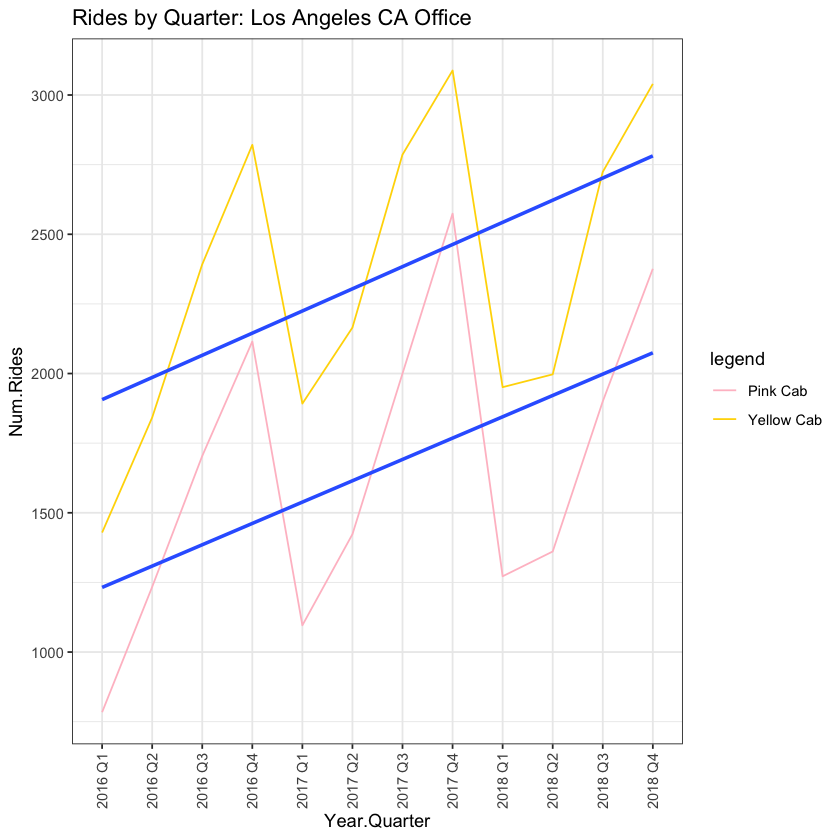

In [17]:
master_data %>%
    filter(City == 'LOS ANGELES CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'LOS ANGELES CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Los Angeles CA Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,61
2016 Q1,Yellow Cab,94
2016 Q2,Pink Cab,56
2016 Q2,Yellow Cab,149
2016 Q3,Pink Cab,197
2016 Q3,Yellow Cab,336
2016 Q4,Pink Cab,279
2016 Q4,Yellow Cab,674
2017 Q1,Pink Cab,88
2017 Q1,Yellow Cab,198


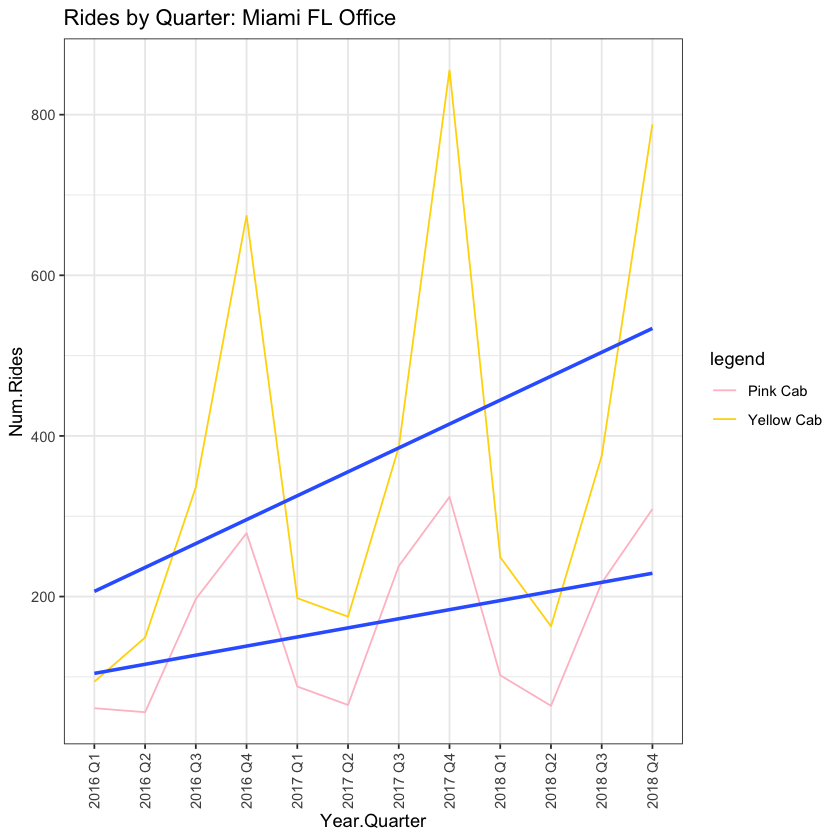

In [18]:
master_data %>%
    filter(City == 'MIAMI FL') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'MIAMI FL') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Miami FL Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,64
2016 Q1,Yellow Cab,43
2016 Q2,Pink Cab,119
2016 Q2,Yellow Cab,68
2016 Q3,Pink Cab,164
2016 Q3,Yellow Cab,102
2016 Q4,Pink Cab,199
2016 Q4,Yellow Cab,130
2017 Q1,Pink Cab,89
2017 Q1,Yellow Cab,60


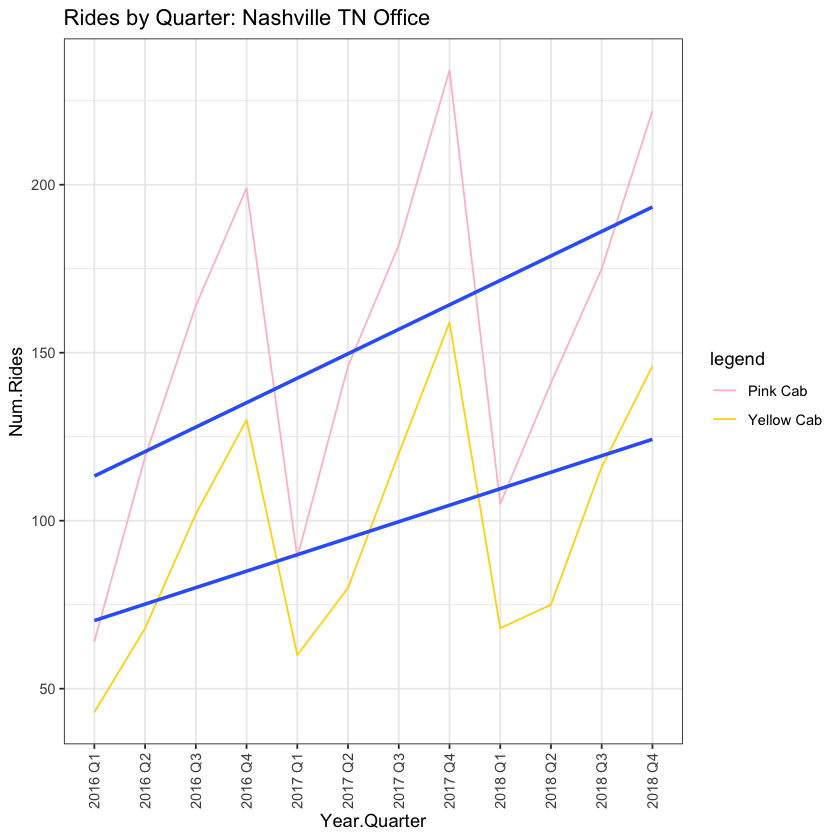

In [19]:
master_data %>%
    filter(City == 'NASHVILLE TN') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'NASHVILLE TN') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Nashville TN Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,312
2016 Q1,Yellow Cab,3655
2016 Q2,Pink Cab,482
2016 Q2,Yellow Cab,4822
2016 Q3,Pink Cab,1223
2016 Q3,Yellow Cab,6656
2016 Q4,Pink Cab,2011
2016 Q4,Yellow Cab,10138
2017 Q1,Pink Cab,532
2017 Q1,Yellow Cab,5171


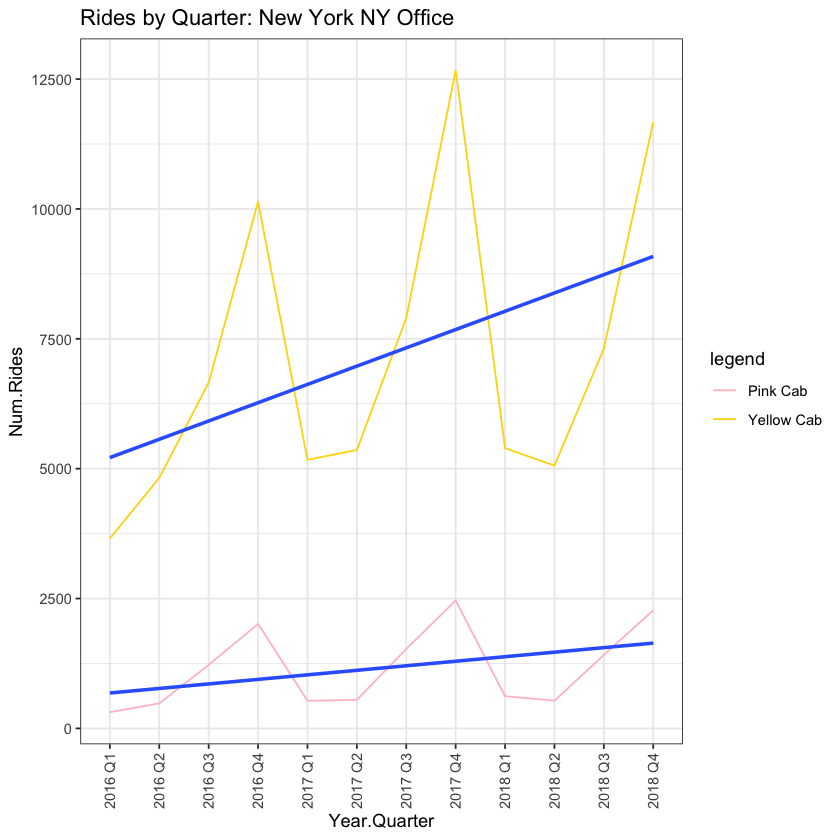

In [20]:
master_data %>%
    filter(City == 'NEW YORK NY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'NEW YORK NY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: New York NY Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,52
2016 Q1,Yellow Cab,74
2016 Q2,Pink Cab,67
2016 Q2,Yellow Cab,125
2016 Q3,Pink Cab,136
2016 Q3,Yellow Cab,216
2016 Q4,Pink Cab,179
2016 Q4,Yellow Cab,311
2017 Q1,Pink Cab,75
2017 Q1,Yellow Cab,122


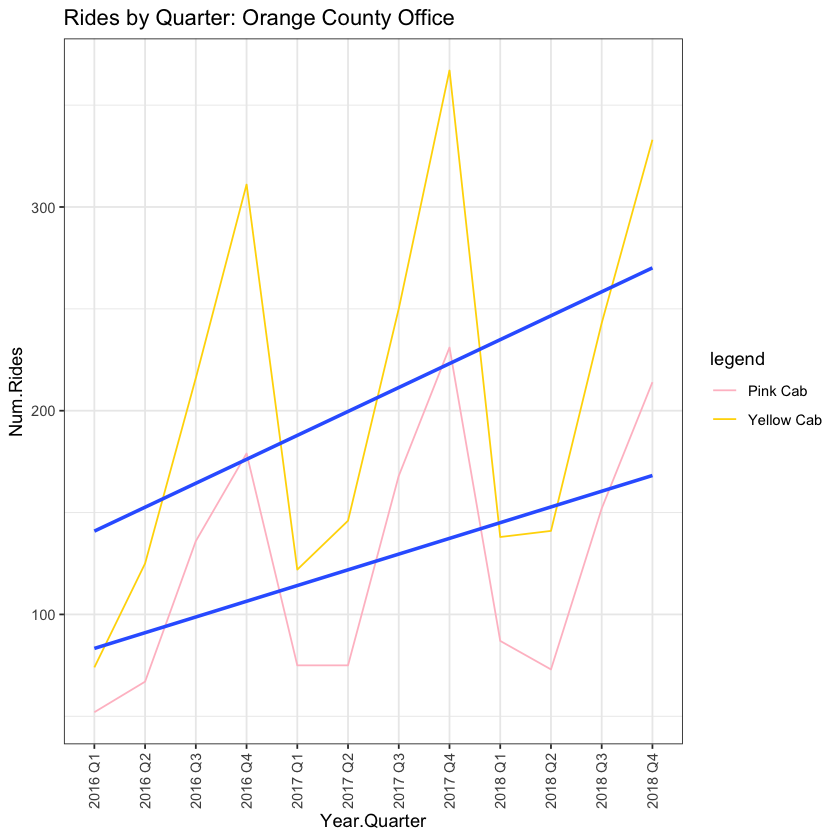

In [21]:
master_data %>%
    filter(City == 'ORANGE COUNTY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'ORANGE COUNTY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Orange County Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,40
2016 Q1,Yellow Cab,44
2016 Q2,Pink Cab,53
2016 Q2,Yellow Cab,70
2016 Q3,Pink Cab,76
2016 Q3,Yellow Cab,98
2016 Q4,Pink Cab,87
2016 Q4,Yellow Cab,132
2017 Q1,Pink Cab,54
2017 Q1,Yellow Cab,73


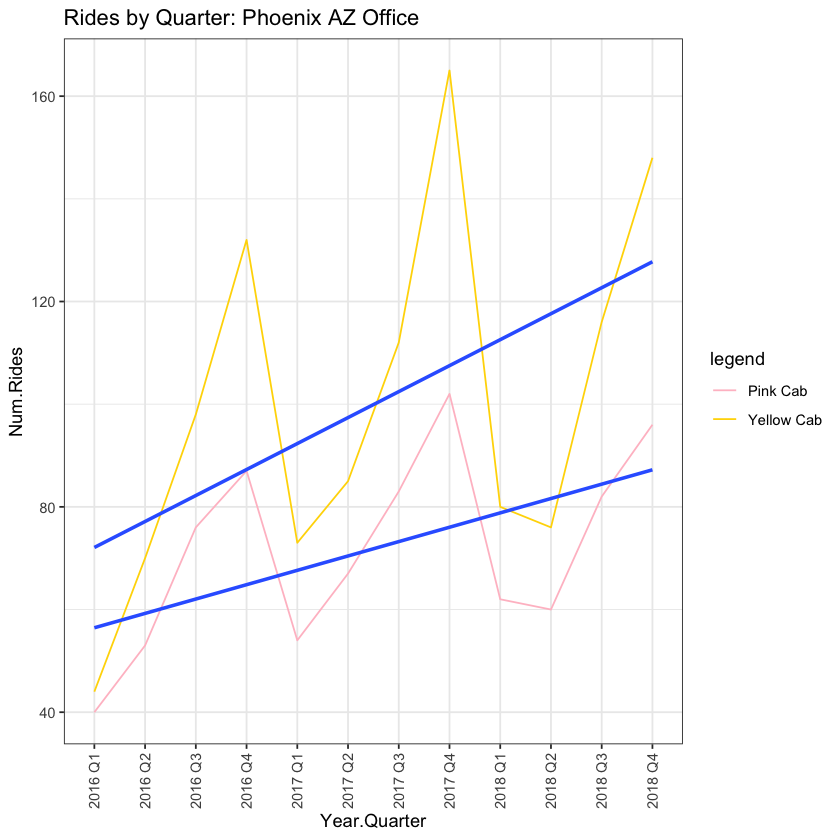

In [22]:
master_data %>%
    filter(City == 'PHOENIX AZ') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'PHOENIX AZ') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Phoenix AZ Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,12
2016 Q1,Yellow Cab,25
2016 Q2,Pink Cab,48
2016 Q2,Yellow Cab,40
2016 Q3,Pink Cab,62
2016 Q3,Yellow Cab,54
2016 Q4,Pink Cab,86
2016 Q4,Yellow Cab,72
2017 Q1,Pink Cab,17
2017 Q1,Yellow Cab,31


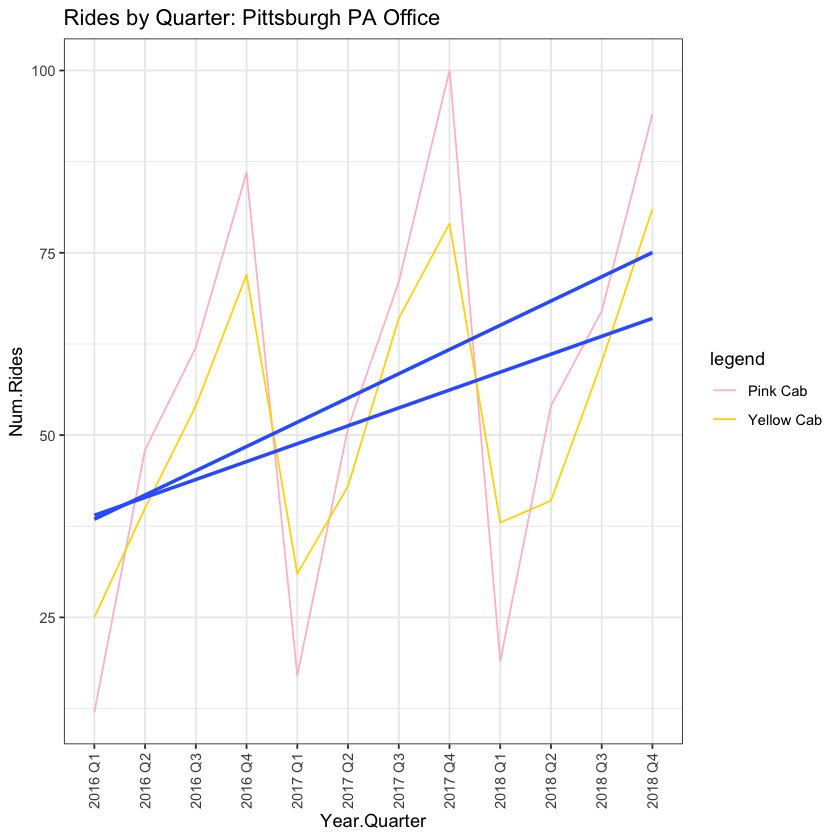

In [24]:
master_data %>%
    filter(City == 'PITTSBURGH PA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'PITTSBURGH PA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Pittsburgh PA Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,46
2016 Q1,Yellow Cab,50
2016 Q2,Pink Cab,85
2016 Q2,Yellow Cab,57
2016 Q3,Pink Cab,119
2016 Q3,Yellow Cab,83
2016 Q4,Pink Cab,133
2016 Q4,Yellow Cab,114
2017 Q1,Pink Cab,71
2017 Q1,Yellow Cab,69


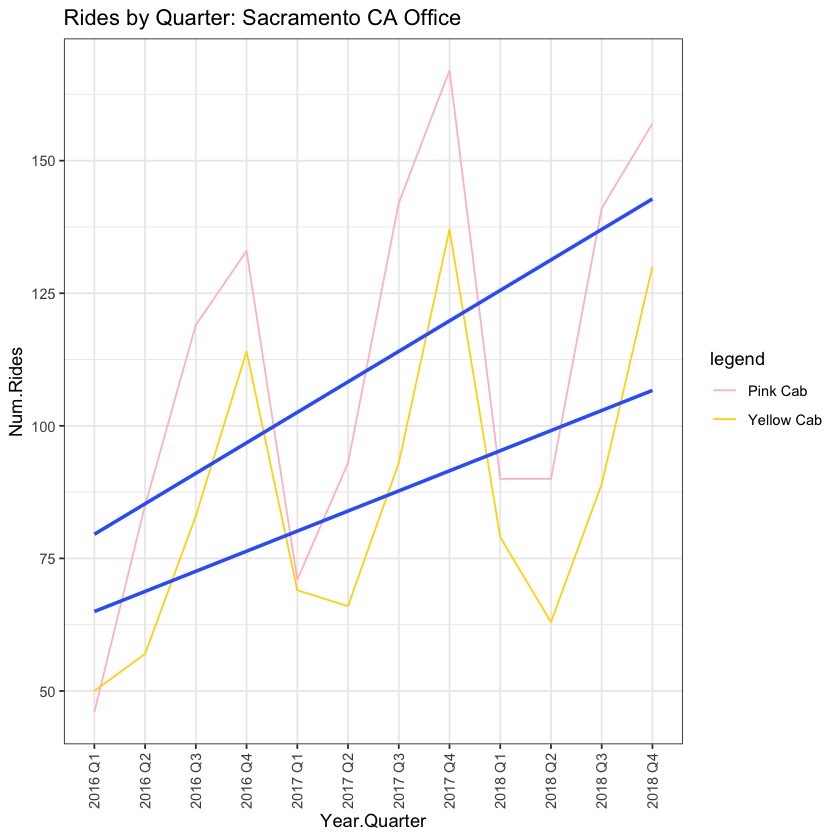

In [25]:
master_data %>%
    filter(City == 'SACRAMENTO CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'SACRAMENTO CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Sacramento CA Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,441
2016 Q1,Yellow Cab,443
2016 Q2,Pink Cab,618
2016 Q2,Yellow Cab,587
2016 Q3,Pink Cab,1023
2016 Q3,Yellow Cab,829
2016 Q4,Pink Cab,1055
2016 Q4,Yellow Cab,1033
2017 Q1,Pink Cab,620
2017 Q1,Yellow Cab,614


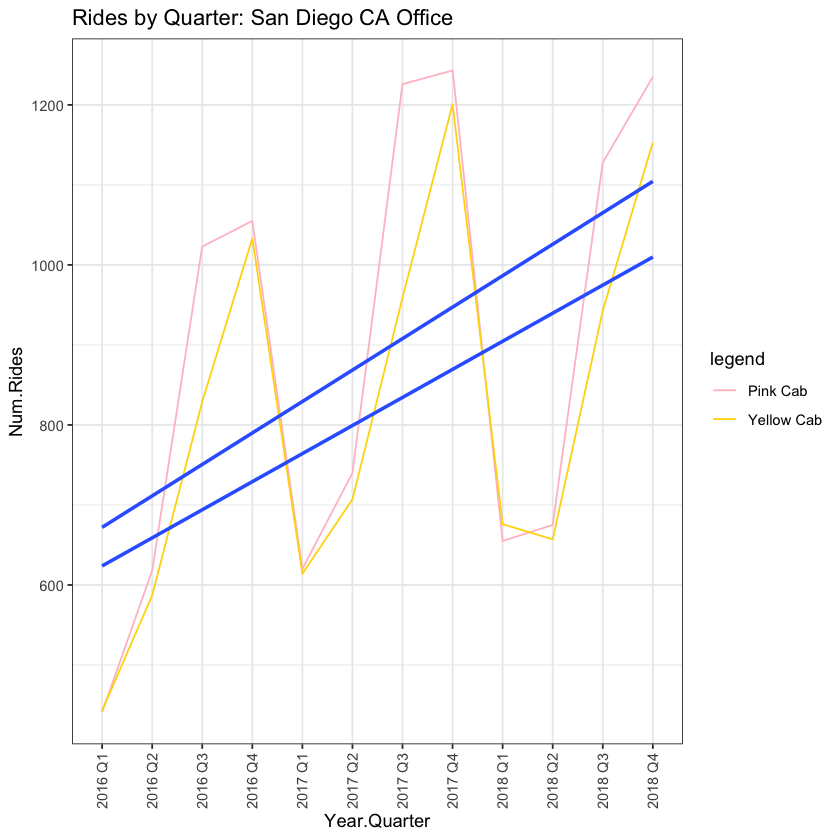

In [26]:
master_data %>%
    filter(City == 'SAN DIEGO CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'SAN DIEGO CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: San Diego CA Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,173
2016 Q1,Yellow Cab,315
2016 Q2,Pink Cab,165
2016 Q2,Yellow Cab,328
2016 Q3,Pink Cab,221
2016 Q3,Yellow Cab,427
2016 Q4,Pink Cab,278
2016 Q4,Yellow Cab,515
2017 Q1,Pink Cab,213
2017 Q1,Yellow Cab,391


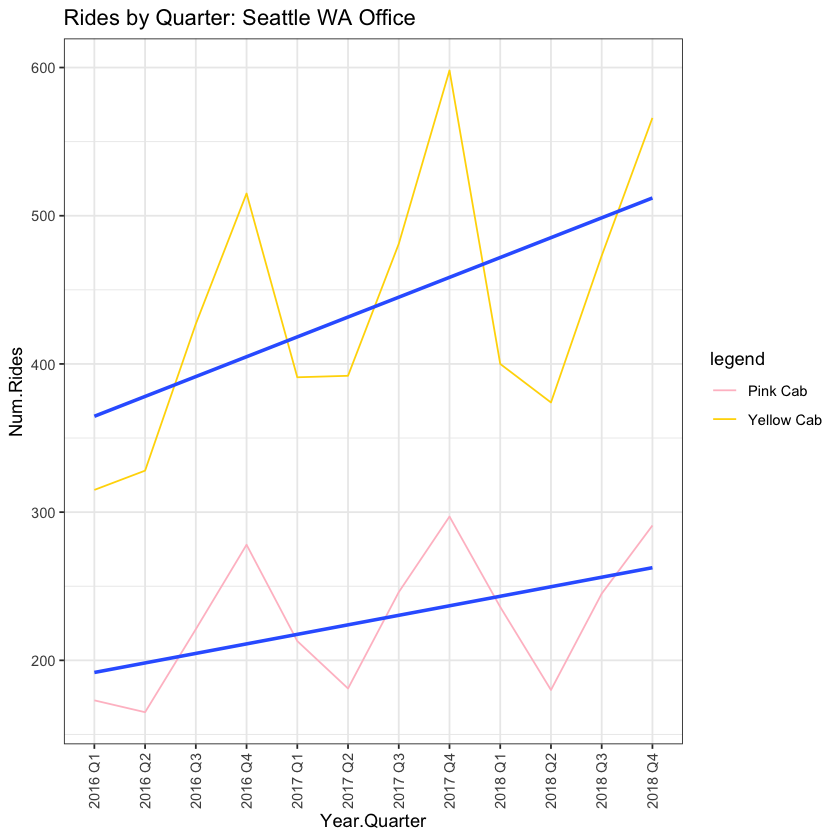

In [27]:
master_data %>%
    filter(City == 'SEATTLE WA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'SEATTLE WA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Seattle WA Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,130
2016 Q1,Yellow Cab,197
2016 Q2,Pink Cab,211
2016 Q2,Yellow Cab,264
2016 Q3,Pink Cab,316
2016 Q3,Yellow Cab,407
2016 Q4,Pink Cab,467
2016 Q4,Yellow Cab,545
2017 Q1,Pink Cab,191
2017 Q1,Yellow Cab,268


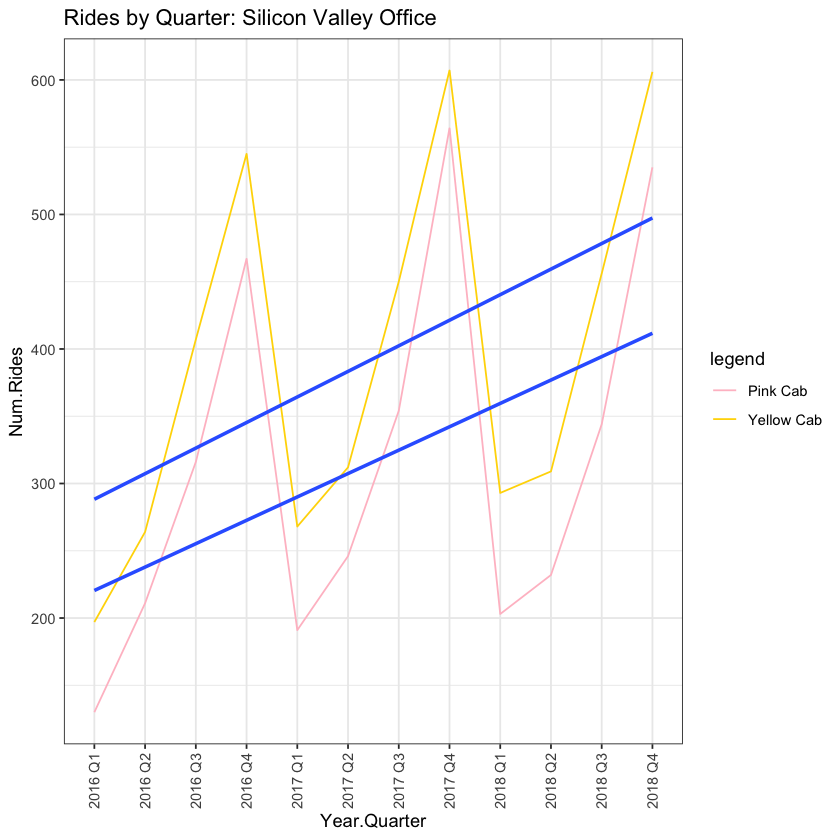

In [28]:
master_data %>%
    filter(City == 'SILICON VALLEY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'SILICON VALLEY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Silicon Valley Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,32
2016 Q1,Yellow Cab,47
2016 Q2,Pink Cab,42
2016 Q2,Yellow Cab,64
2016 Q3,Pink Cab,80
2016 Q3,Yellow Cab,88
2016 Q4,Pink Cab,79
2016 Q4,Yellow Cab,131
2017 Q1,Pink Cab,47
2017 Q1,Yellow Cab,71


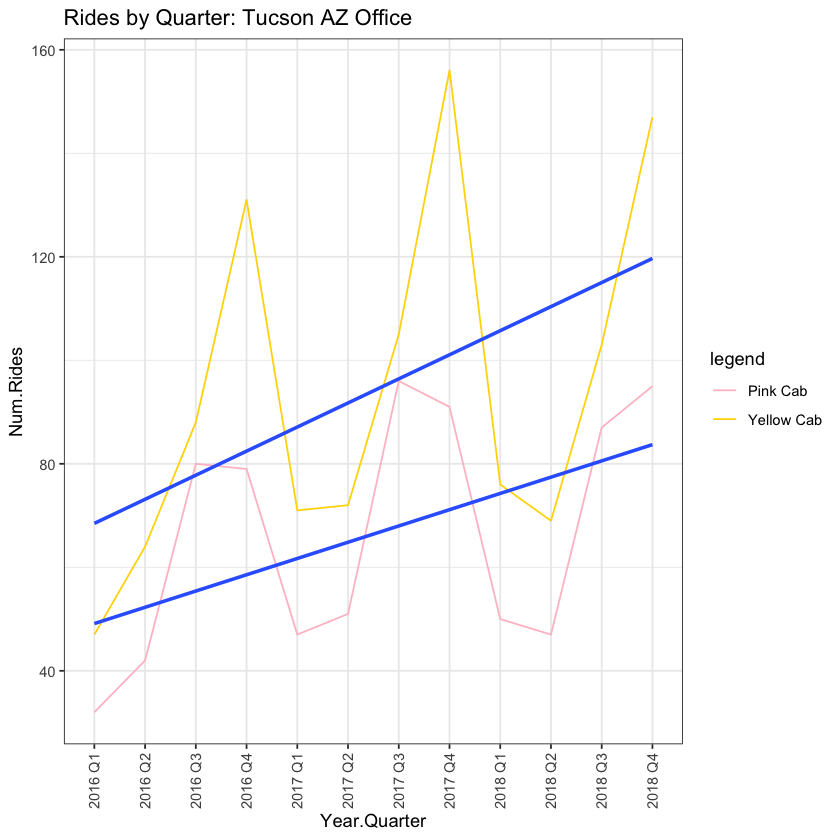

In [29]:
master_data %>%
    filter(City == 'TUCSON AZ') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'TUCSON AZ') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Tucson AZ Office')

Year.Quarter,Company,Num.Rides
2016 Q1,Pink Cab,168
2016 Q1,Yellow Cab,2239
2016 Q2,Pink Cab,208
2016 Q2,Yellow Cab,2735
2016 Q3,Pink Cab,269
2016 Q3,Yellow Cab,3223
2016 Q4,Pink Cab,442
2016 Q4,Yellow Cab,3911
2017 Q1,Pink Cab,222
2017 Q1,Yellow Cab,2935


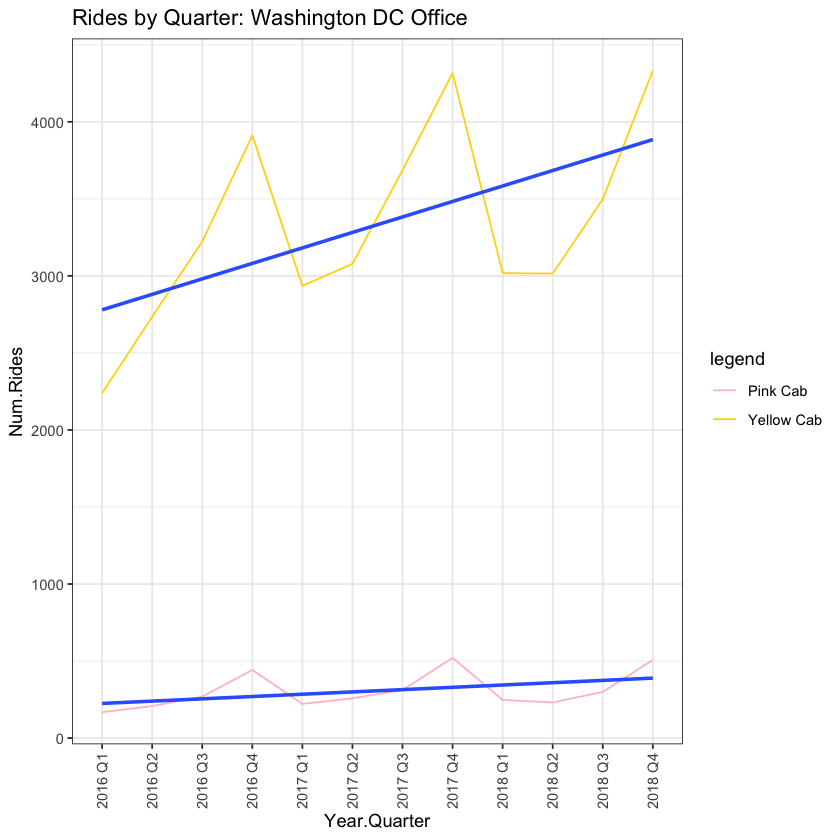

In [30]:
master_data %>%
    filter(City == 'WASHINGTON DC') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Num.Rides = n())
ggplot(master_data %>%
           filter(City == 'WASHINGTON DC') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Num.Rides = n()),
       aes(x = Year.Quarter, y = Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Rides by Quarter: Washington DC Office')

In most cities, Yellow Cab company provides more rides over time. This could either be because customers prefer Yellow Cab over Pink Cab company, or Yellow Cab company has more cabs available in each city. Unfortunately, we do not have any date on the number of cabs available for each city by each company.

***

Group by customer, city, & company & count the amount of times they've ridden with each company, calculate averages. Visualise across cities.

City,Avg.Num.Rides,Med.Num.Rides
ATLANTA GA,1.332576,1
AUSTIN TX,1.379719,1
BOSTON MA,2.103126,2
CHICAGO IL,3.270724,3
DALLAS TX,1.234557,1
DENVER CO,1.216594,1
LOS ANGELES CA,6.621829,6
MIAMI FL,1.353180,1
NASHVILLE TN,1.356932,1
NEW YORK NY,4.693706,5


City,Avg.Num.Rides,Med.Num.Rides
ATLANTA GA,2.230829,2
AUSTIN TX,1.580324,1
BOSTON MA,8.167835,8
CHICAGO IL,15.731000,16
DALLAS TX,2.196094,2
DENVER CO,1.444643,1
LOS ANGELES CA,9.381921,9
MIAMI FL,1.905620,2
NASHVILLE TN,1.211838,1
NEW YORK NY,28.599667,29


Company,Avg.Num.Rides,Med.Num.Rides
Pink Cab,2.618454,2
Yellow Cab,6.879063,3


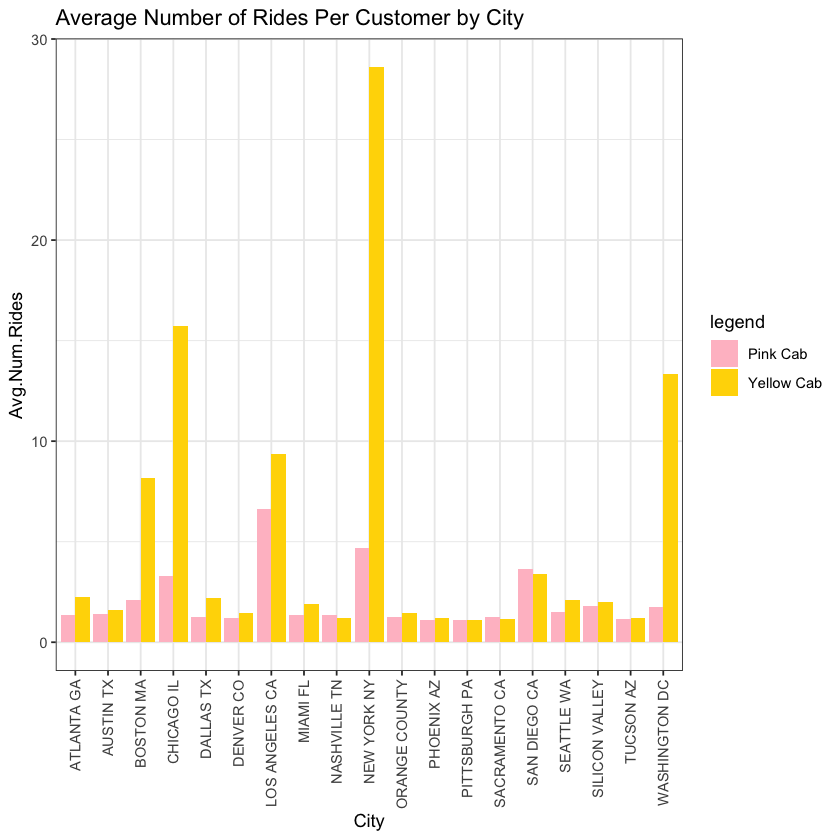

Year.Quarter,Company,Avg.Num.Rides,Med.Num.Rides
2016 Q1,Pink Cab,1.057325,1
2016 Q1,Yellow Cab,1.387496,1
2016 Q2,Pink Cab,1.099878,1
2016 Q2,Yellow Cab,1.484987,1
2016 Q3,Pink Cab,1.148054,1
2016 Q3,Yellow Cab,1.613013,1
2016 Q4,Pink Cab,1.200529,1
2016 Q4,Yellow Cab,1.840243,1
2017 Q1,Pink Cab,1.090450,1
2017 Q1,Yellow Cab,1.531793,1


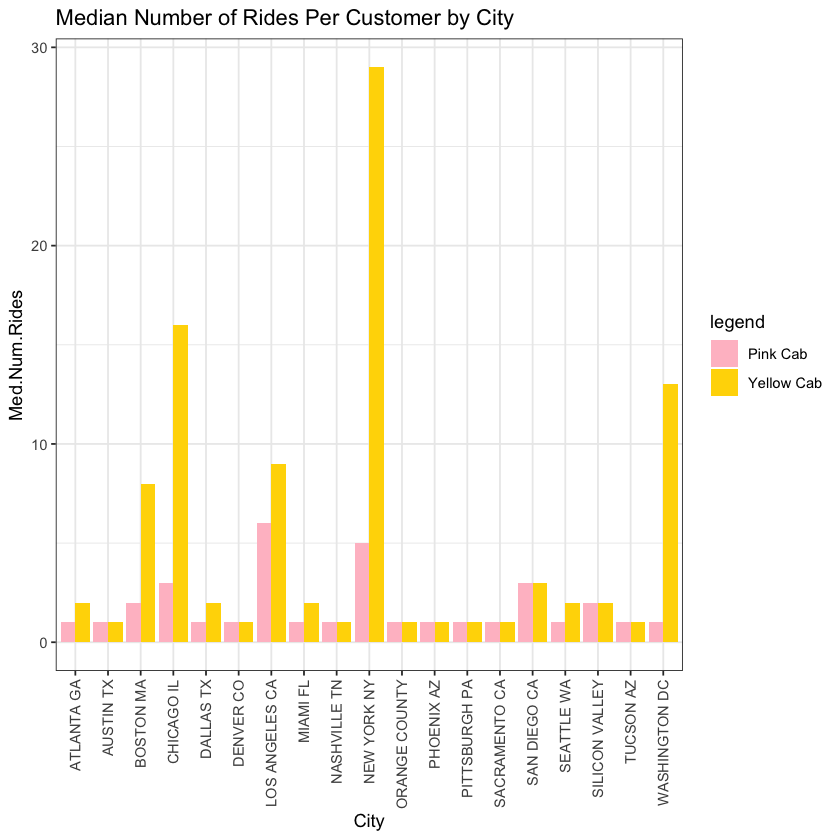

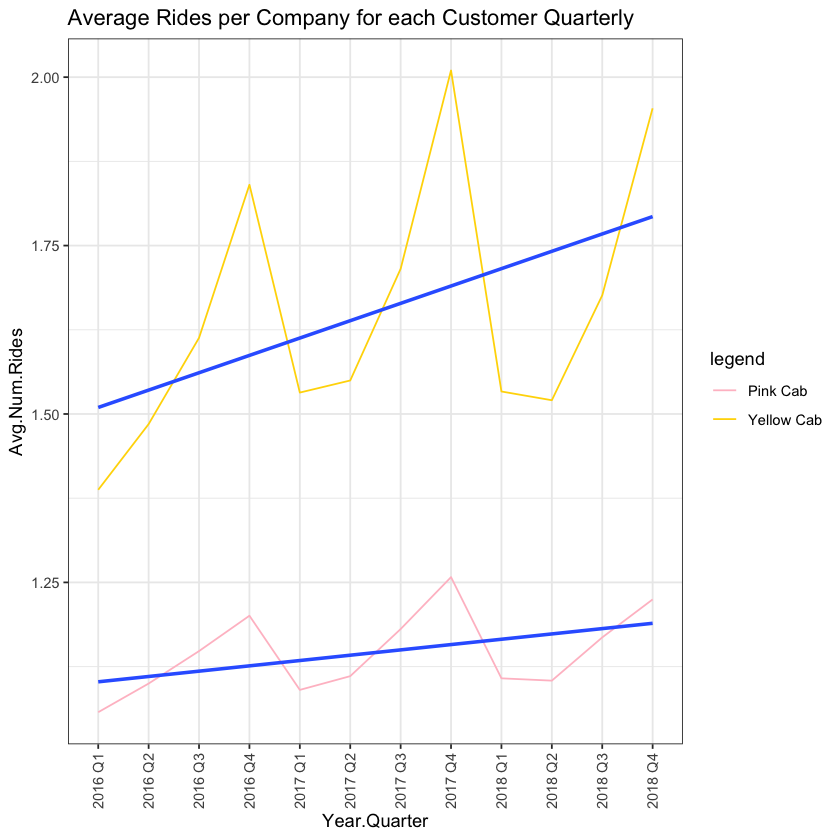

In [139]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(Customer.ID, City) %>%
    summarise(Num.Rides = n()) %>%
    group_by(City) %>%
    summarise(Avg.Num.Rides = mean(Num.Rides),
              Med.Num.Rides = median(Num.Rides))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(Customer.ID, City) %>%
    summarise(Num.Rides = n()) %>%
    group_by(City) %>%
    summarise(Avg.Num.Rides = mean(Num.Rides),
              Med.Num.Rides = median(Num.Rides))
master_data %>%
    group_by(Customer.ID, Company) %>%
    summarise(Num.Rides = n()) %>%
    group_by(Company) %>%
    summarise(Avg.Num.Rides = mean(Num.Rides),
              Med.Num.Rides = median(Num.Rides))
ggplot(master_data %>%
           group_by(Customer.ID, City, Company) %>%
           summarise(Num.Rides = n()) %>%
           group_by(City, Company) %>%
           summarise(Avg.Num.Rides = mean(Num.Rides)),
       aes(x = City, y = Avg.Num.Rides, fill = Company)) + 
    geom_bar(position = 'dodge', stat = 'identity') +
    scale_fill_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Number of Rides Per Customer by City')

ggplot(master_data %>%
           group_by(Customer.ID, City, Company) %>%
           summarise(Num.Rides = n()) %>%
           group_by(City, Company) %>%
           summarise(Med.Num.Rides = median(Num.Rides)),
       aes(x = City, y = Med.Num.Rides, fill = Company)) + 
    geom_bar(position = 'dodge', stat = 'identity') +
    scale_fill_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Median Number of Rides Per Customer by City')

master_data %>%
    group_by(Year.Quarter, Customer.ID, Company) %>%
    summarise(Num.Rides = n()) %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.Num.Rides = mean(Num.Rides),
              Med.Num.Rides = median(Num.Rides)) 
ggplot(master_data %>%
           group_by(Year.Quarter, Customer.ID, Company) %>%
           summarise(Num.Rides = n()) %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.Num.Rides = mean(Num.Rides),
                     Med.Num.Rides = median(Num.Rides)),
       aes(x = Year.Quarter, y = Avg.Num.Rides, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Rides per Company for each Customer Quarterly')

In 15 of 19 cities, the average number of rides each customer purchases from Yellow Cab company is greater than from Pink Cab company. In Nashville, Pittsburg, San Diego, & Sacramento, the average number of rides per customer from Yellow Cab company is less than from Pink Cab company, but not by much. Matter of fact, in cities like Boston, Chicago, New York, & Washington DC, the average number of rides each customer purchases from Yellow Cab company dwarfs the average number of rides each customer purchases from Pink Cab company. Provided is also a visualisation of the median number of rides each customer purchases from each company, on the off chance there is a customer who has a strangely high number of cab rides for any company, skewing the averages. In none of the cities does Pink Cab company beat Yellow Cab company in median number of rides purchased per customer. They either tie or Yellow Cab company beats Pink Cab company. Whether or not customers prefer the Yellow Cab company to the Pink Cab company is unknown, because we don't know the number of deployed cabs each company has in each city. Maybe customers ride more with one company because that company is more established & has more cabs available. There could be some convenience bias. It could even be both. Like the comparison between Coca-Cola & Pepsi, people prefer to buy Coca-Cola over Pepsi, because it is the more seasoned, established company. Whatever the reasoning is, Yellow Cab company performs better than Pink Cab company for number of rides per customer, showing that customer retention is better in the Yellow Cab company.

***

**Profit per ride by city (over time too), profit by kilometer by city (over time too)**

Group by city & company, sum of profits, visualise across cities. Also visualise profits across time per office.

City,TotalProfit
ATLANTA GA,95861.37
AUSTIN TX,147032.77
BOSTON MA,261741.45
CHICAGO IL,318412.58
DALLAS TX,24701.02
DENVER CO,40475.93
LOS ANGELES CA,1124586.56
MIAMI FL,162290.22
NASHVILLE TN,64245.13
NEW YORK NY,1508749.50


City,TotalProfit
ATLANTA GA,746044.21
AUSTIN TX,378873.65
BOSTON MA,1506477.19
CHICAGO IL,3067406.41
DALLAS TX,1102360.99
DENVER CO,356417.47
LOS ANGELES CA,3281844.92
MIAMI FL,595222.41
NASHVILLE TN,85034.70
NEW YORK NY,26427730.13


Company,TotalProfit
Pink Cab,5298866
Yellow Cab,43983011


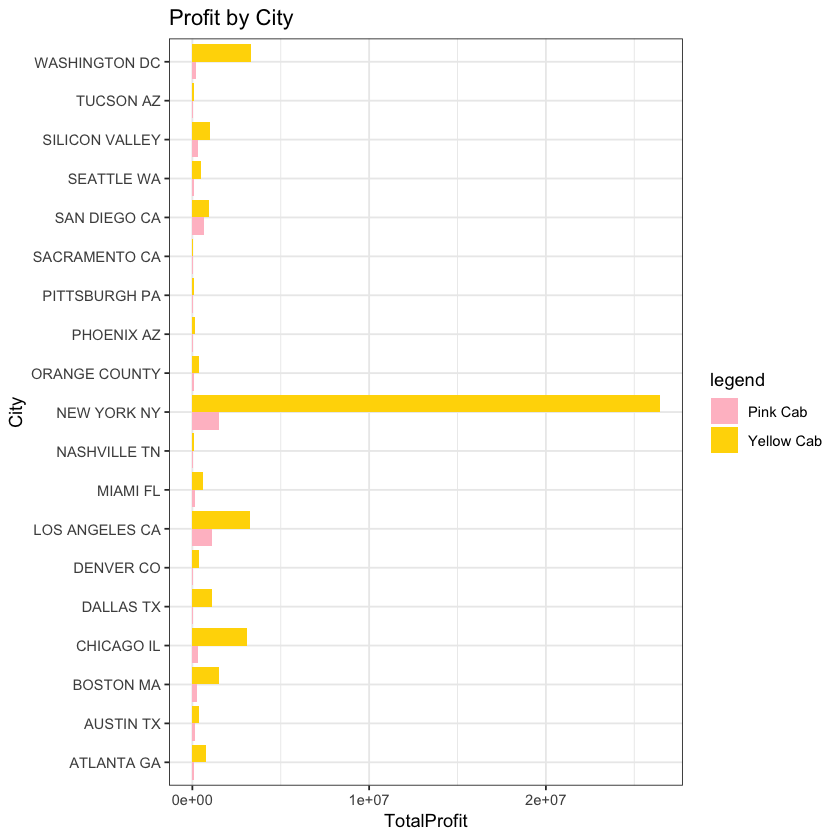

In [100]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(City) %>%
    summarise(TotalProfit = sum(Profit))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(City) %>%
    summarise(TotalProfit = sum(Profit))
master_data %>%
    group_by(Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           group_by(City, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = City, y = TotalProfit, fill = Company)) +
    geom_bar(position = 'dodge', stat = 'identity') +
    scale_fill_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    coord_flip() +
    labs(title = 'Profit by City')

Immediately, we can see from the visualisation that Yellow Cab company makes an incredible amount of profit in New York compared to Pink Cab company. The figure does not do a very good job at displaying the differences in profit earned for other cities, but the tables make it very clear. Complete sweep. In every city, Yellow Cab company generates more earnings than Pink Cab company does. Overall, Yellow Cab company generated more than eight times more profit than Pink Cab company did.

Year.Quarter,TotalProfit
2016 Q1,246419.3
2016 Q2,214305.9
2016 Q3,380463.3
2016 Q4,845269.4
2017 Q1,372939.0
2017 Q2,256487.2
2017 Q3,455932.5
2017 Q4,948076.9
2018 Q1,343659.4
2018 Q2,179739.2


Year.Quarter,TotalProfit
2016 Q1,2731853
2016 Q2,3457295
2016 Q3,3183972
2016 Q4,4413818
2017 Q1,3610597
2017 Q2,3950932
2017 Q3,3677853
2017 Q4,5347232
2018 Q1,3132749
2018 Q2,3222367


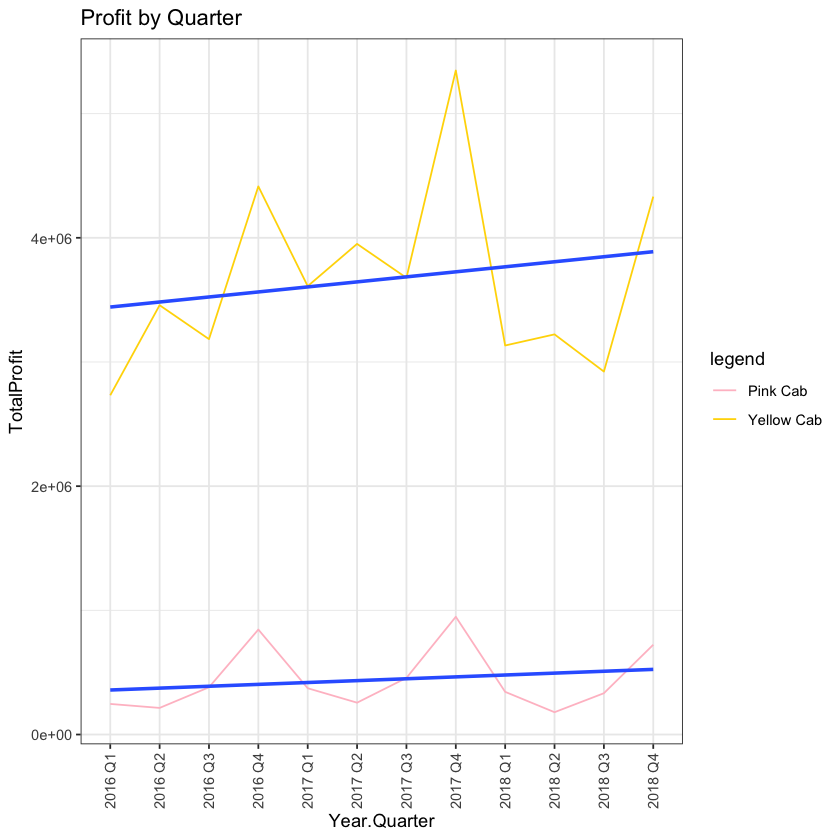

In [102]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(TotalProfit = sum(Profit))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter')

Overall, Yellow Cab company posted more revenue per quarter over the time period provided by the data set than Pink Cab company. Here's the comparison of the companies in each of their offices.

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,3545.38
2016 Q1,Yellow Cab,56357.40
2016 Q2,Pink Cab,5255.72
2016 Q2,Yellow Cab,64133.85
2016 Q3,Pink Cab,8459.23
2016 Q3,Yellow Cab,39935.54
2016 Q4,Pink Cab,16786.73
2016 Q4,Yellow Cab,68010.41
2017 Q1,Pink Cab,5273.46
2017 Q1,Yellow Cab,67970.17


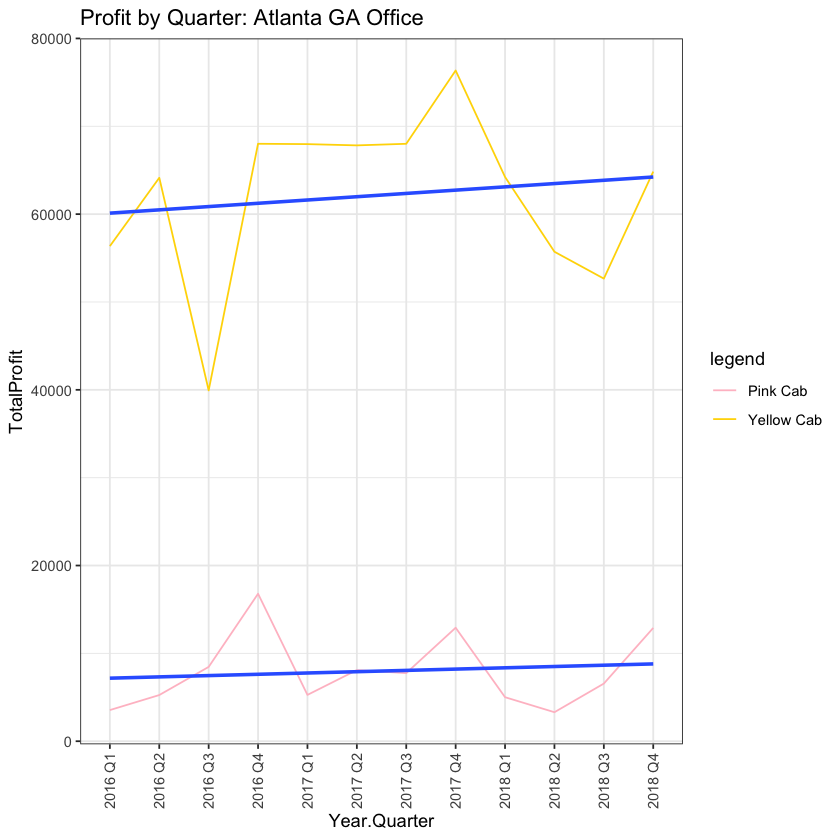

In [104]:
master_data %>%
    filter(City == 'ATLANTA GA') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'ATLANTA GA') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Atlanta GA Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,2402.47
2016 Q1,Yellow Cab,19590.19
2016 Q2,Pink Cab,3047.87
2016 Q2,Yellow Cab,27916.40
2016 Q3,Pink Cab,10562.99
2016 Q3,Yellow Cab,31674.92
2016 Q4,Pink Cab,25722.15
2016 Q4,Yellow Cab,45492.39
2017 Q1,Pink Cab,5734.77
2017 Q1,Yellow Cab,28342.15


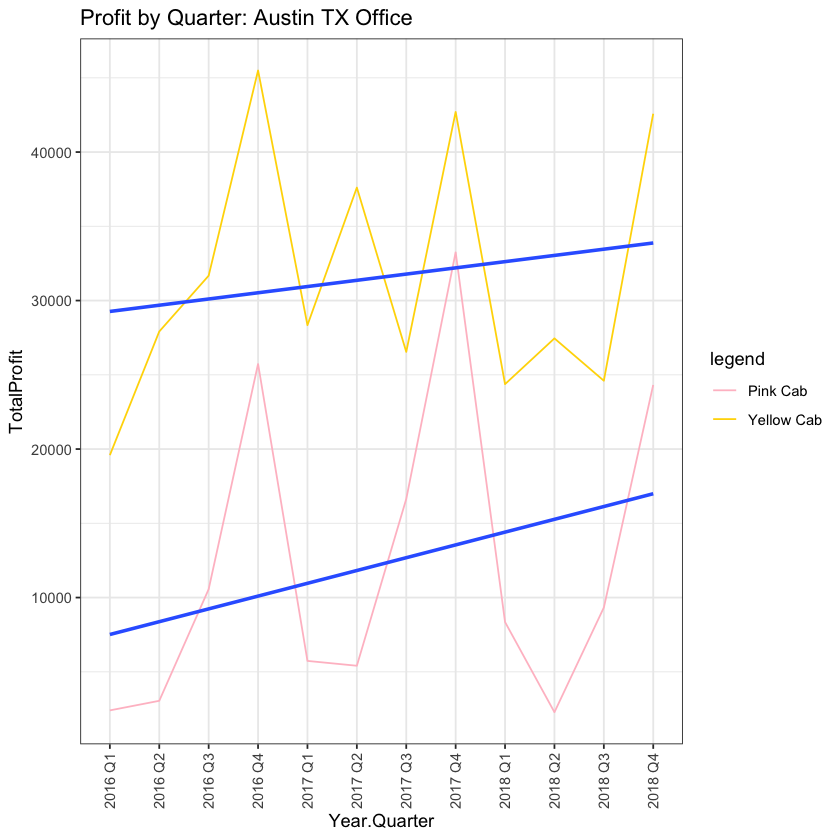

In [105]:
master_data %>%
    filter(City == 'AUSTIN TX') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'AUSTIN TX') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Austin TX Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,8597.42
2016 Q1,Yellow Cab,133319.02
2016 Q2,Pink Cab,9794.16
2016 Q2,Yellow Cab,108043.31
2016 Q3,Pink Cab,15813.86
2016 Q3,Yellow Cab,111045.46
2016 Q4,Pink Cab,57387.37
2016 Q4,Yellow Cab,139618.78
2017 Q1,Pink Cab,14161.04
2017 Q1,Yellow Cab,140378.10


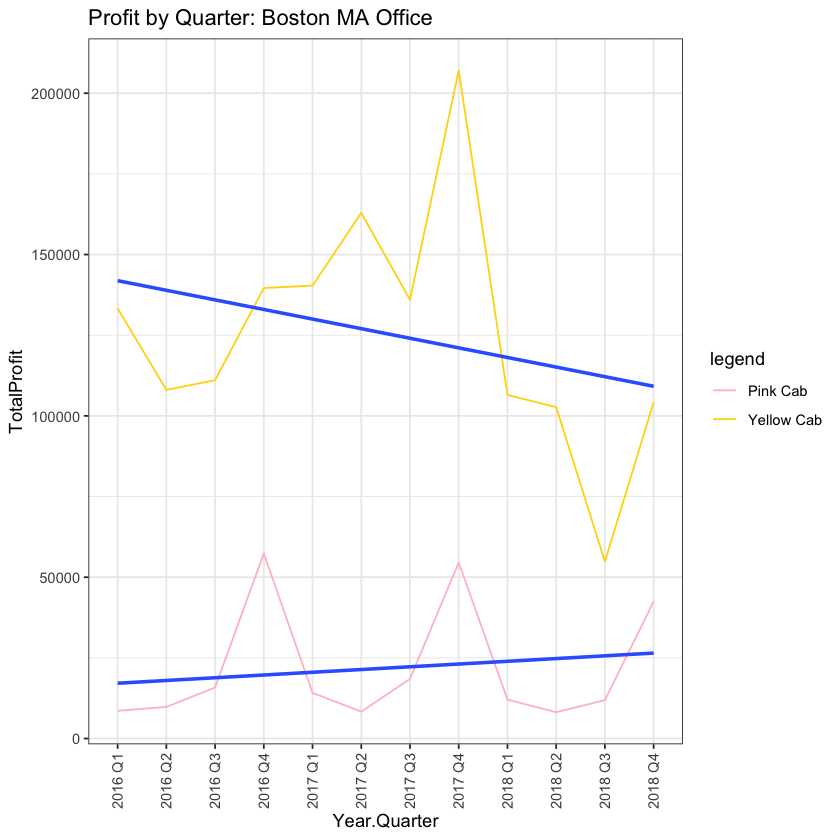

In [106]:
master_data %>%
    filter(City == 'BOSTON MA') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'BOSTON MA') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Boston MA Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,24674.76
2016 Q1,Yellow Cab,240394.82
2016 Q2,Pink Cab,20413.90
2016 Q2,Yellow Cab,350582.56
2016 Q3,Pink Cab,7483.36
2016 Q3,Yellow Cab,210987.72
2016 Q4,Pink Cab,59625.76
2016 Q4,Yellow Cab,286178.21
2017 Q1,Pink Cab,31788.46
2017 Q1,Yellow Cab,381509.06


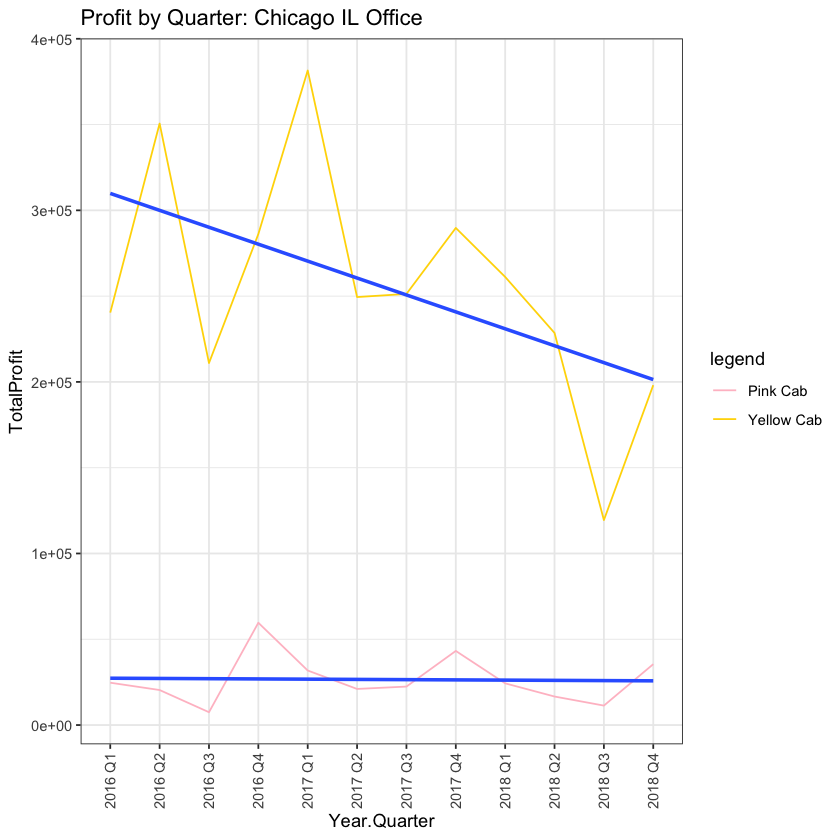

In [107]:
master_data %>%
    filter(City == 'CHICAGO IL') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'CHICAGO IL') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Chicago IL Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,-931.34
2016 Q1,Yellow Cab,78994.81
2016 Q2,Pink Cab,-884.54
2016 Q2,Yellow Cab,92556.71
2016 Q3,Pink Cab,1903.18
2016 Q3,Yellow Cab,78846.68
2016 Q4,Pink Cab,8541.56
2016 Q4,Yellow Cab,95418.04
2017 Q1,Pink Cab,844.37
2017 Q1,Yellow Cab,86088.34


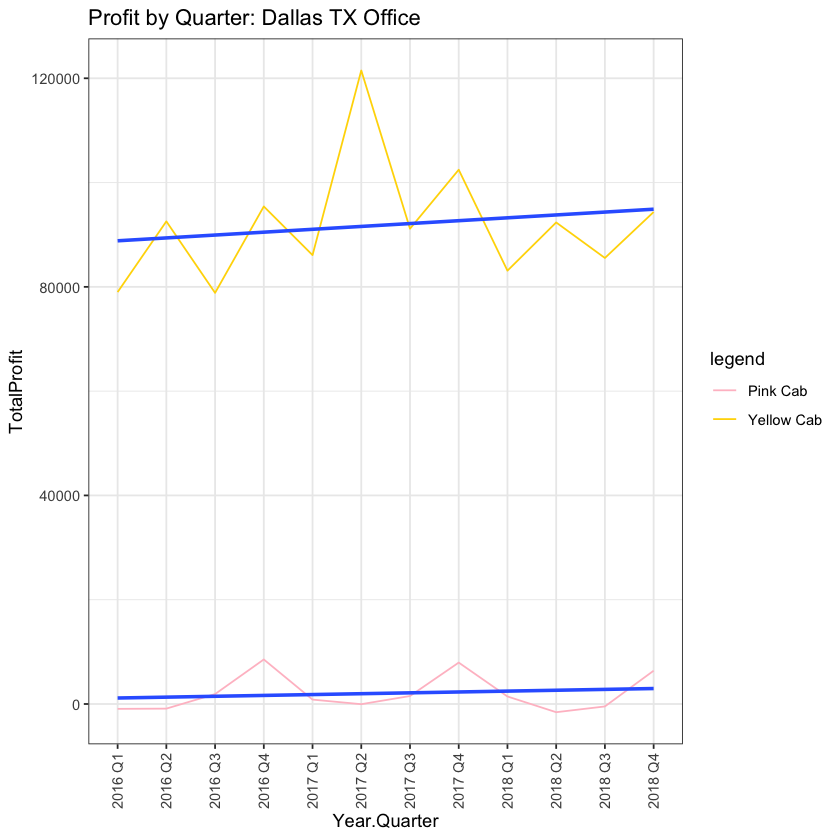

In [108]:
master_data %>%
    filter(City == 'DALLAS TX') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'DALLAS TX') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Dallas TX Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,-106.29
2016 Q1,Yellow Cab,24385.27
2016 Q2,Pink Cab,1946.40
2016 Q2,Yellow Cab,23039.90
2016 Q3,Pink Cab,2073.06
2016 Q3,Yellow Cab,26021.10
2016 Q4,Pink Cab,9921.17
2016 Q4,Yellow Cab,35677.03
2017 Q1,Pink Cab,588.18
2017 Q1,Yellow Cab,29893.16


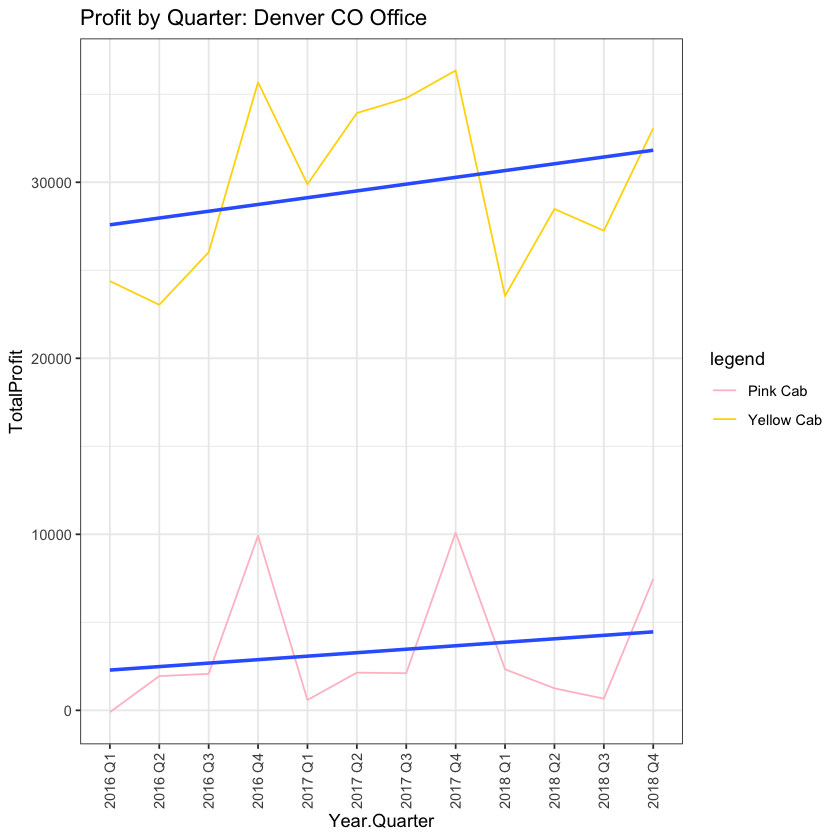

In [109]:
master_data %>%
    filter(City == 'DENVER CO') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'DENVER CO') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Denver CO Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,83407.42
2016 Q1,Yellow Cab,259900.34
2016 Q2,Pink Cab,69942.65
2016 Q2,Yellow Cab,321208.66
2016 Q3,Pink Cab,91549.06
2016 Q3,Yellow Cab,215129.51
2016 Q4,Pink Cab,130131.95
2016 Q4,Yellow Cab,307278.19
2017 Q1,Pink Cab,113024.34
2017 Q1,Yellow Cab,316092.20


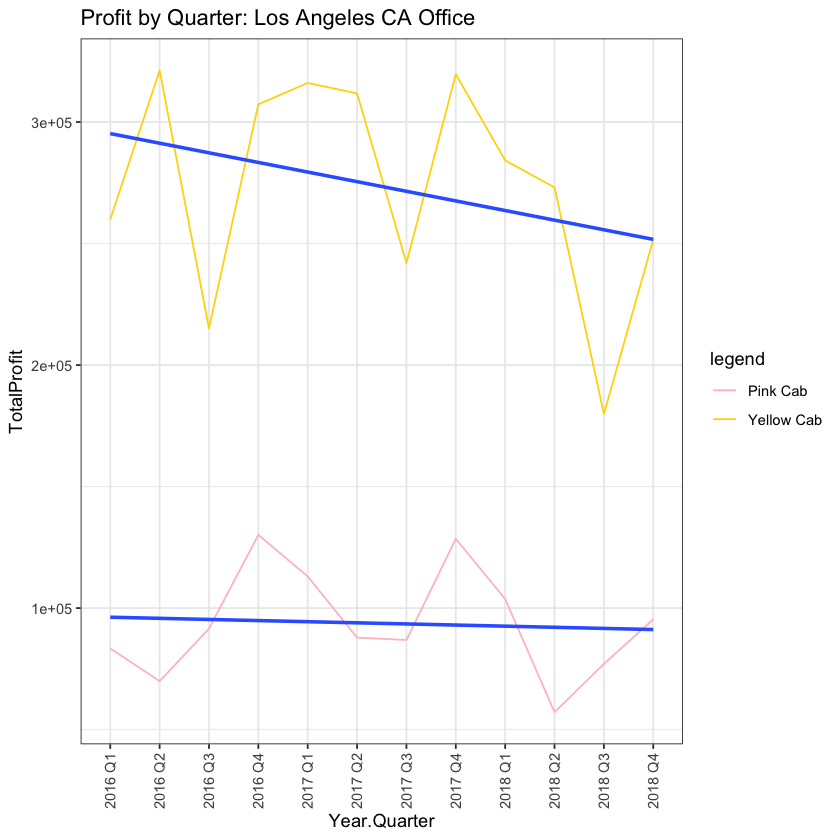

In [110]:
master_data %>%
    filter(City == 'LOS ANGELES CA') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'LOS ANGELES CA') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Los Angeles CA Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,5674.79
2016 Q1,Yellow Cab,19758.23
2016 Q2,Pink Cab,-585.52
2016 Q2,Yellow Cab,29605.14
2016 Q3,Pink Cab,19111.98
2016 Q3,Yellow Cab,57477.90
2016 Q4,Pink Cab,26032.82
2016 Q4,Yellow Cab,72399.55
2017 Q1,Pink Cab,8981.28
2017 Q1,Yellow Cab,34181.52


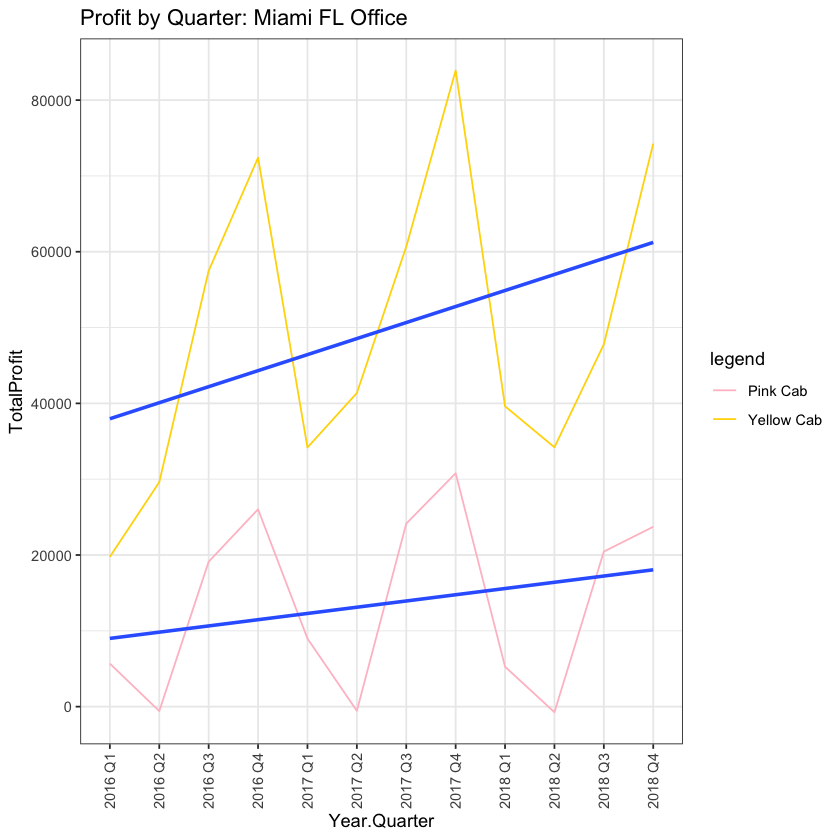

In [111]:
master_data %>%
    filter(City == 'MIAMI FL') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'MIAMI FL') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Miami FL Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,2926.08
2016 Q1,Yellow Cab,5542.89
2016 Q2,Pink Cab,2085.17
2016 Q2,Yellow Cab,5732.13
2016 Q3,Pink Cab,7425.24
2016 Q3,Yellow Cab,6112.10
2016 Q4,Pink Cab,7470.24
2016 Q4,Yellow Cab,12279.64
2017 Q1,Pink Cab,5840.21
2017 Q1,Yellow Cab,5769.20


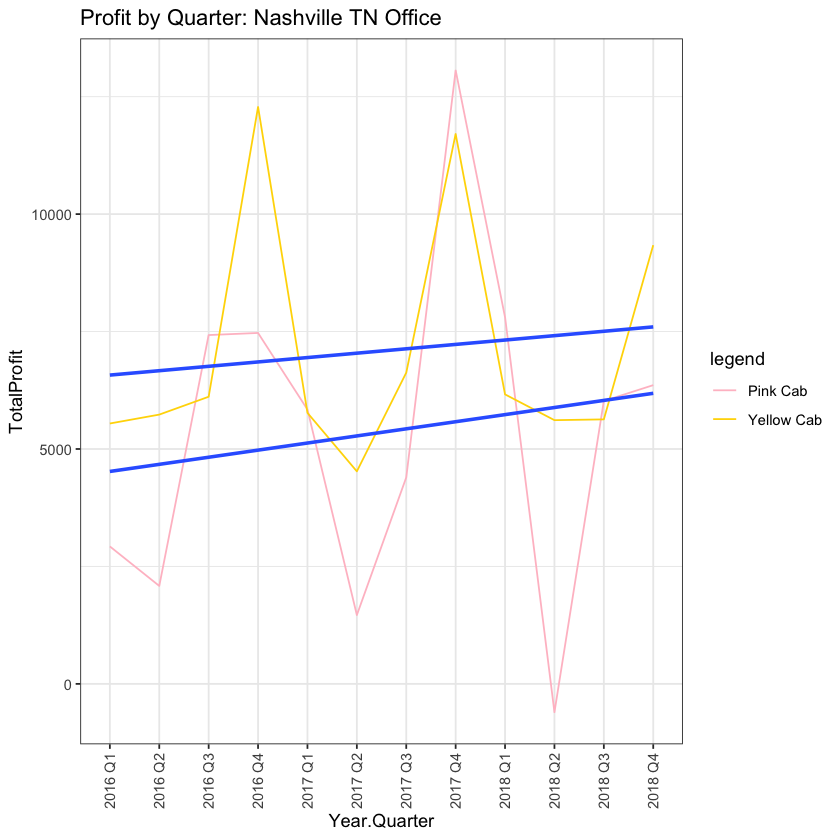

In [112]:
master_data %>%
    filter(City == 'NASHVILLE TN') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'NASHVILLE TN') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Nashville TN Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,35010.19
2016 Q1,Yellow Cab,1449930.15
2016 Q2,Pink Cab,23513.71
2016 Q2,Yellow Cab,1878671.15
2016 Q3,Pink Cab,87887.83
2016 Q3,Yellow Cab,1990901.57
2016 Q4,Pink Cab,303652.73
2016 Q4,Yellow Cab,2848159.70
2017 Q1,Pink Cab,65723.68
2017 Q1,Yellow Cab,1876764.62


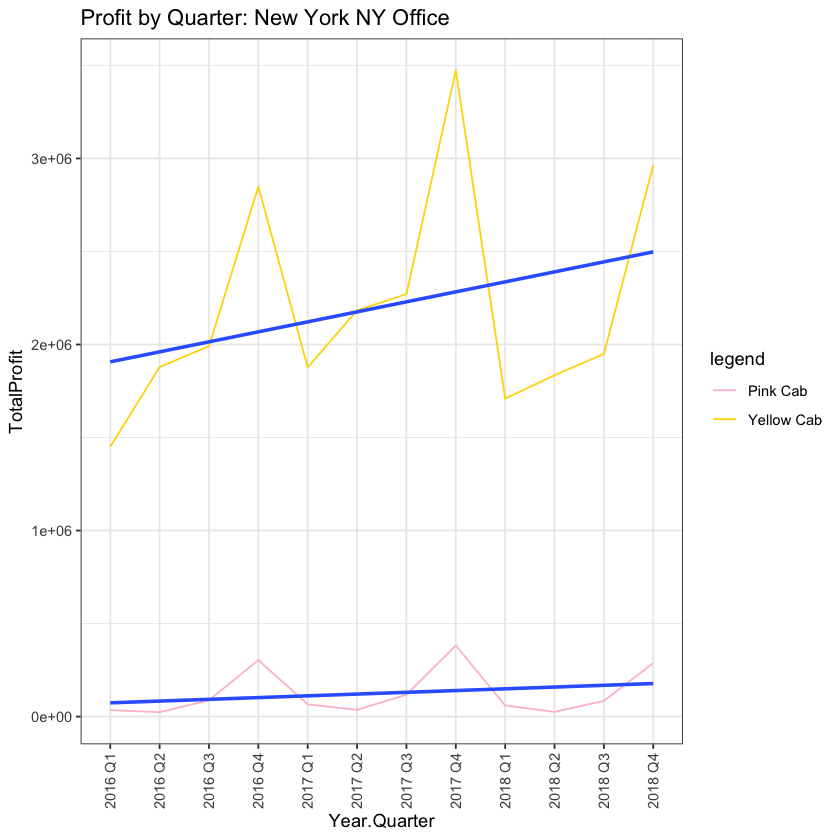

In [113]:
master_data %>%
    filter(City == 'NEW YORK NY') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'NEW YORK NY') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: New York NY Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,4835.32
2016 Q1,Yellow Cab,24292.76
2016 Q2,Pink Cab,2002.18
2016 Q2,Yellow Cab,31940.38
2016 Q3,Pink Cab,11368.48
2016 Q3,Yellow Cab,26025.36
2016 Q4,Pink Cab,10481.53
2016 Q4,Yellow Cab,28810.49
2017 Q1,Pink Cab,8970.98
2017 Q1,Yellow Cab,33261.55


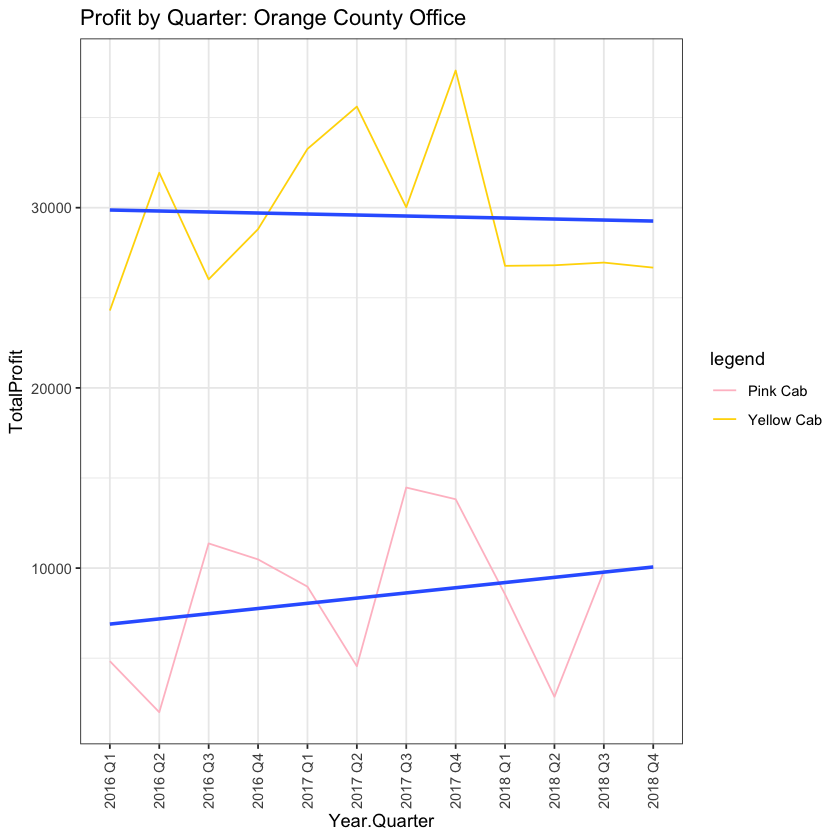

In [114]:
master_data %>%
    filter(City == 'ORANGE COUNTY') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'ORANGE COUNTY') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Orange County Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,2679.60
2016 Q1,Yellow Cab,10080.66
2016 Q2,Pink Cab,1246.64
2016 Q2,Yellow Cab,13484.61
2016 Q3,Pink Cab,4474.89
2016 Q3,Yellow Cab,11015.76
2016 Q4,Pink Cab,3931.31
2016 Q4,Yellow Cab,17082.10
2017 Q1,Pink Cab,3083.85
2017 Q1,Yellow Cab,10480.36


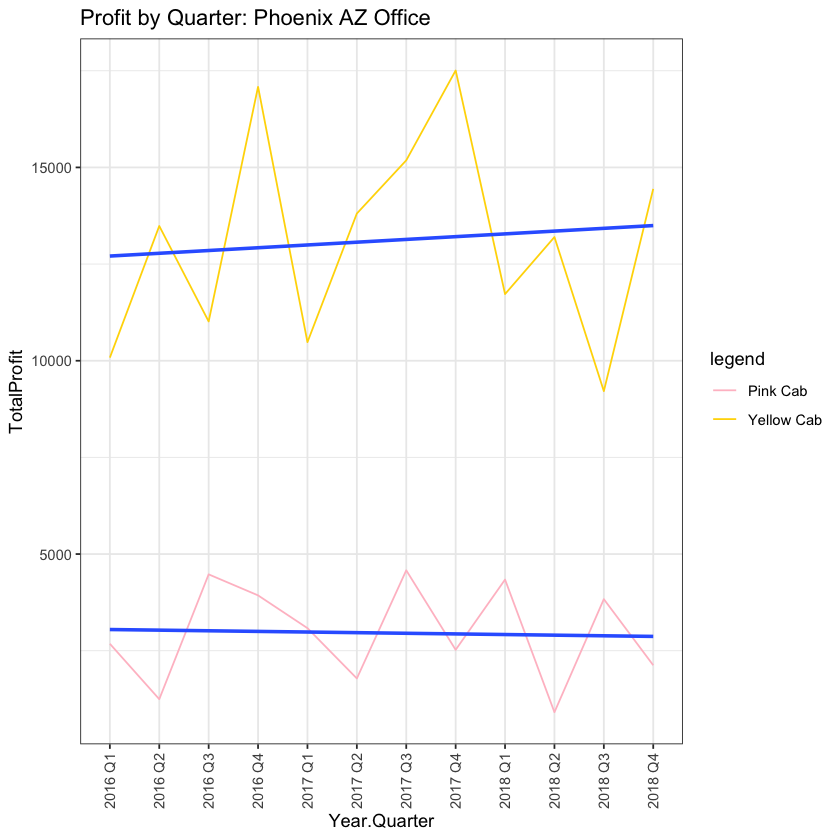

In [115]:
master_data %>%
    filter(City == 'PHOENIX AZ') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'PHOENIX AZ') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Phoenix AZ Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,636.91
2016 Q1,Yellow Cab,3923.45
2016 Q2,Pink Cab,1518.02
2016 Q2,Yellow Cab,3062.20
2016 Q3,Pink Cab,1797.21
2016 Q3,Yellow Cab,4424.46
2016 Q4,Pink Cab,1426.94
2016 Q4,Yellow Cab,5743.81
2017 Q1,Pink Cab,1639.69
2017 Q1,Yellow Cab,7172.03


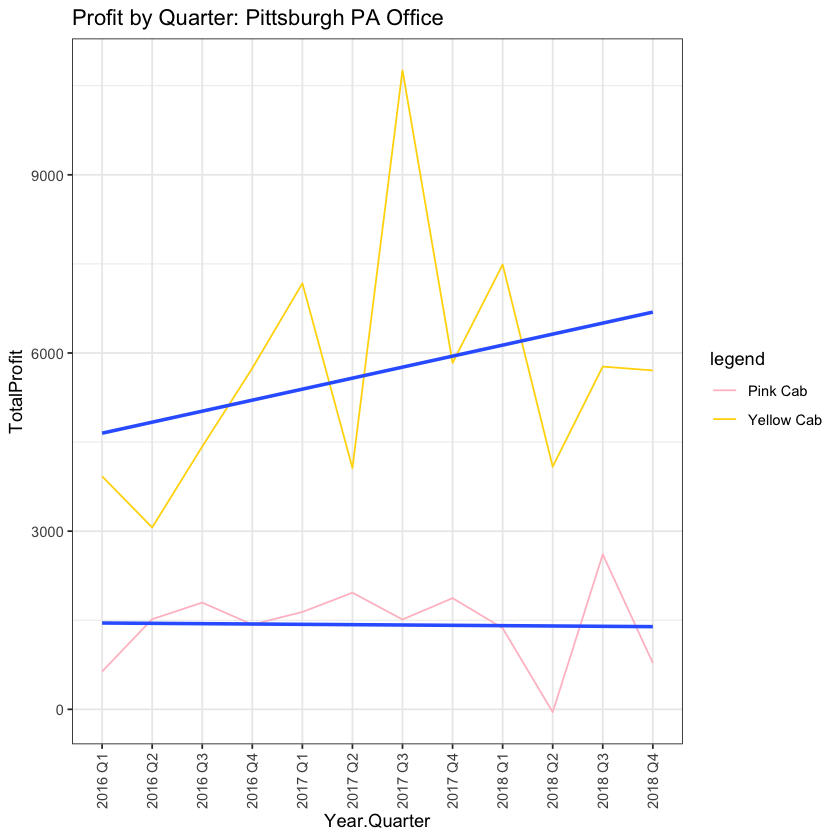

In [116]:
master_data %>%
    filter(City == 'PITTSBURGH PA') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'PITTSBURGH PA') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Pittsburgh PA Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,4419.65
2016 Q1,Yellow Cab,5971.96
2016 Q2,Pink Cab,4769.80
2016 Q2,Yellow Cab,6200.97
2016 Q3,Pink Cab,5417.32
2016 Q3,Yellow Cab,5189.56
2016 Q4,Pink Cab,2337.85
2016 Q4,Yellow Cab,4085.51
2017 Q1,Pink Cab,4487.18
2017 Q1,Yellow Cab,6528.99


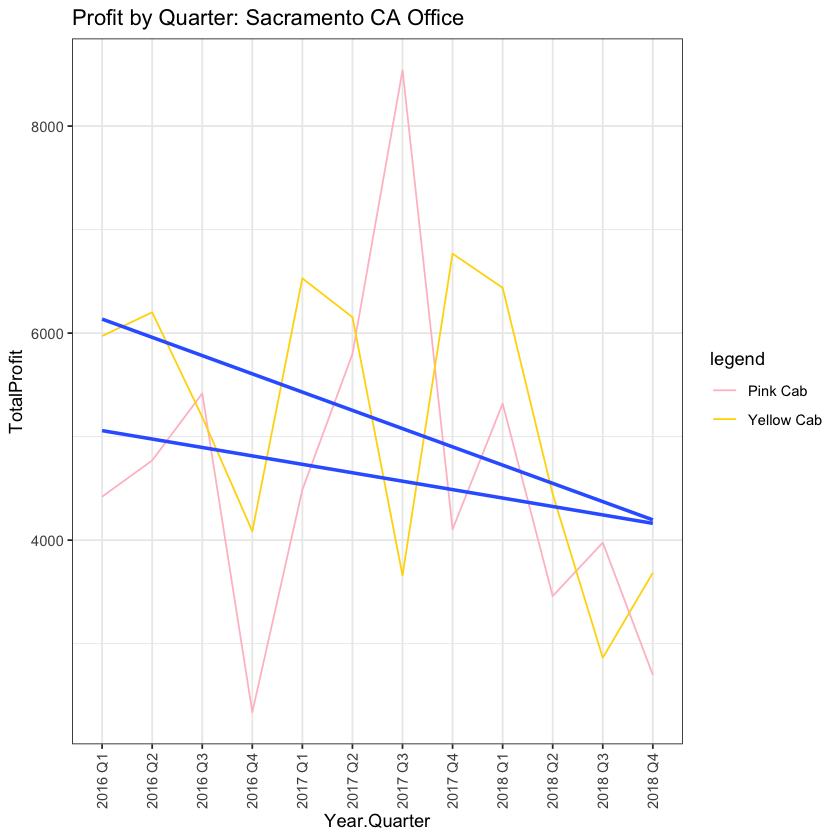

In [117]:
master_data %>%
    filter(City == 'SACRAMENTO CA') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'SACRAMENTO CA') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Sacramento CA Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,29831.33
2016 Q1,Yellow Cab,59608.87
2016 Q2,Pink Cab,35989.78
2016 Q2,Yellow Cab,67025.77
2016 Q3,Pink Cab,62396.71
2016 Q3,Yellow Cab,67967.23
2016 Q4,Pink Cab,73803.95
2016 Q4,Yellow Cab,69731.57
2017 Q1,Pink Cab,52673.84
2017 Q1,Yellow Cab,91040.01


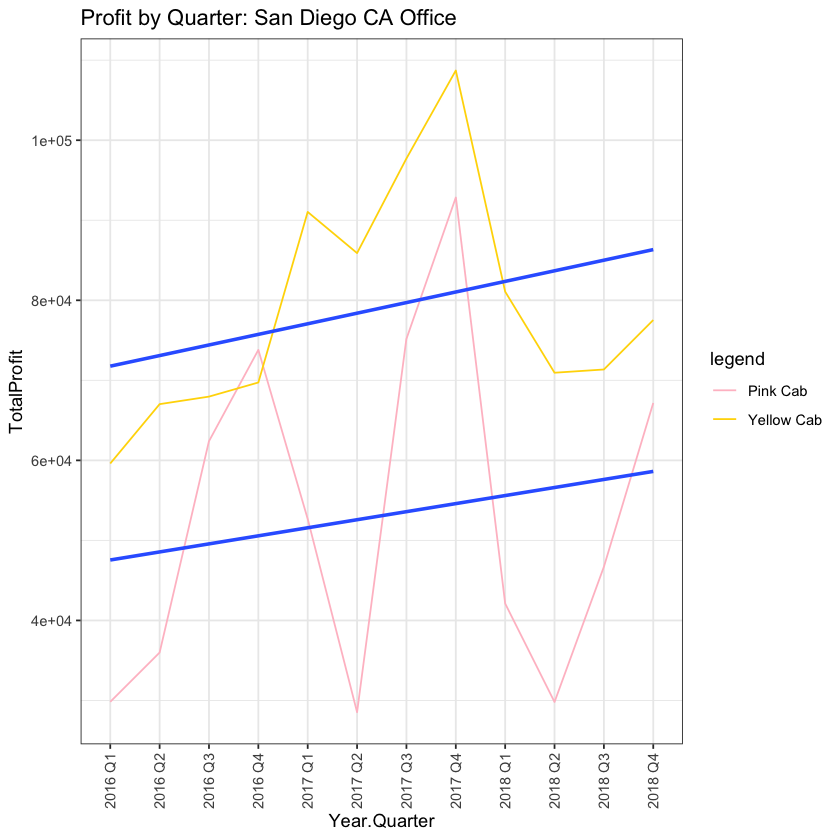

In [118]:
master_data %>%
    filter(City == 'SAN DIEGO CA') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'SAN DIEGO CA') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: San Diego CA Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,7231.99
2016 Q1,Yellow Cab,38453.48
2016 Q2,Pink Cab,8529.59
2016 Q2,Yellow Cab,34561.16
2016 Q3,Pink Cab,5343.56
2016 Q3,Yellow Cab,42041.01
2016 Q4,Pink Cab,19515.65
2016 Q4,Yellow Cab,34128.84
2017 Q1,Pink Cab,9184.00
2017 Q1,Yellow Cab,50893.69


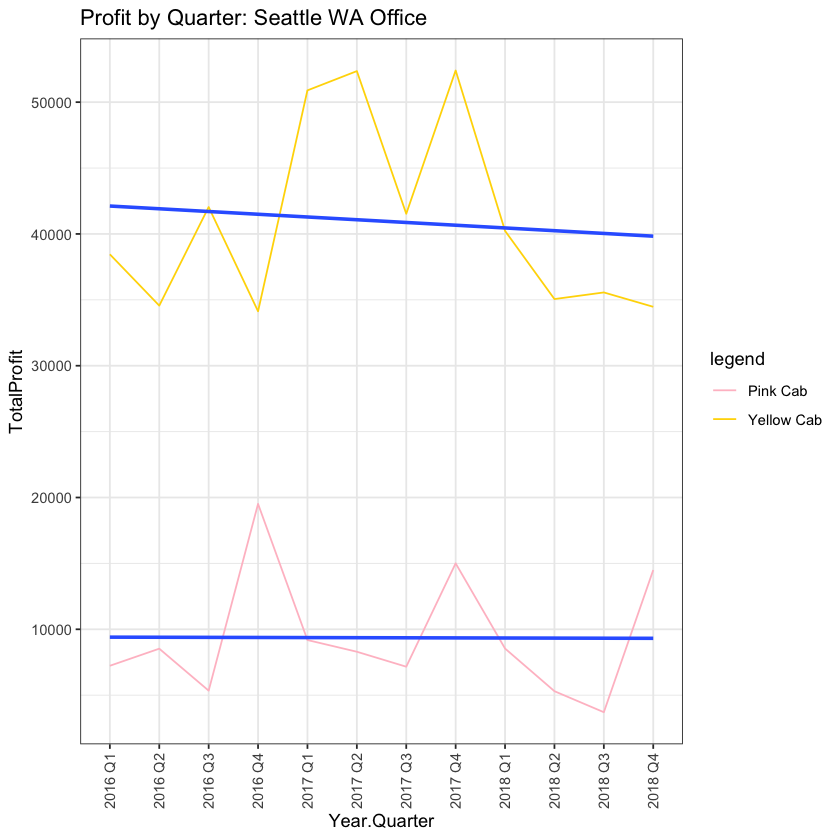

In [119]:
master_data %>%
    filter(City == 'SEATTLE WA') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'SEATTLE WA') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Seattle WA Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,18829.26
2016 Q1,Yellow Cab,53139.97
2016 Q2,Pink Cab,14481.98
2016 Q2,Yellow Cab,74426.94
2016 Q3,Pink Cab,22480.68
2016 Q3,Yellow Cab,69843.37
2016 Q4,Pink Cab,50243.24
2016 Q4,Yellow Cab,112677.88
2017 Q1,Pink Cab,24561.50
2017 Q1,Yellow Cab,75302.02


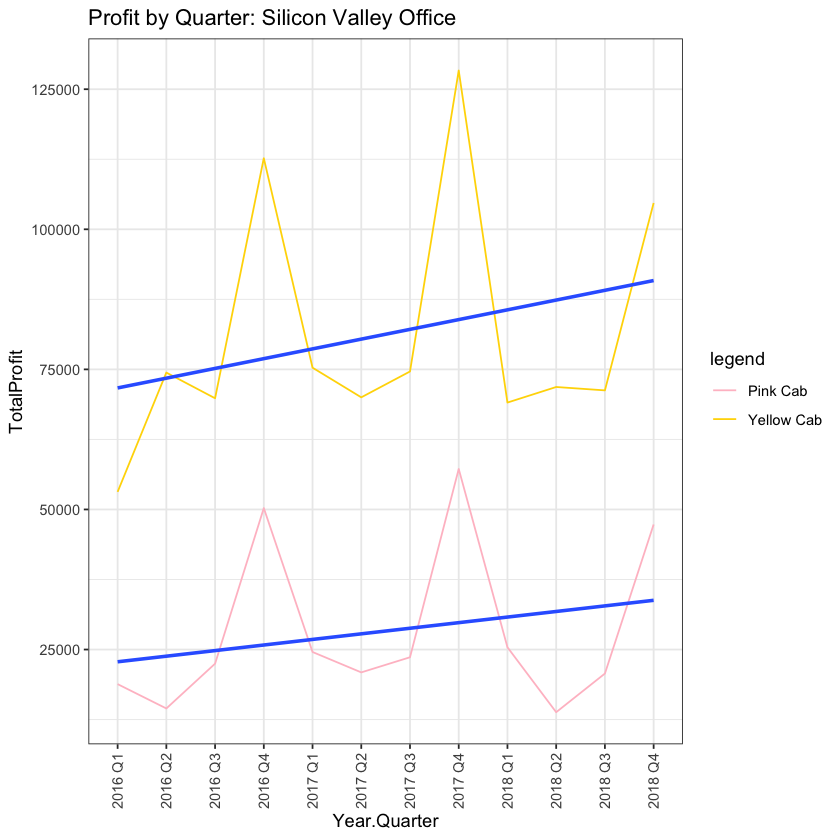

In [120]:
master_data %>%
    filter(City == 'SILICON VALLEY') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'SILICON VALLEY') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Silicon Valley Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,2552.95
2016 Q1,Yellow Cab,5203.43
2016 Q2,Pink Cab,2692.83
2016 Q2,Yellow Cab,5407.64
2016 Q3,Pink Cab,6389.35
2016 Q3,Yellow Cab,4194.06
2016 Q4,Pink Cab,8172.31
2016 Q4,Yellow Cab,9166.89
2017 Q1,Pink Cab,3643.61
2017 Q1,Yellow Cab,7492.50


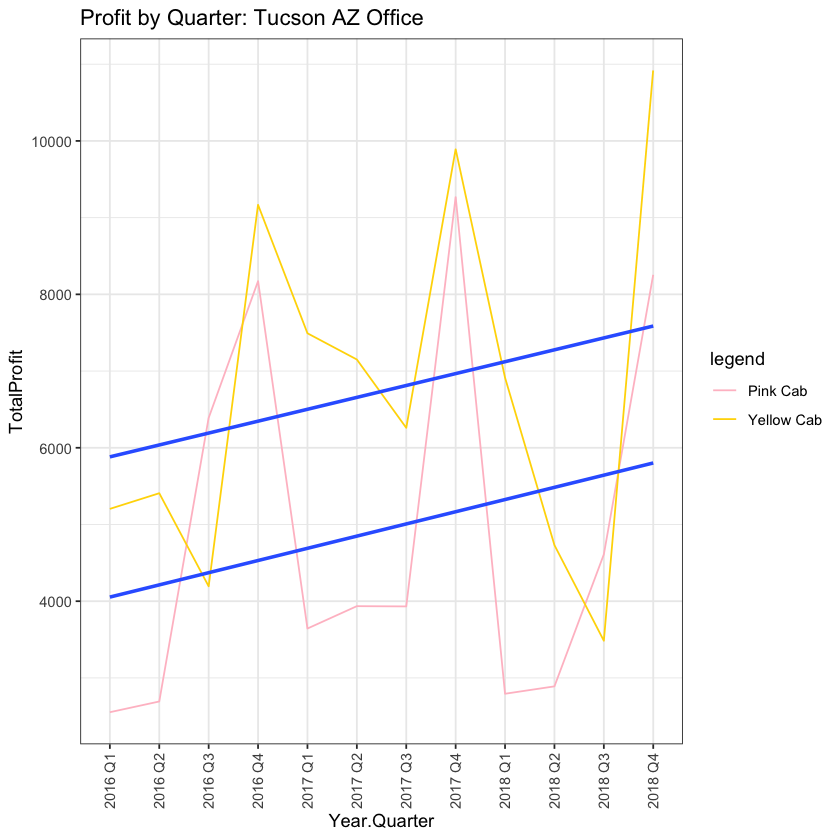

In [121]:
master_data %>%
    filter(City == 'TUCSON AZ') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'TUCSON AZ') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Tucson AZ Office')

Year.Quarter,Company,TotalProfit
2016 Q1,Pink Cab,10201.41
2016 Q1,Yellow Cab,243005.53
2016 Q2,Pink Cab,8545.51
2016 Q2,Yellow Cab,319695.03
2016 Q3,Pink Cab,8525.28
2016 Q3,Yellow Cab,185138.20
2016 Q4,Pink Cab,30084.10
2016 Q4,Yellow Cab,221878.71
2017 Q1,Pink Cab,12734.57
2017 Q1,Yellow Cab,361437.28


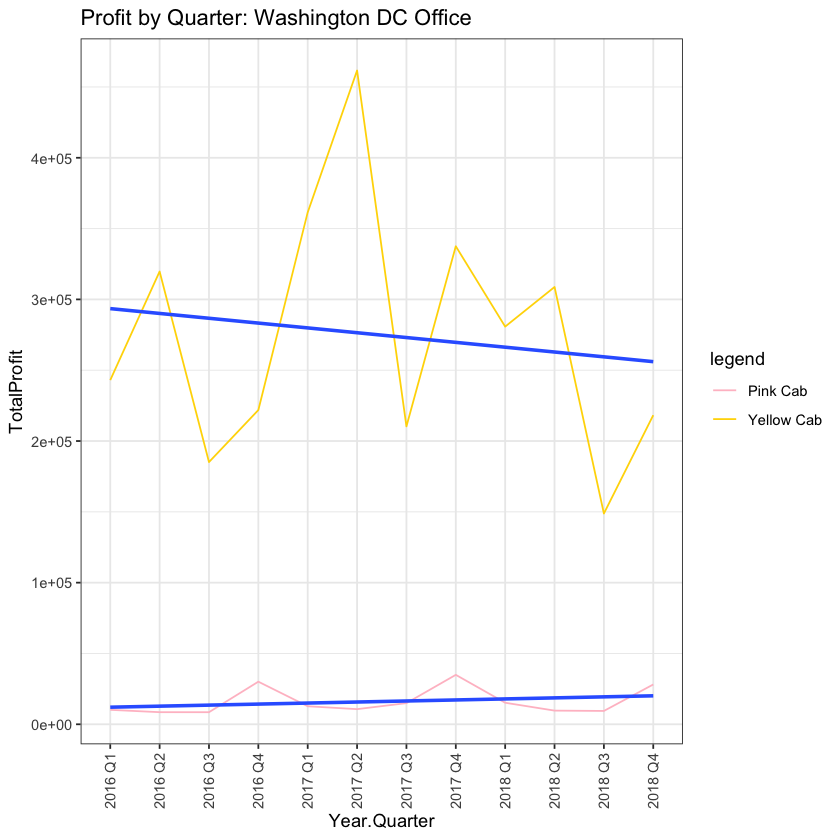

In [122]:
master_data %>%
    filter(City == 'WASHINGTON DC') %>% 
    group_by(Year.Quarter, Company) %>%
    summarise(TotalProfit = sum(Profit))
ggplot(master_data %>%
           filter(City == 'WASHINGTON DC') %>% 
           group_by(Year.Quarter, Company) %>%
           summarise(TotalProfit = sum(Profit)),
       aes(x = Year.Quarter, y = TotalProfit, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Profit by Quarter: Washington DC Office')

Across all offices, on average, Yellow Cab company generates more revenue per quarter than Pink Cab company does. Surprisingly, there are quarters where Pink Cab company doesn't make any money. Instead, they are losing money. In their Dallas office, Pink Cab company had 5 quarters where they lost money during the time frame of the data sets provided. Yellow Cab company, in all of its offices, in all of the quarters during the time frame of the data sets provided, did not lose money. Every quarter, they generated revenue.

***

Group by city & company, average profit per ride, visualise across cities. Also visualise average profits per ride across time per office.

City,Avg.PPR
ATLANTA GA,54.49765
AUSTIN TX,78.88024
BOSTON MA,50.52924
CHICAGO IL,34.05118
DALLAS TX,17.91227
DENVER CO,29.05666
LOS ANGELES CA,56.68565
MIAMI FL,81.14511
NASHVILLE TN,34.91583
NEW YORK NY,108.19286


City,Avg.PPR
ATLANTA GA,128.87273
AUSTIN TX,125.45485
BOSTON MA,61.54161
CHICAGO IL,64.99706
DALLAS TX,196.07986
DENVER CO,146.85516
LOS ANGELES CA,116.67952
MIAMI FL,133.99874
NASHVILLE TN,72.86607
NEW YORK NY,308.01909


Company,Avg.PPR
Pink Cab,62.63657
Yellow Cab,160.35690


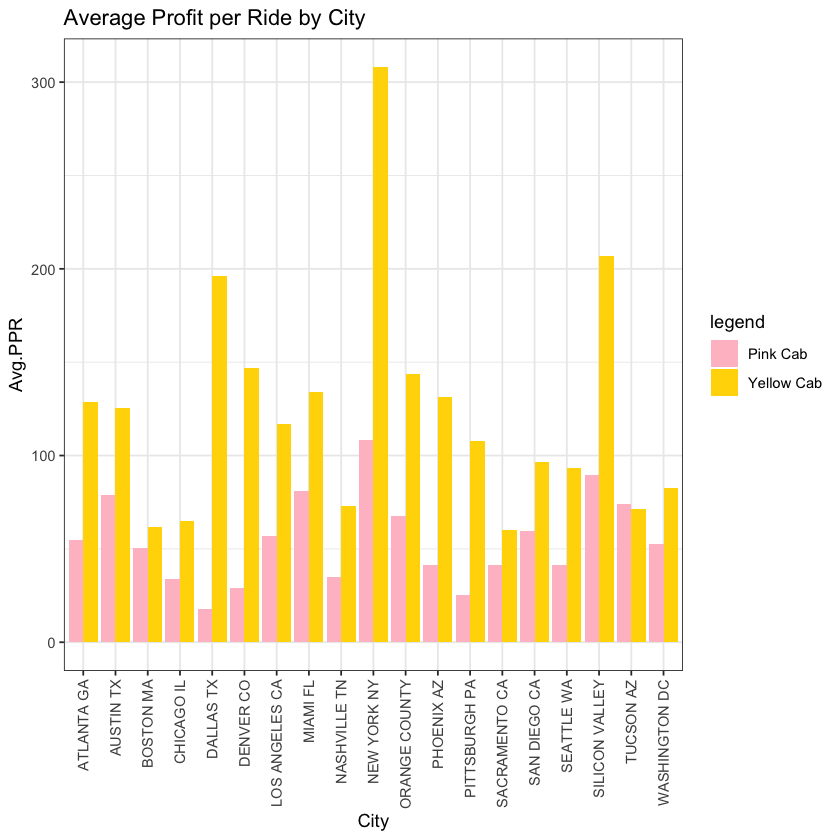

In [34]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(City) %>%
    summarise(Avg.PPR = mean(Profit))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(City) %>%
    summarise(Avg.PPR = mean(Profit))
master_data %>%
    group_by(Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           group_by(City, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = City, y = Avg.PPR, fill = Company)) + 
    geom_bar(position = 'dodge', stat = 'identity') +
    scale_fill_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by City')

Year.Quarter,Avg.PPR
2016 Q1,78.12914
2016 Q2,47.58123
2016 Q3,52.87149
2016 Q4,84.64544
2017 Q1,82.27201
2017 Q2,49.12607
2017 Q3,53.31920
2017 Q4,79.03276
2018 Q1,67.18658
2018 Q2,36.15755


Year.Quarter,Avg.PPR
2016 Q1,78.12914
2016 Q2,47.58123
2016 Q3,52.87149
2016 Q4,84.64544
2017 Q1,82.27201
2017 Q2,49.12607
2017 Q3,53.31920
2017 Q4,79.03276
2018 Q1,67.18658
2018 Q2,36.15755


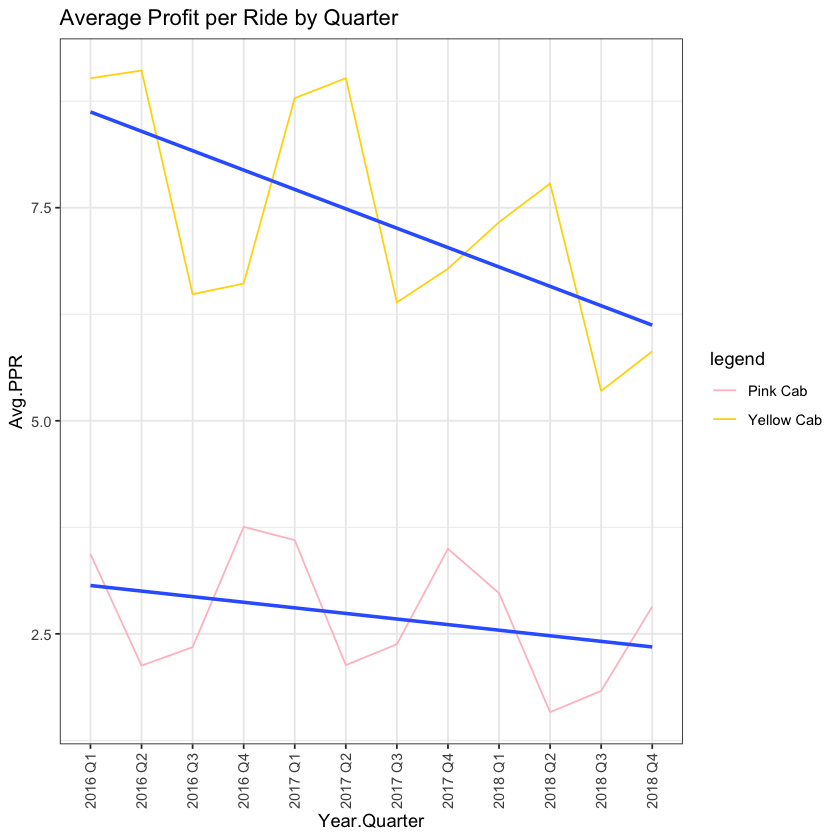

In [62]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(Avg.PPR = mean(Profit))
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,50.64829
2016 Q1,Yellow Cab,232.88182
2016 Q2,Pink Cab,48.21761
2016 Q2,Yellow Cab,188.62897
2016 Q3,Pink Cab,55.65283
2016 Q3,Yellow Cab,82.34132
2016 Q4,Pink Cab,89.76861
2016 Q4,Yellow Cab,108.64283
2017 Q1,Pink Cab,52.73460
2017 Q1,Yellow Cab,187.24565


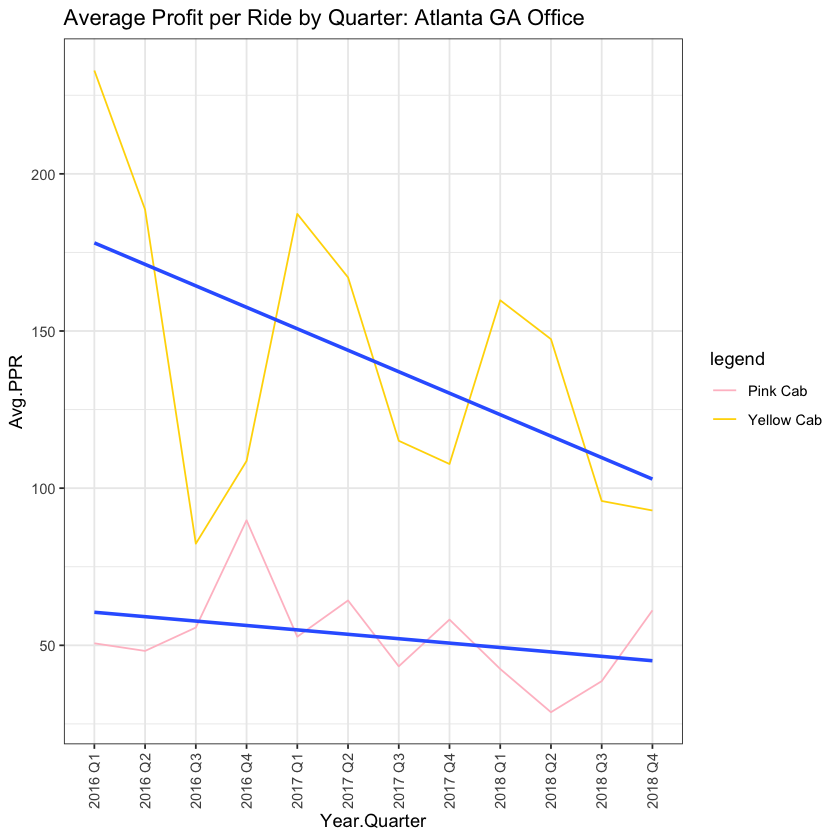

In [63]:
master_data %>%
    filter(City == 'ATLANTA GA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'ATLANTA GA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Atlanta GA Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,85.80250
2016 Q1,Yellow Cab,215.27681
2016 Q2,Pink Cab,50.79783
2016 Q2,Yellow Cab,238.60171
2016 Q3,Pink Cab,54.73052
2016 Q3,Yellow Cab,116.45191
2016 Q4,Pink Cab,102.07202
2016 Q4,Yellow Cab,103.39180
2017 Q1,Pink Cab,98.87534
2017 Q1,Yellow Cab,188.94767


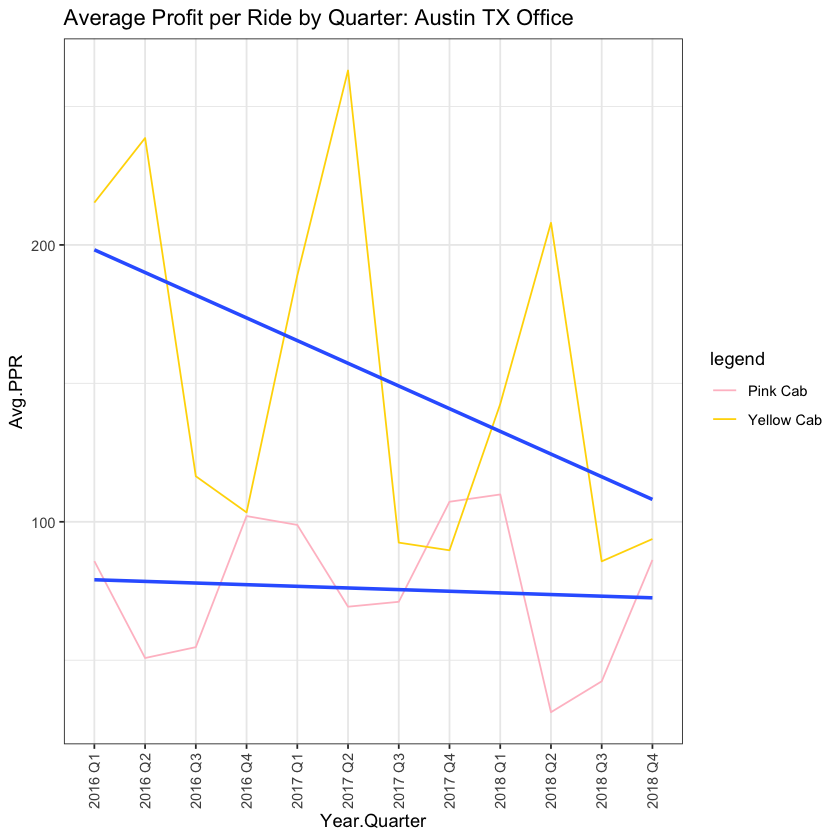

In [37]:
master_data %>%
    filter(City == 'AUSTIN TX') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'AUSTIN TX') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Austin TX Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,37.21827
2016 Q1,Yellow Cab,100.08935
2016 Q2,Pink Cab,35.48609
2016 Q2,Yellow Cab,63.48021
2016 Q3,Pink Cab,46.37496
2016 Q3,Yellow Cab,60.15464
2016 Q4,Pink Cab,86.03804
2016 Q4,Yellow Cab,57.26775
2017 Q1,Pink Cab,41.89657
2017 Q1,Yellow Cab,83.70787


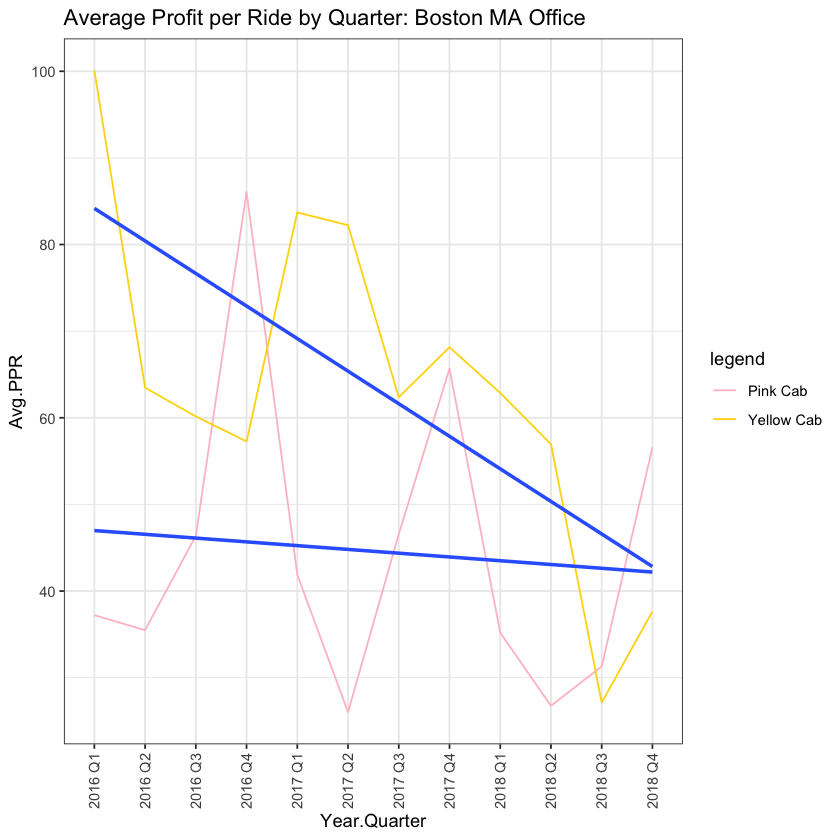

In [38]:
master_data %>%
    filter(City == 'BOSTON MA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'BOSTON MA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Boston MA Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,63.10680
2016 Q1,Yellow Cab,91.33542
2016 Q2,Pink Cab,39.87090
2016 Q2,Yellow Cab,112.61888
2016 Q3,Pink Cab,10.81410
2016 Q3,Yellow Cab,58.93512
2016 Q4,Pink Cab,51.35724
2016 Q4,Yellow Cab,62.86868
2017 Q1,Pink Cab,57.90248
2017 Q1,Yellow Cab,106.00418


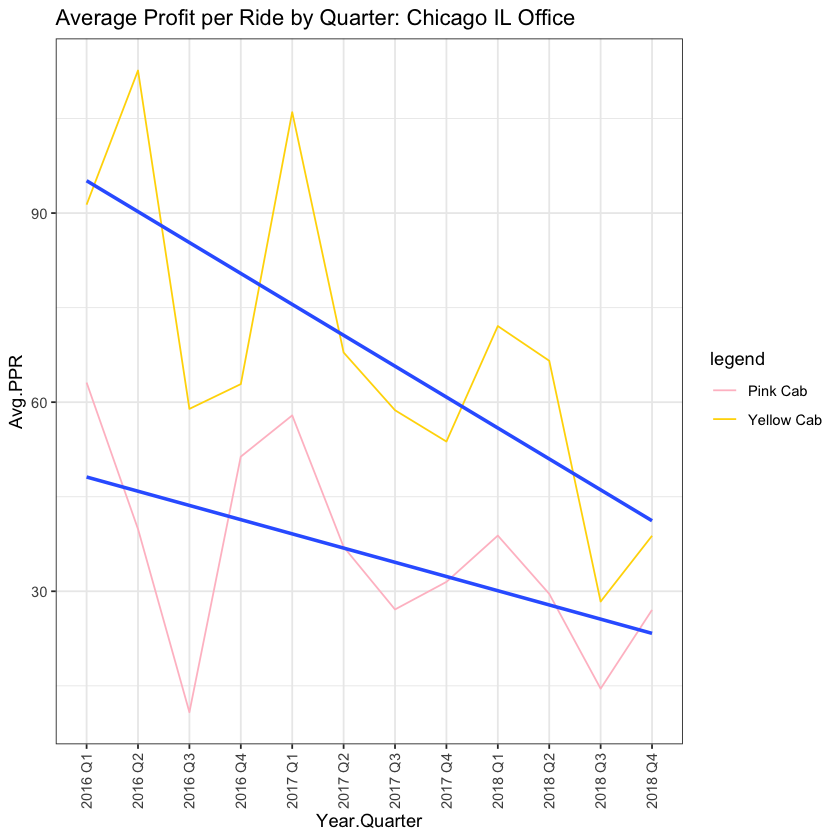

In [39]:
master_data %>%
    filter(City == 'CHICAGO IL') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'CHICAGO IL') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Chicago IL Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,-12.7580822
2016 Q1,Yellow Cab,284.1539928
2016 Q2,Pink Cab,-11.0567500
2016 Q2,Yellow Cab,265.2054728
2016 Q3,Pink Cab,17.4603670
2016 Q3,Yellow Cab,177.9834763
2016 Q4,Pink Cab,57.3259060
2016 Q4,Yellow Cab,165.9444174
2017 Q1,Pink Cab,9.1779348
2017 Q1,Yellow Cab,224.1883854


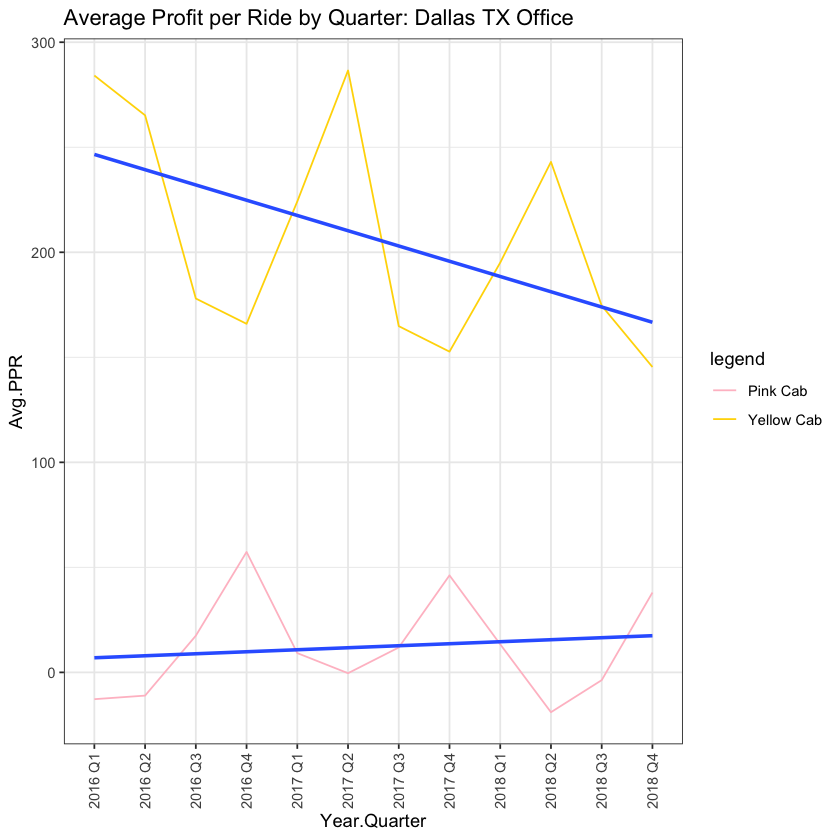

In [40]:
master_data %>%
    filter(City == 'DALLAS TX') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'DALLAS TX') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Dallas TX Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,-2.310652
2016 Q1,Yellow Cab,225.789537
2016 Q2,Pink Cab,24.637975
2016 Q2,Yellow Cab,162.252817
2016 Q3,Pink Cab,17.420672
2016 Q3,Yellow Cab,145.369274
2016 Q4,Pink Cab,62.007312
2016 Q4,Yellow Cab,130.685092
2017 Q1,Pink Cab,7.261481
2017 Q1,Yellow Cab,177.935476


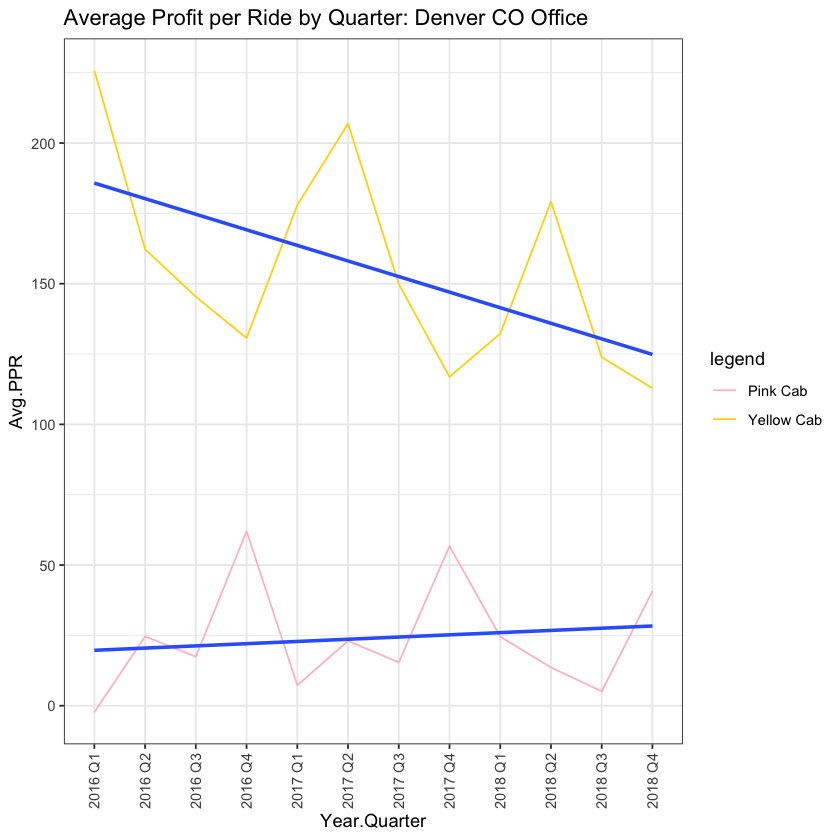

In [41]:
master_data %>%
    filter(City == 'DENVER CO') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'DENVER CO') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Denver CO Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,106.38702
2016 Q1,Yellow Cab,181.87568
2016 Q2,Pink Cab,56.67962
2016 Q2,Yellow Cab,174.38038
2016 Q3,Pink Cab,53.72597
2016 Q3,Yellow Cab,89.93709
2016 Q4,Pink Cab,61.52811
2016 Q4,Yellow Cab,108.92527
2017 Q1,Pink Cab,103.12440
2017 Q1,Yellow Cab,167.06776


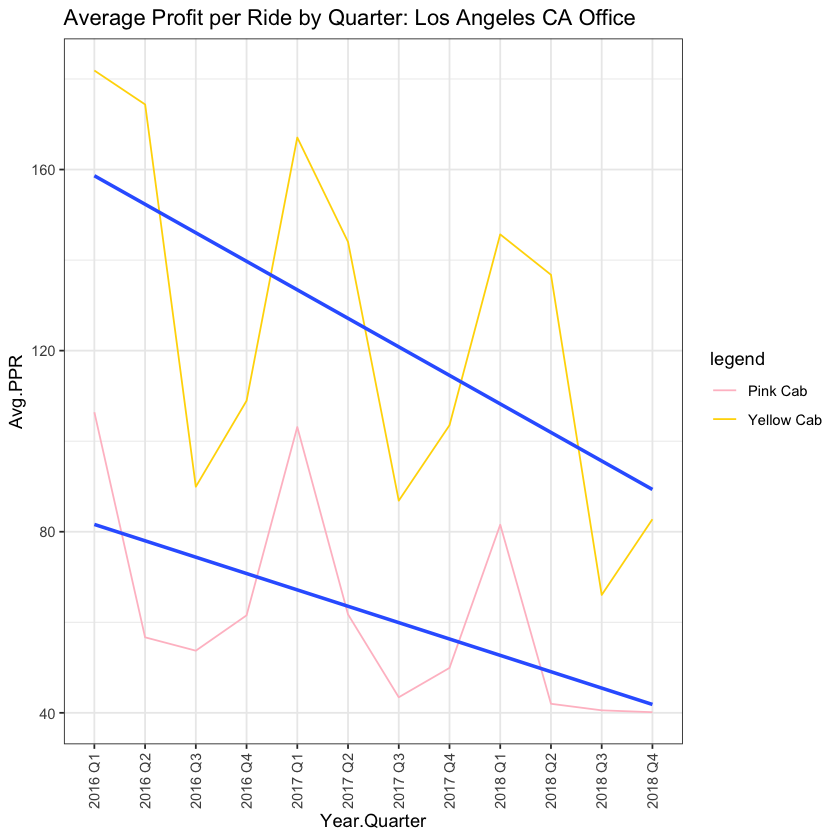

In [42]:
master_data %>%
    filter(City == 'LOS ANGELES CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'LOS ANGELES CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Los Angeles CA Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,93.029344
2016 Q1,Yellow Cab,210.193936
2016 Q2,Pink Cab,-10.455714
2016 Q2,Yellow Cab,198.692215
2016 Q3,Pink Cab,97.015127
2016 Q3,Yellow Cab,171.065179
2016 Q4,Pink Cab,93.307599
2016 Q4,Yellow Cab,107.417730
2017 Q1,Pink Cab,102.060000
2017 Q1,Yellow Cab,172.633939


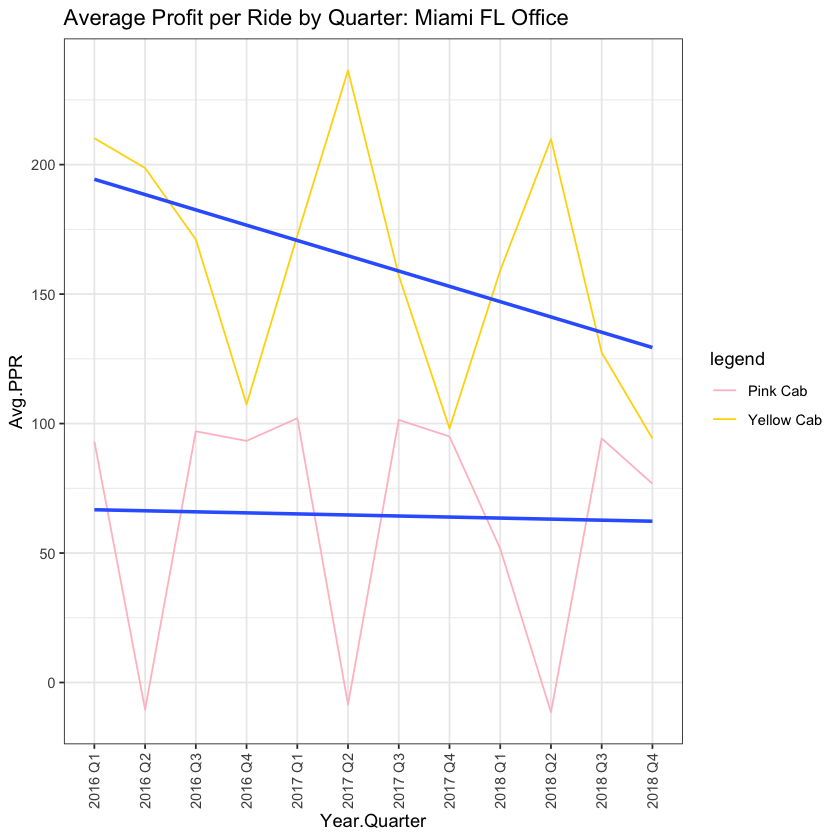

In [43]:
master_data %>%
    filter(City == 'MIAMI FL') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'MIAMI FL') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Miami FL Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,45.720000
2016 Q1,Yellow Cab,128.904419
2016 Q2,Pink Cab,17.522437
2016 Q2,Yellow Cab,84.296029
2016 Q3,Pink Cab,45.275854
2016 Q3,Yellow Cab,59.922549
2016 Q4,Pink Cab,37.538894
2016 Q4,Yellow Cab,94.458769
2017 Q1,Pink Cab,65.620337
2017 Q1,Yellow Cab,96.153333


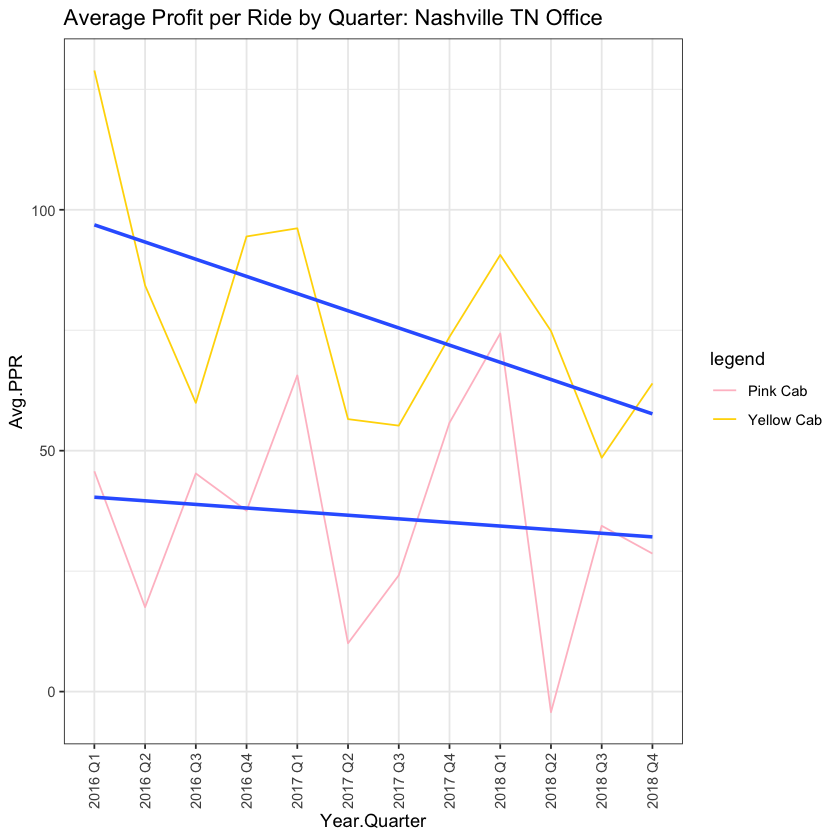

In [44]:
master_data %>%
    filter(City == 'NASHVILLE TN') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'NASHVILLE TN') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Nashville TN Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,112.21215
2016 Q1,Yellow Cab,396.69772
2016 Q2,Pink Cab,48.78363
2016 Q2,Yellow Cab,389.60414
2016 Q3,Pink Cab,71.86249
2016 Q3,Yellow Cab,299.11382
2016 Q4,Pink Cab,150.99589
2016 Q4,Yellow Cab,280.93901
2017 Q1,Pink Cab,123.54075
2017 Q1,Yellow Cab,362.94036


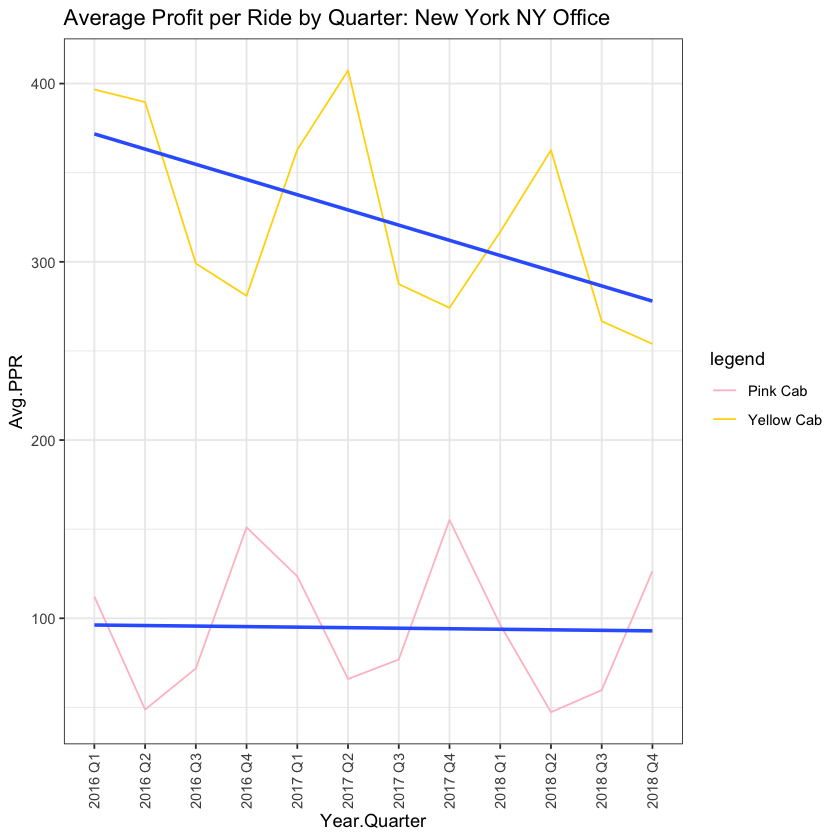

In [45]:
master_data %>%
    filter(City == 'NEW YORK NY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'NEW YORK NY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: New York NY Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,92.98692
2016 Q1,Yellow Cab,328.28054
2016 Q2,Pink Cab,29.88328
2016 Q2,Yellow Cab,255.52304
2016 Q3,Pink Cab,83.59176
2016 Q3,Yellow Cab,120.48778
2016 Q4,Pink Cab,58.55603
2016 Q4,Yellow Cab,92.63823
2017 Q1,Pink Cab,119.61307
2017 Q1,Yellow Cab,272.63566


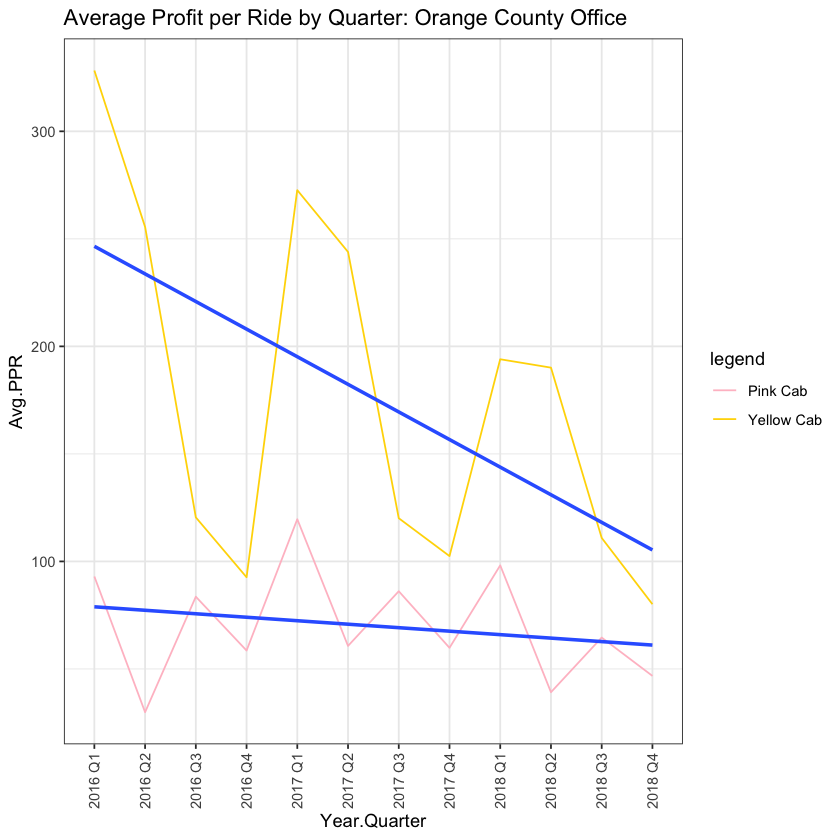

In [46]:
master_data %>%
    filter(City == 'ORANGE COUNTY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'ORANGE COUNTY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Orange County Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,66.99000
2016 Q1,Yellow Cab,229.10591
2016 Q2,Pink Cab,23.52151
2016 Q2,Yellow Cab,192.63729
2016 Q3,Pink Cab,58.88013
2016 Q3,Yellow Cab,112.40571
2016 Q4,Pink Cab,45.18747
2016 Q4,Yellow Cab,129.40985
2017 Q1,Pink Cab,57.10833
2017 Q1,Yellow Cab,143.56658


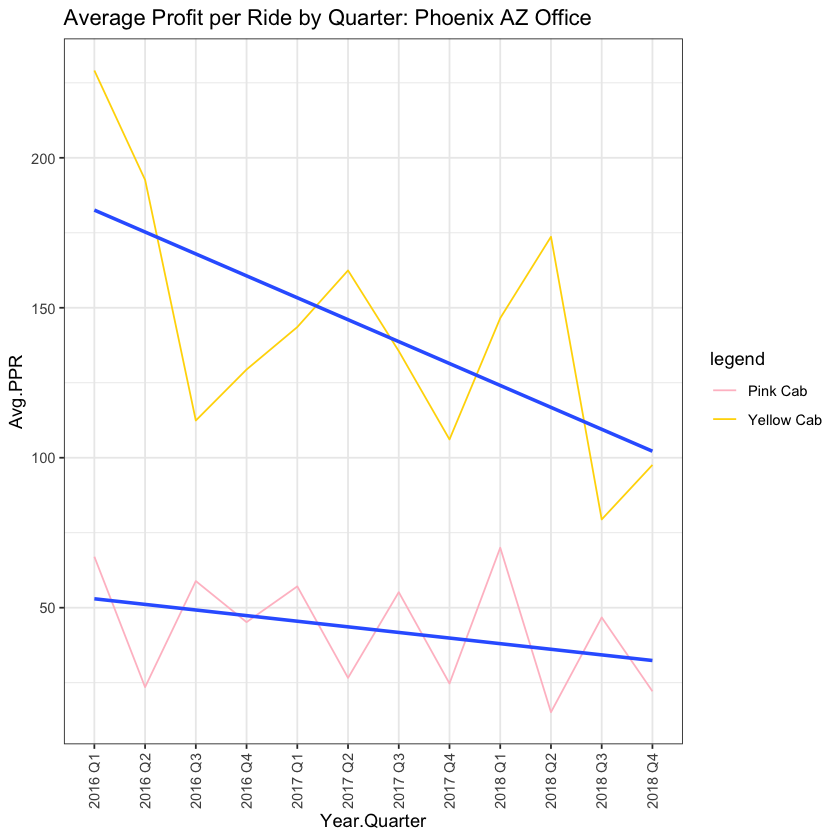

In [47]:
master_data %>%
    filter(City == 'PHOENIX AZ') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'PHOENIX AZ') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Phoenix AZ Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,53.0758333
2016 Q1,Yellow Cab,156.9380000
2016 Q2,Pink Cab,31.6254167
2016 Q2,Yellow Cab,76.5550000
2016 Q3,Pink Cab,28.9872581
2016 Q3,Yellow Cab,81.9344444
2016 Q4,Pink Cab,16.5923256
2016 Q4,Yellow Cab,79.7751389
2017 Q1,Pink Cab,96.4523529
2017 Q1,Yellow Cab,231.3558065


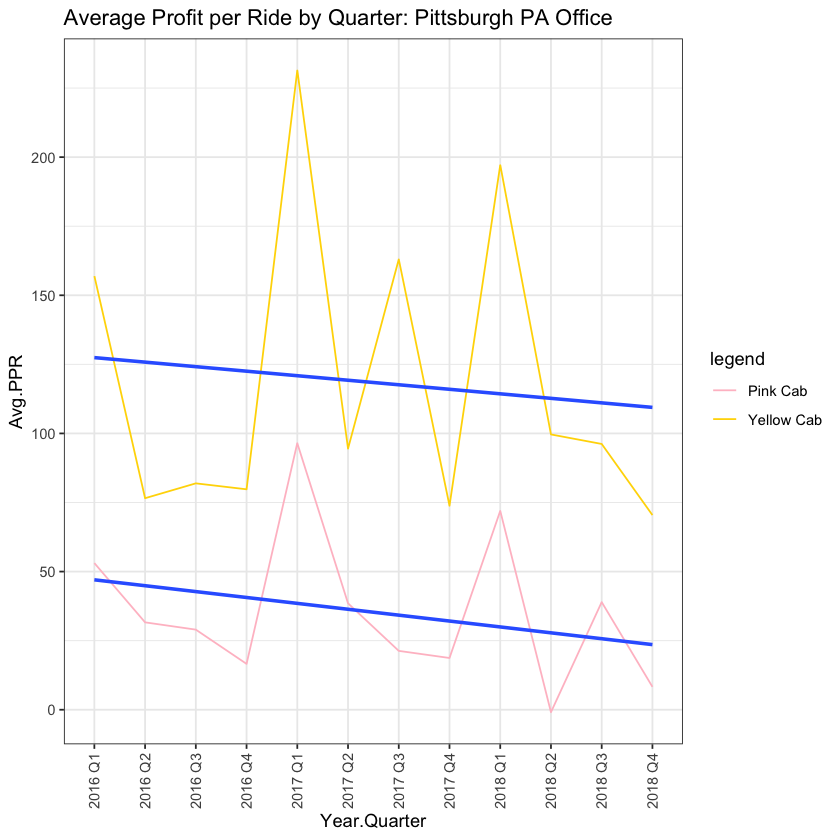

In [49]:
master_data %>%
    filter(City == 'PITTSBURGH PA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'PITTSBURGH PA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Pittsburgh PA Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,96.07935
2016 Q1,Yellow Cab,119.43920
2016 Q2,Pink Cab,56.11529
2016 Q2,Yellow Cab,108.78895
2016 Q3,Pink Cab,45.52370
2016 Q3,Yellow Cab,62.52482
2016 Q4,Pink Cab,17.57782
2016 Q4,Yellow Cab,35.83781
2017 Q1,Pink Cab,63.19972
2017 Q1,Yellow Cab,94.62304


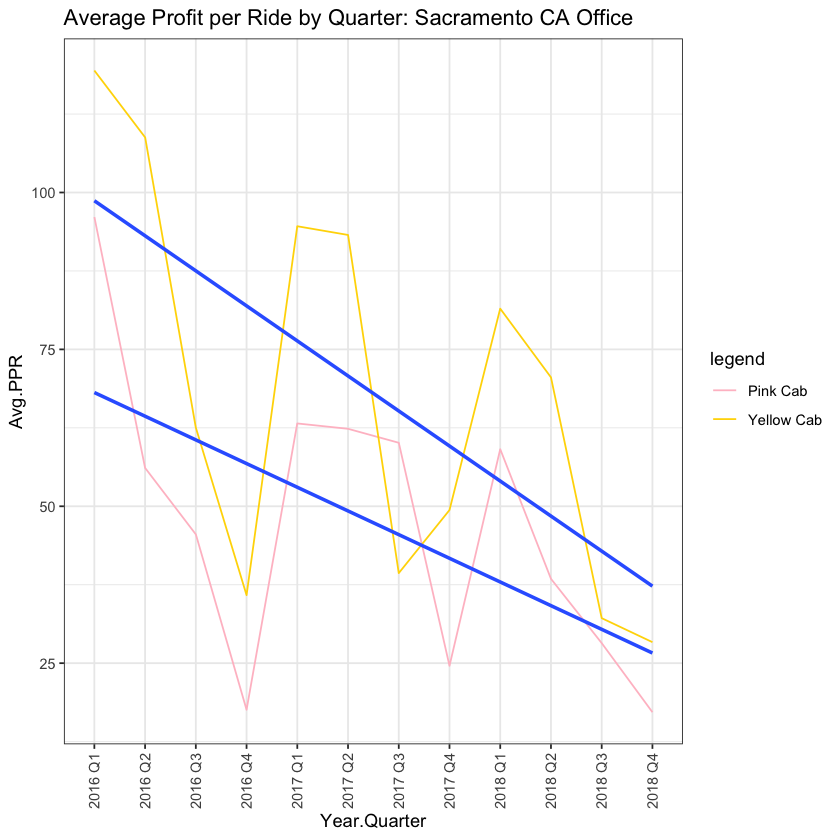

In [50]:
master_data %>%
    filter(City == 'SACRAMENTO CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'SACRAMENTO CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Sacramento CA Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,67.64474
2016 Q1,Yellow Cab,134.55727
2016 Q2,Pink Cab,58.23589
2016 Q2,Yellow Cab,114.18359
2016 Q3,Pink Cab,60.99385
2016 Q3,Yellow Cab,81.98701
2016 Q4,Pink Cab,69.95635
2016 Q4,Yellow Cab,67.50394
2017 Q1,Pink Cab,84.95781
2017 Q1,Yellow Cab,148.27363


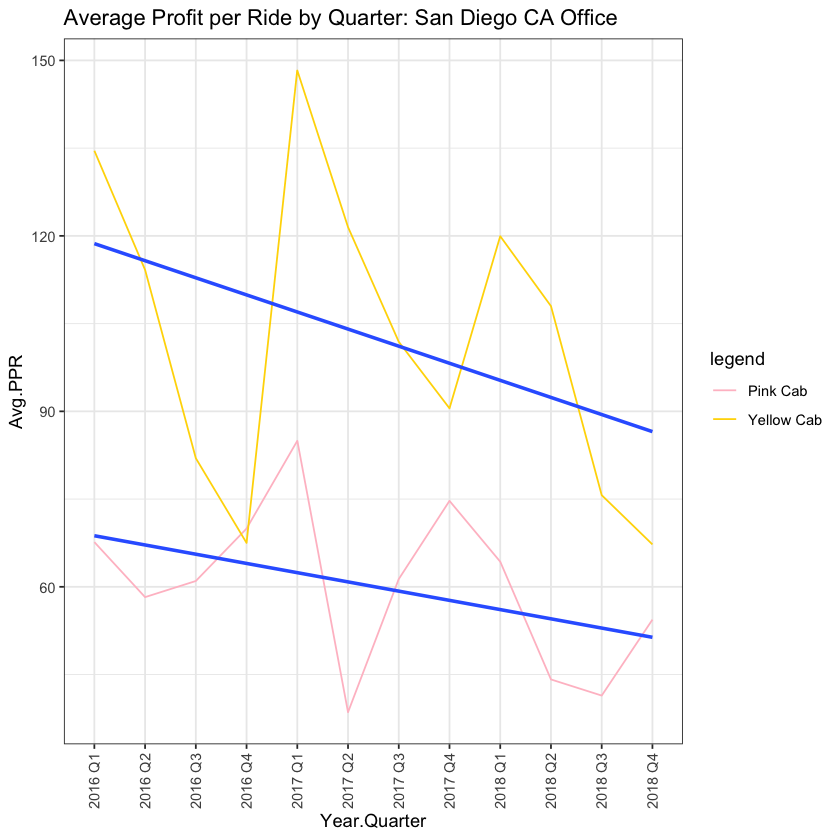

In [51]:
master_data %>%
    filter(City == 'SAN DIEGO CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'SAN DIEGO CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: San Diego CA Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,41.80341
2016 Q1,Yellow Cab,122.07454
2016 Q2,Pink Cab,51.69448
2016 Q2,Yellow Cab,105.36939
2016 Q3,Pink Cab,24.17900
2016 Q3,Yellow Cab,98.45670
2016 Q4,Pink Cab,70.20018
2016 Q4,Yellow Cab,66.26959
2017 Q1,Pink Cab,43.11737
2017 Q1,Yellow Cab,130.16289


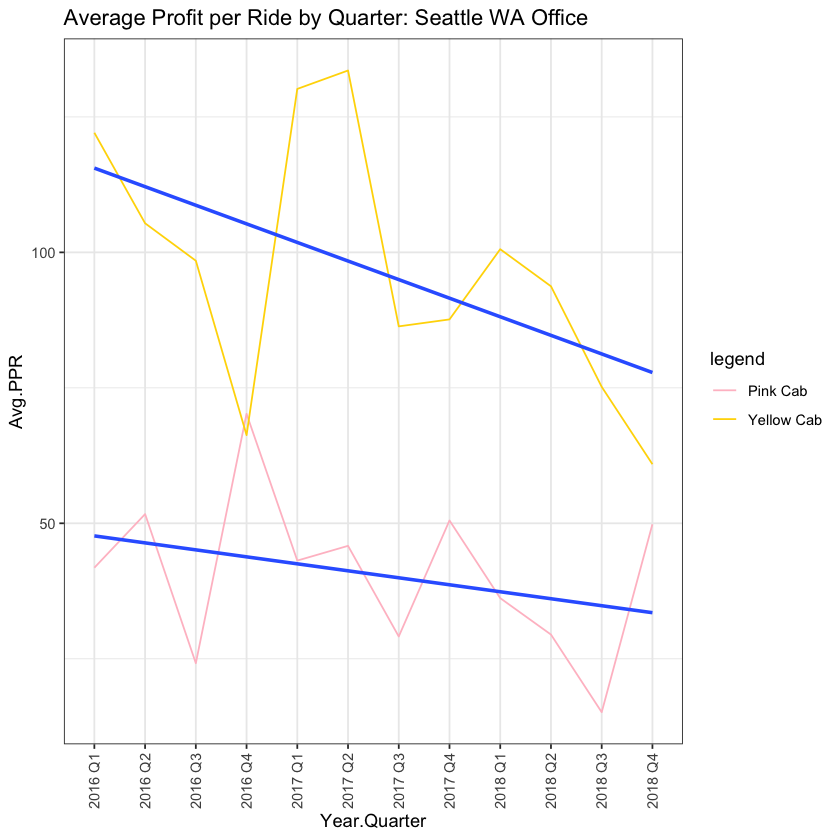

In [52]:
master_data %>%
    filter(City == 'SEATTLE WA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'SEATTLE WA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Seattle WA Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,144.84046
2016 Q1,Yellow Cab,269.74604
2016 Q2,Pink Cab,68.63498
2016 Q2,Yellow Cab,281.92023
2016 Q3,Pink Cab,71.14139
2016 Q3,Yellow Cab,171.60533
2016 Q4,Pink Cab,107.58724
2016 Q4,Yellow Cab,206.74840
2017 Q1,Pink Cab,128.59424
2017 Q1,Yellow Cab,280.97769


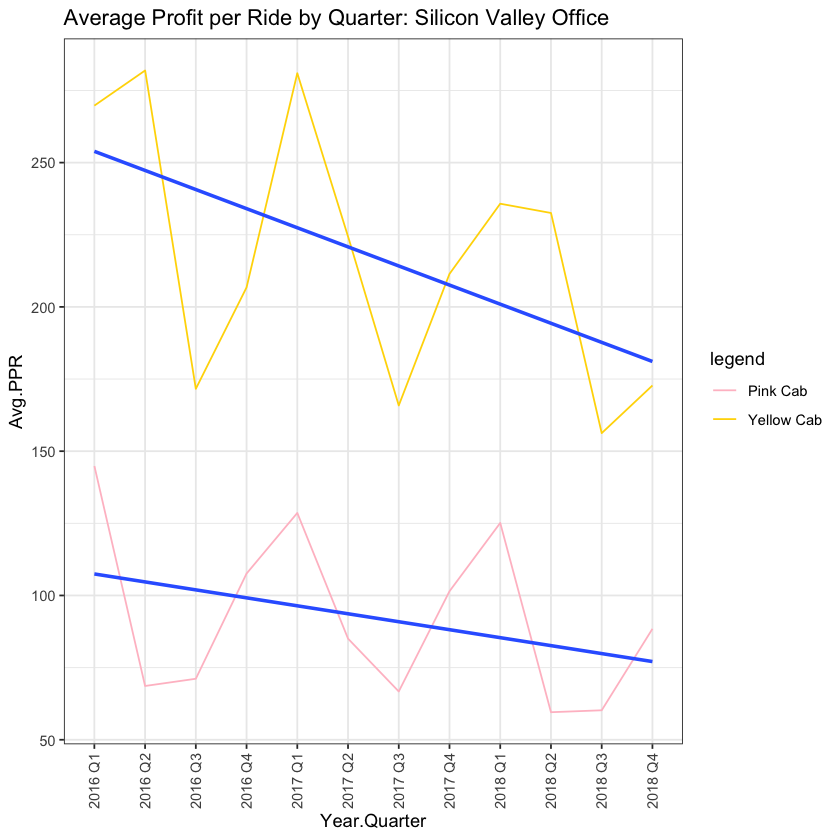

In [53]:
master_data %>%
    filter(City == 'SILICON VALLEY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'SILICON VALLEY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Silicon Valley Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,79.77969
2016 Q1,Yellow Cab,110.71128
2016 Q2,Pink Cab,64.11500
2016 Q2,Yellow Cab,84.49438
2016 Q3,Pink Cab,79.86688
2016 Q3,Yellow Cab,47.65977
2016 Q4,Pink Cab,103.44696
2016 Q4,Yellow Cab,69.97626
2017 Q1,Pink Cab,77.52362
2017 Q1,Yellow Cab,105.52817


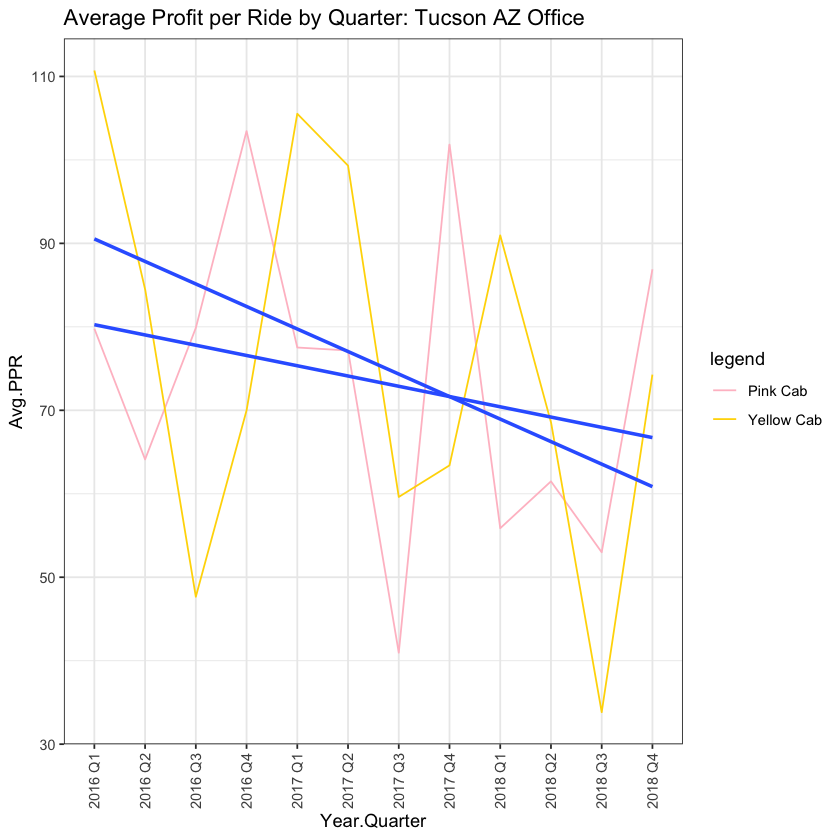

In [54]:
master_data %>%
    filter(City == 'TUCSON AZ') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'TUCSON AZ') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Tucson AZ Office')

Year.Quarter,Company,Avg.PPR
2016 Q1,Pink Cab,60.72268
2016 Q1,Yellow Cab,108.53306
2016 Q2,Pink Cab,41.08418
2016 Q2,Yellow Cab,116.89032
2016 Q3,Pink Cab,31.69249
2016 Q3,Yellow Cab,57.44282
2016 Q4,Pink Cab,68.06357
2016 Q4,Yellow Cab,56.73196
2017 Q1,Pink Cab,57.36293
2017 Q1,Yellow Cab,123.14728


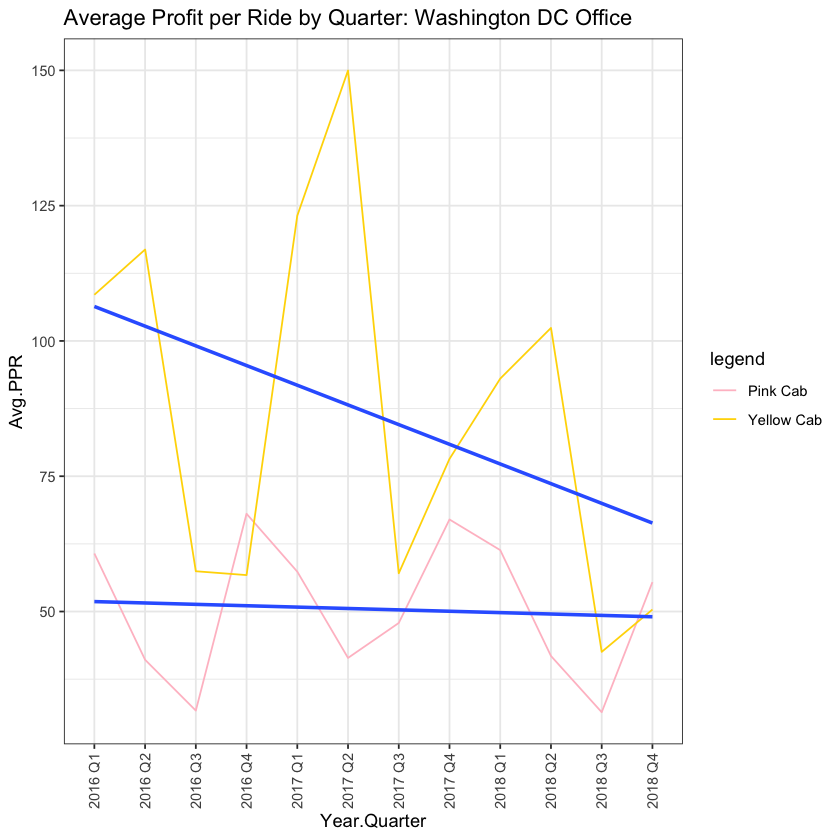

In [55]:
master_data %>%
    filter(City == 'WASHINGTON DC') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPR = mean(Profit))
ggplot(master_data %>%
           filter(City == 'WASHINGTON DC') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPR = mean(Profit)),
       aes(x = Year.Quarter, y = Avg.PPR, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Washington DC Office')

Across nearly all offices, on average, Yellow Cab company generates more profit per ride per quarter than Pink Cab company does. Only in the Tucson AZ office is where it isn't clear who does better. In some quarters, Yellow Cab company averages more profit per ride, while in other quarters Pink Cab company does. However if you look at the overall profit per ride figure, you'll see that Pink Cab company edges out Yellow Cab company slightly (in Tucson).

***

Group by city, company & calculate average price per kilometer. Visualise PPkm by city.

City,Avg.PPKm
ATLANTA GA,2.4177371
AUSTIN TX,3.6020218
BOSTON MA,2.2347105
CHICAGO IL,1.5089013
DALLAS TX,0.8251295
DENVER CO,1.2730045
LOS ANGELES CA,2.5019721
MIAMI FL,3.6031114
NASHVILLE TN,1.5208467
NEW YORK NY,4.7892184


City,Avg.PPKm
ATLANTA GA,5.796296
AUSTIN TX,5.580133
BOSTON MA,2.727056
CHICAGO IL,2.865109
DALLAS TX,8.671421
DENVER CO,6.540091
LOS ANGELES CA,5.145567
MIAMI FL,5.883061
NASHVILLE TN,3.200472
NEW YORK NY,13.685750


Company,Avg.PPKm
Pink Cab,2.769452
Yellow Cab,7.109246


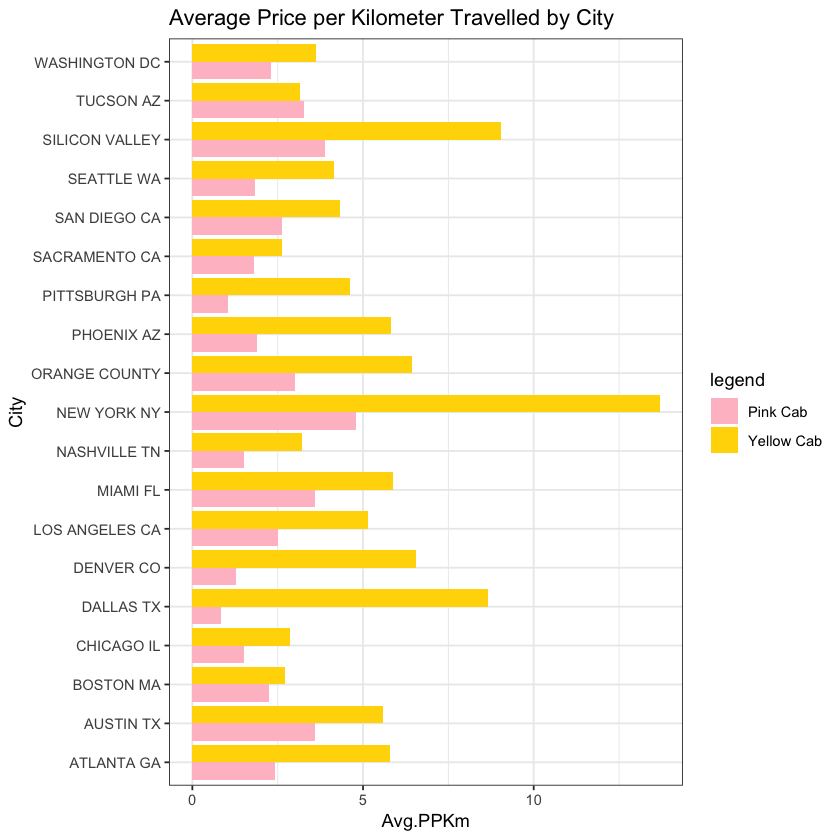

In [65]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(City) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(City) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
master_data %>%
    group_by(Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           group_by(City, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = City, y = Avg.PPKm, fill = Company)) + 
    geom_bar(position = 'dodge', stat = 'identity') + 
    scale_fill_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    coord_flip() +
    labs(title = 'Average Price per Kilometer Travelled by City')

In nearly all cities, on average, Yellow Cab company charges more per kilometer travelled than Pink Cab company. Combined with the fact that Yellow Cab company averages more profit per ride, we now know that price per ride & price per kilometer for each company is highly correlated. Before we visualise the correlation, visualise Avg.PPKm by quarter for all offices.

Year.Quarter,Avg.PPKm
2016 Q1,3.436960
2016 Q2,2.127103
2016 Q3,2.344255
2016 Q4,3.755434
2017 Q1,3.599408
2017 Q2,2.132410
2017 Q3,2.378565
2017 Q4,3.498026
2018 Q1,2.977892
2018 Q2,1.580503


Year.Quarter,Avg.PPKm
2016 Q1,9.018798
2016 Q2,9.109874
2016 Q3,6.485059
2016 Q4,6.609573
2017 Q1,8.785815
2017 Q2,9.018940
2017 Q3,6.389278
2017 Q4,6.784052
2018 Q1,7.330491
2018 Q2,7.783636


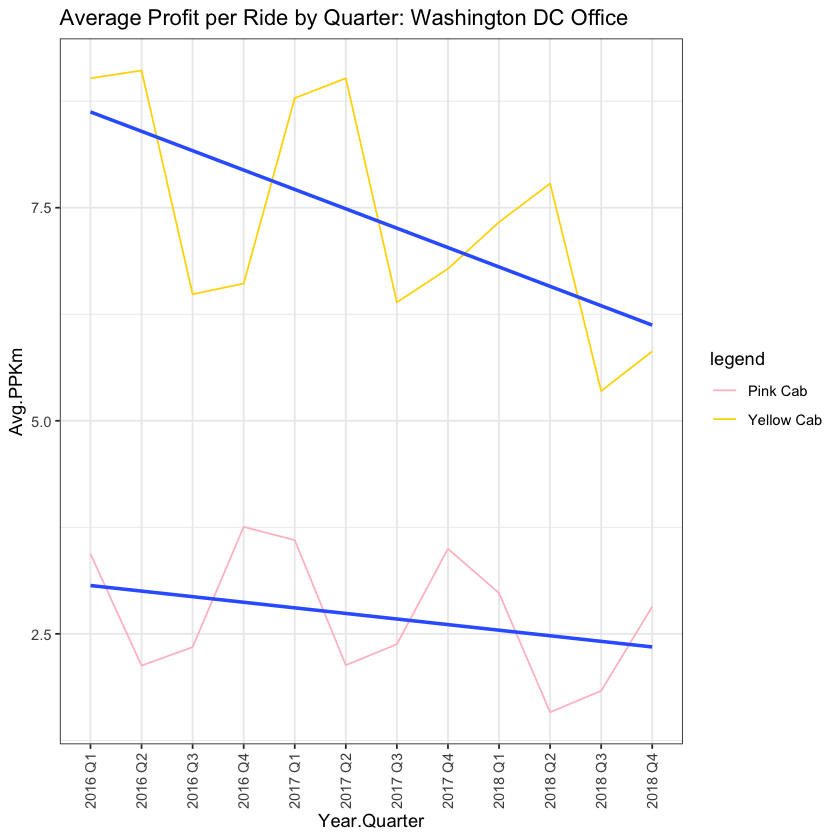

In [69]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           group_by(Company, Year.Quarter) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Ride by Quarter: Washington DC Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,2.504029
2016 Q1,Yellow Cab,10.027044
2016 Q2,Pink Cab,2.028096
2016 Q2,Yellow Cab,8.489800
2016 Q3,Pink Cab,2.350859
2016 Q3,Yellow Cab,3.776738
2016 Q4,Pink Cab,4.344441
2016 Q4,Yellow Cab,4.910581
2017 Q1,Pink Cab,2.283738
2017 Q1,Yellow Cab,8.021657


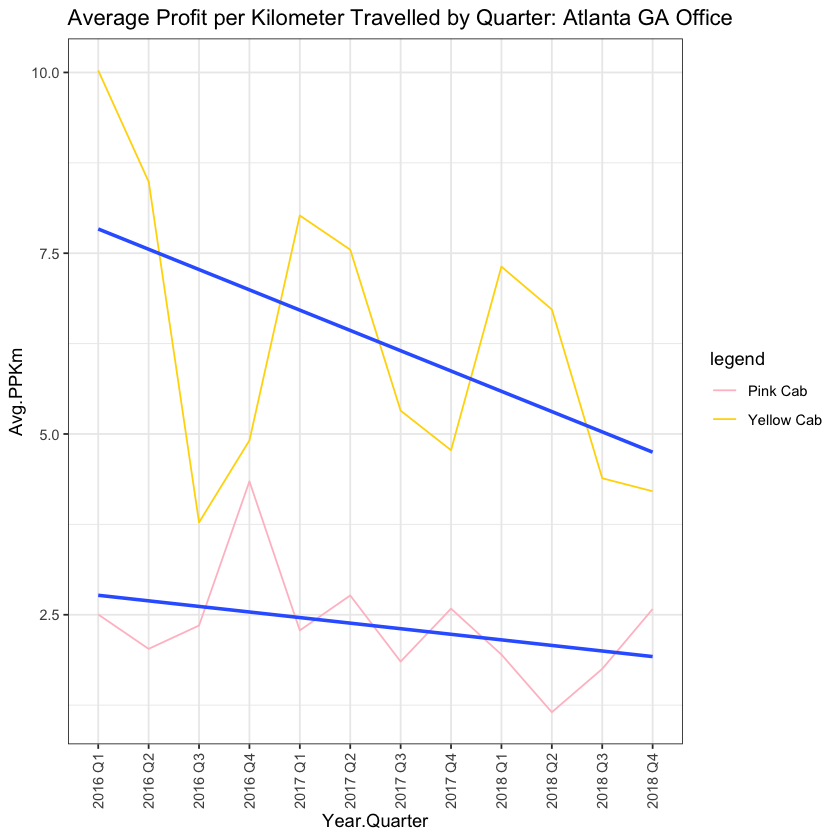

In [70]:
master_data %>%
    filter(City == 'ATLANTA GA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'ATLANTA GA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Atlanta GA Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,4.732293
2016 Q1,Yellow Cab,9.637322
2016 Q2,Pink Cab,2.099823
2016 Q2,Yellow Cab,10.358299
2016 Q3,Pink Cab,2.406020
2016 Q3,Yellow Cab,5.359262
2016 Q4,Pink Cab,4.727085
2016 Q4,Yellow Cab,4.591867
2017 Q1,Pink Cab,4.826209
2017 Q1,Yellow Cab,8.190178


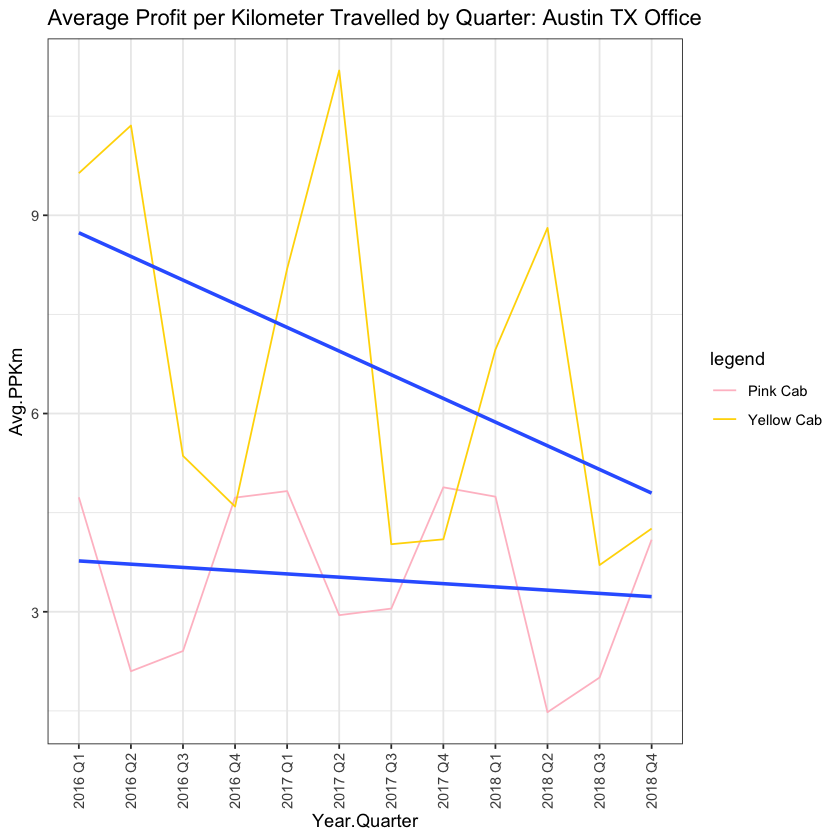

In [71]:
master_data %>%
    filter(City == 'AUSTIN TX') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'AUSTIN TX') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Austin TX Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,1.6558413
2016 Q1,Yellow Cab,4.4225449
2016 Q2,Pink Cab,1.5677969
2016 Q2,Yellow Cab,2.7652296
2016 Q3,Pink Cab,2.0921551
2016 Q3,Yellow Cab,2.6316915
2016 Q4,Pink Cab,3.8618282
2016 Q4,Yellow Cab,2.5309226
2017 Q1,Pink Cab,1.9673808
2017 Q1,Yellow Cab,3.6999543


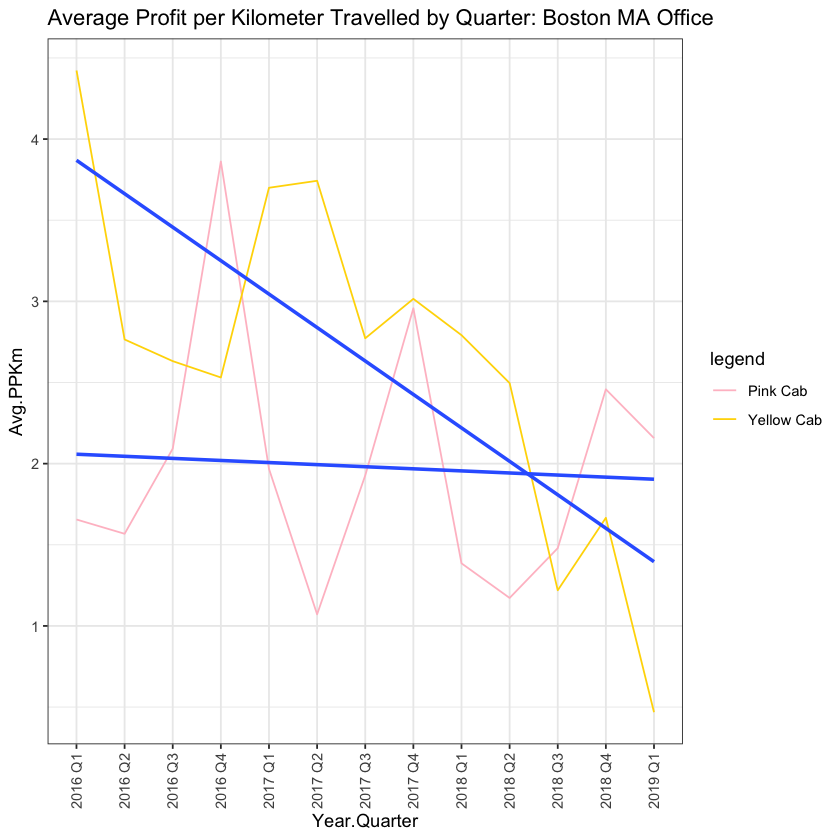

In [154]:
master_data %>%
    filter(City == 'BOSTON MA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'BOSTON MA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Boston MA Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,2.7344353
2016 Q1,Yellow Cab,4.0459363
2016 Q2,Pink Cab,1.7054036
2016 Q2,Yellow Cab,4.9482017
2016 Q3,Pink Cab,0.4921749
2016 Q3,Yellow Cab,2.5908467
2016 Q4,Pink Cab,2.2877230
2016 Q4,Yellow Cab,2.7346834
2017 Q1,Pink Cab,2.5212304
2017 Q1,Yellow Cab,4.6828908


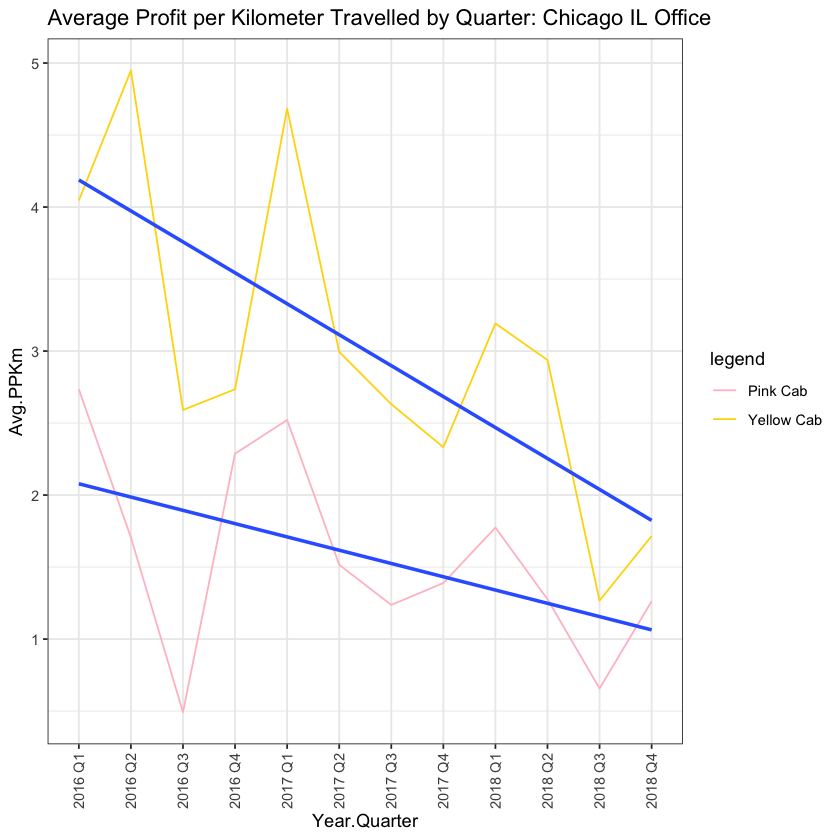

In [72]:
master_data %>%
    filter(City == 'CHICAGO IL') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'CHICAGO IL') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Chicago IL Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,-0.726726503
2016 Q1,Yellow Cab,12.425741941
2016 Q2,Pink Cab,-0.605157908
2016 Q2,Yellow Cab,11.567250030
2016 Q3,Pink Cab,0.884977667
2016 Q3,Yellow Cab,7.744928787
2016 Q4,Pink Cab,2.811226783
2016 Q4,Yellow Cab,7.516510241
2017 Q1,Pink Cab,0.619587196
2017 Q1,Yellow Cab,10.156185370


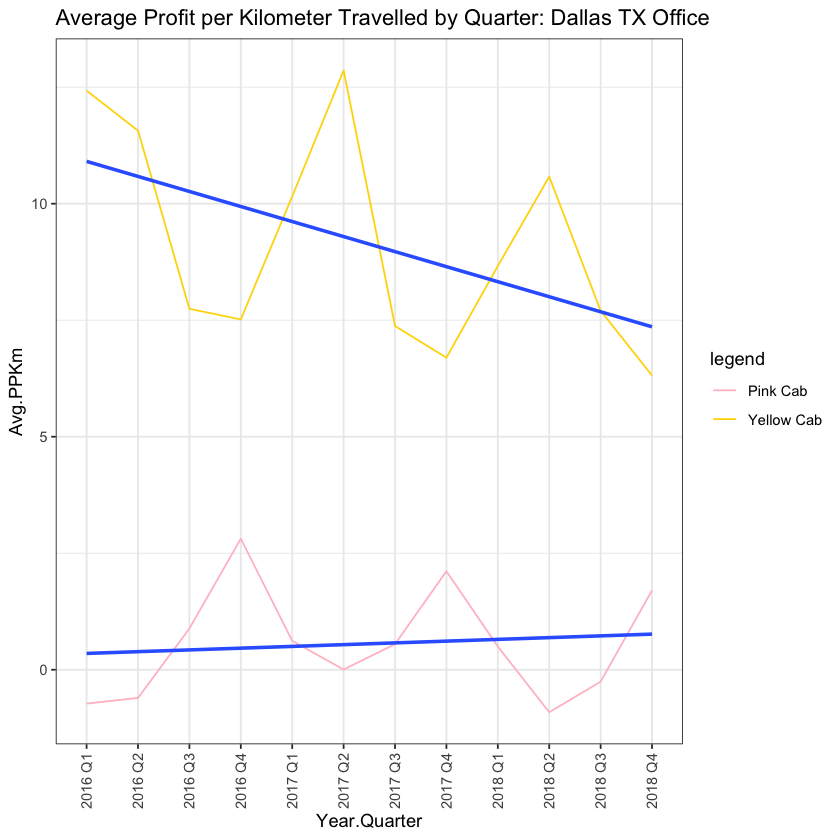

In [73]:
master_data %>%
    filter(City == 'DALLAS TX') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'DALLAS TX') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Dallas TX Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,-0.4580753
2016 Q1,Yellow Cab,9.3537762
2016 Q2,Pink Cab,1.3872893
2016 Q2,Yellow Cab,7.1601057
2016 Q3,Pink Cab,0.8699593
2016 Q3,Yellow Cab,6.0815469
2016 Q4,Pink Cab,2.5972954
2016 Q4,Yellow Cab,5.7204176
2017 Q1,Pink Cab,0.2453067
2017 Q1,Yellow Cab,8.8944624


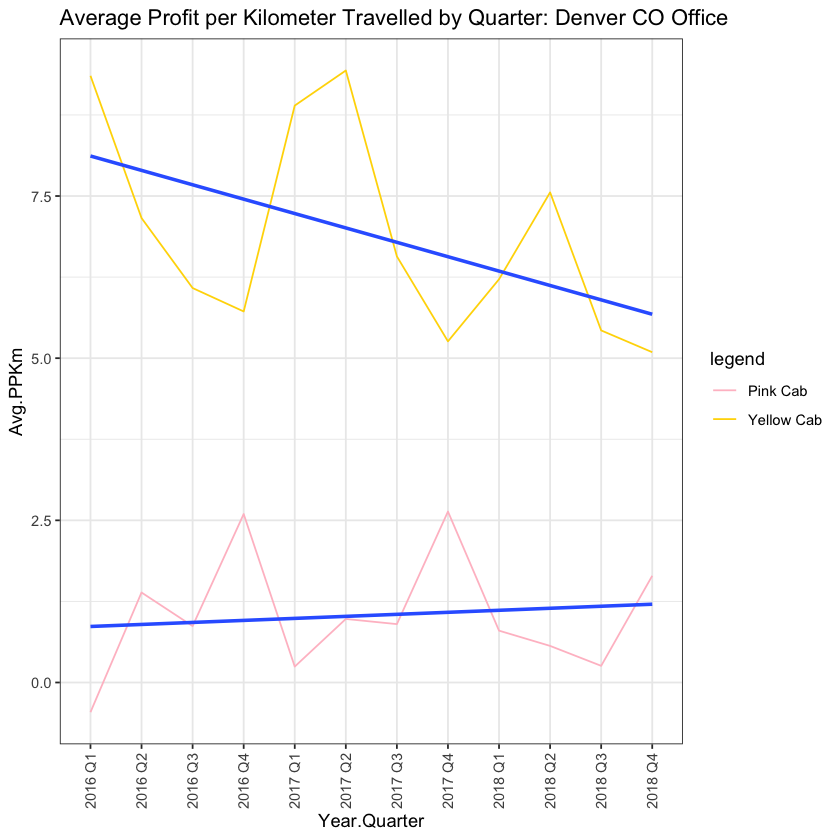

In [74]:
master_data %>%
    filter(City == 'DENVER CO') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'DENVER CO') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Denver CO Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,4.723047
2016 Q1,Yellow Cab,8.032932
2016 Q2,Pink Cab,2.535931
2016 Q2,Yellow Cab,7.762087
2016 Q3,Pink Cab,2.394064
2016 Q3,Yellow Cab,3.926372
2016 Q4,Pink Cab,2.684080
2016 Q4,Yellow Cab,4.801958
2017 Q1,Pink Cab,4.491410
2017 Q1,Yellow Cab,7.306726


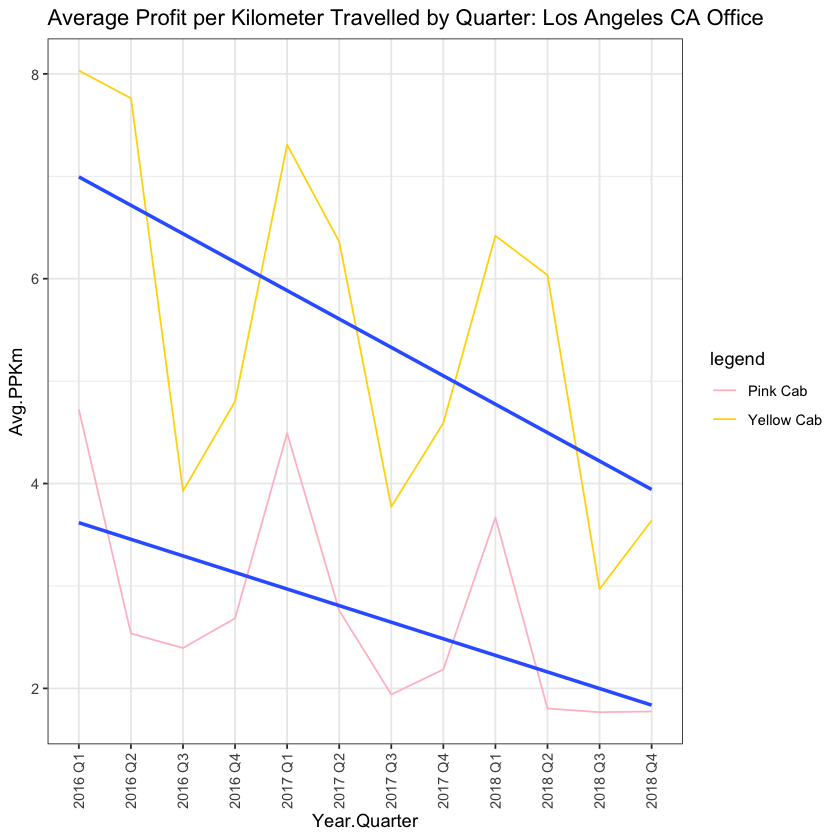

In [75]:
master_data %>%
    filter(City == 'LOS ANGELES CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'LOS ANGELES CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Los Angeles CA Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,3.9818491
2016 Q1,Yellow Cab,8.9894517
2016 Q2,Pink Cab,-0.3630497
2016 Q2,Yellow Cab,9.3629948
2016 Q3,Pink Cab,4.1860545
2016 Q3,Yellow Cab,6.9243056
2016 Q4,Pink Cab,4.3657191
2016 Q4,Yellow Cab,4.7399067
2017 Q1,Pink Cab,4.2186715
2017 Q1,Yellow Cab,7.4985101


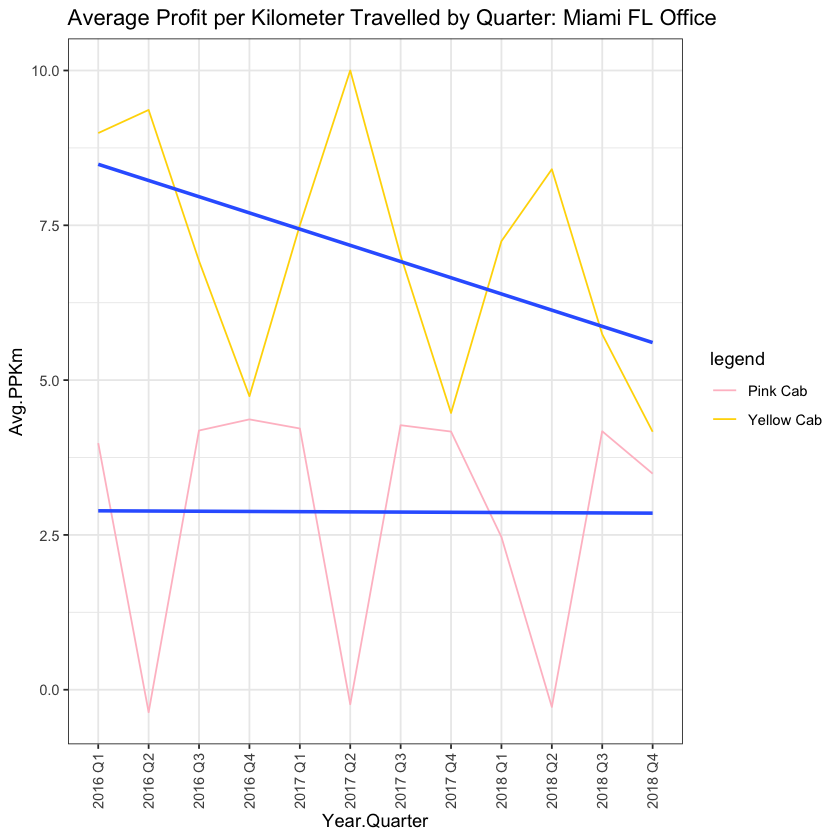

In [76]:
master_data %>%
    filter(City == 'MIAMI FL') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'MIAMI FL') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Miami FL Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,1.7412387
2016 Q1,Yellow Cab,4.9631400
2016 Q2,Pink Cab,0.7537952
2016 Q2,Yellow Cab,3.9819298
2016 Q3,Pink Cab,1.9014590
2016 Q3,Yellow Cab,2.5760182
2016 Q4,Pink Cab,1.5646369
2016 Q4,Yellow Cab,3.7695175
2017 Q1,Pink Cab,2.9383875
2017 Q1,Yellow Cab,5.0532426


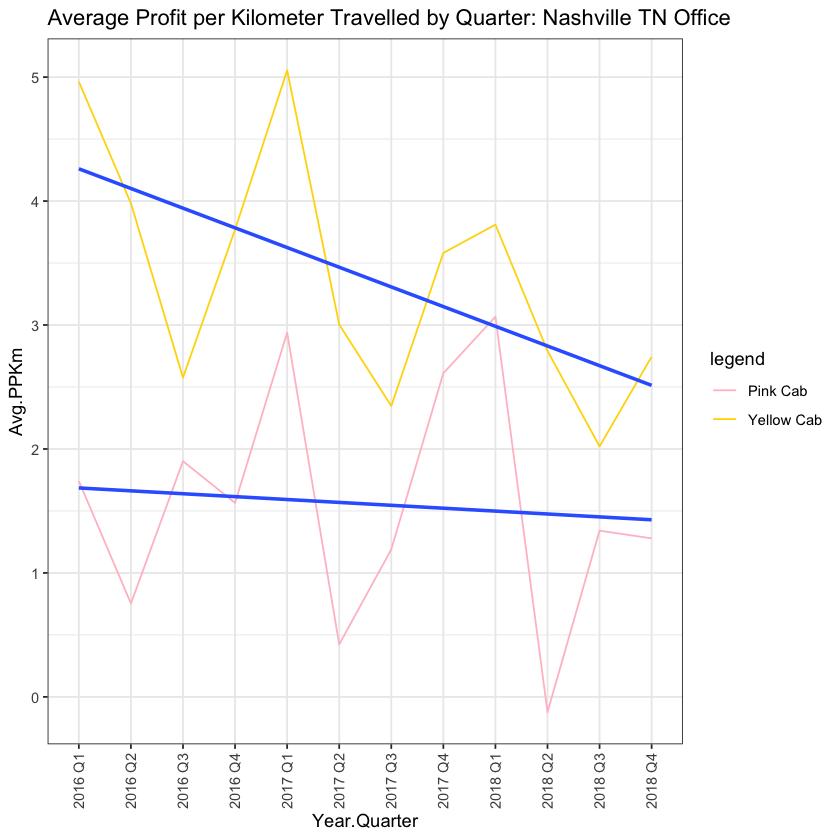

In [77]:
master_data %>%
    filter(City == 'NASHVILLE TN') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'NASHVILLE TN') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Nashville TN Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,4.940537
2016 Q1,Yellow Cab,17.500757
2016 Q2,Pink Cab,2.114301
2016 Q2,Yellow Cab,17.447829
2016 Q3,Pink Cab,3.154378
2016 Q3,Yellow Cab,13.293903
2016 Q4,Pink Cab,6.716849
2016 Q4,Yellow Cab,12.380882
2017 Q1,Pink Cab,5.412600
2017 Q1,Yellow Cab,16.275441


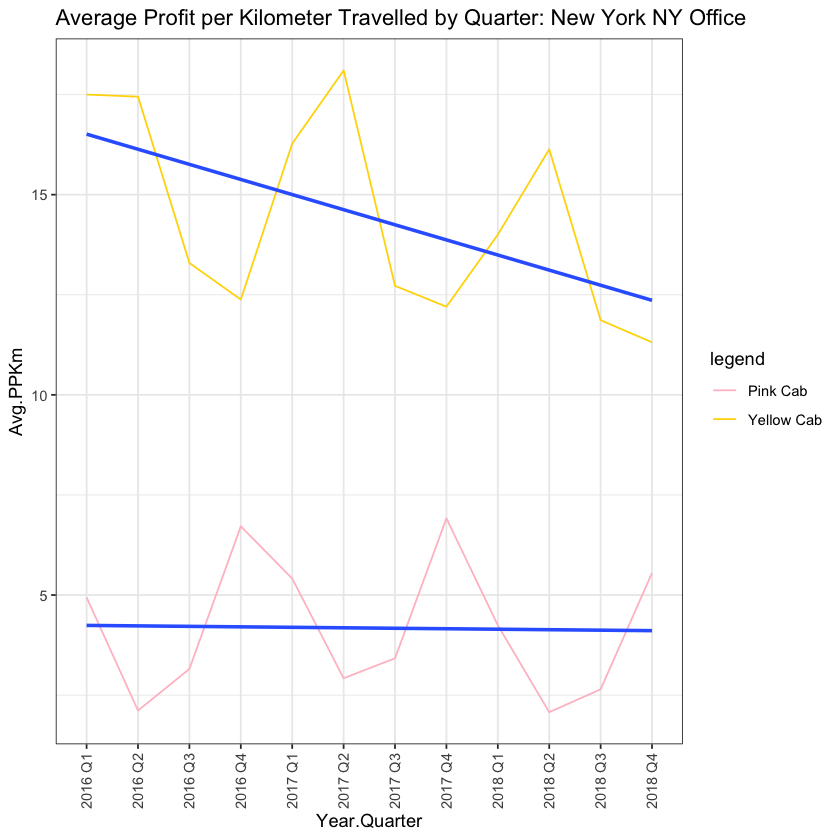

In [78]:
master_data %>%
    filter(City == 'NEW YORK NY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'NEW YORK NY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: New York NY Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,4.555166
2016 Q1,Yellow Cab,14.160388
2016 Q2,Pink Cab,1.198423
2016 Q2,Yellow Cab,11.325082
2016 Q3,Pink Cab,3.488631
2016 Q3,Yellow Cab,5.483804
2016 Q4,Pink Cab,2.752068
2016 Q4,Yellow Cab,3.991026
2017 Q1,Pink Cab,5.374687
2017 Q1,Yellow Cab,11.809540


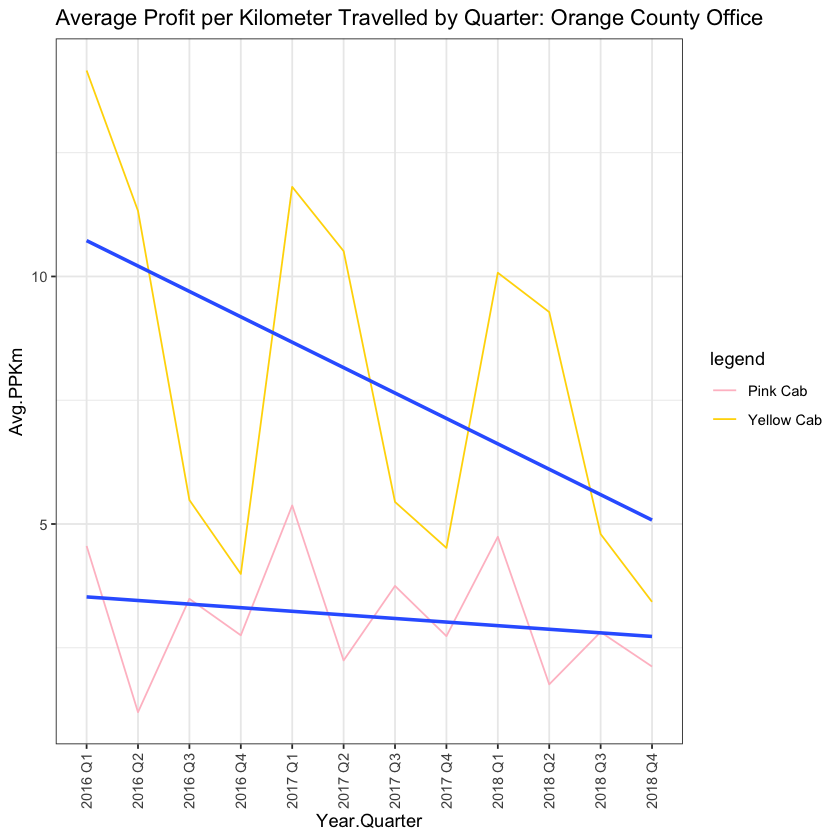

In [79]:
master_data %>%
    filter(City == 'ORANGE COUNTY') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'ORANGE COUNTY') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Orange County Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,3.0169314
2016 Q1,Yellow Cab,9.2933783
2016 Q2,Pink Cab,1.1910569
2016 Q2,Yellow Cab,8.4985710
2016 Q3,Pink Cab,3.0455114
2016 Q3,Yellow Cab,4.4664060
2016 Q4,Pink Cab,2.3147705
2016 Q4,Yellow Cab,5.6407676
2017 Q1,Pink Cab,2.7311691
2017 Q1,Yellow Cab,6.8481178


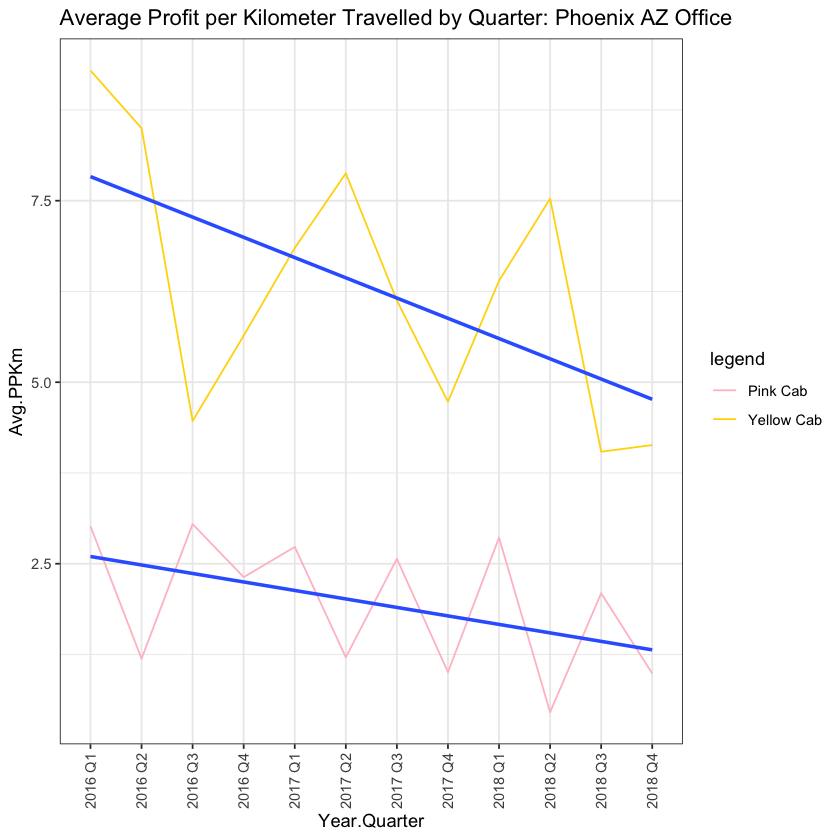

In [80]:
master_data %>%
    filter(City == 'PHOENIX AZ') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'PHOENIX AZ') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Phoenix AZ Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,1.5420728
2016 Q1,Yellow Cab,7.9554622
2016 Q2,Pink Cab,1.3332409
2016 Q2,Yellow Cab,3.8768564
2016 Q3,Pink Cab,1.5098260
2016 Q3,Yellow Cab,3.6879782
2016 Q4,Pink Cab,0.5388557
2016 Q4,Yellow Cab,3.2646227
2017 Q1,Pink Cab,3.3907280
2017 Q1,Yellow Cab,9.5597078


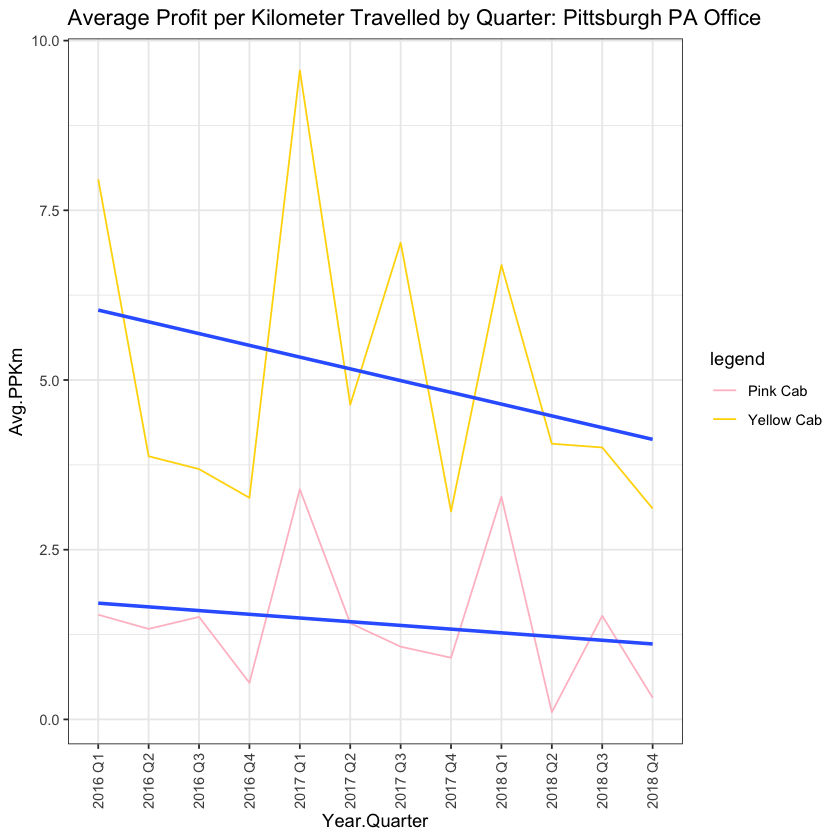

In [81]:
master_data %>%
    filter(City == 'PITTSBURGH PA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'PITTSBURGH PA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Pittsburgh PA Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,3.2077183
2016 Q1,Yellow Cab,5.1588661
2016 Q2,Pink Cab,2.4913579
2016 Q2,Yellow Cab,4.7326126
2016 Q3,Pink Cab,2.1254810
2016 Q3,Yellow Cab,2.5432693
2016 Q4,Pink Cab,0.8686917
2016 Q4,Yellow Cab,1.3858476
2017 Q1,Pink Cab,2.6944402
2017 Q1,Yellow Cab,4.4050197


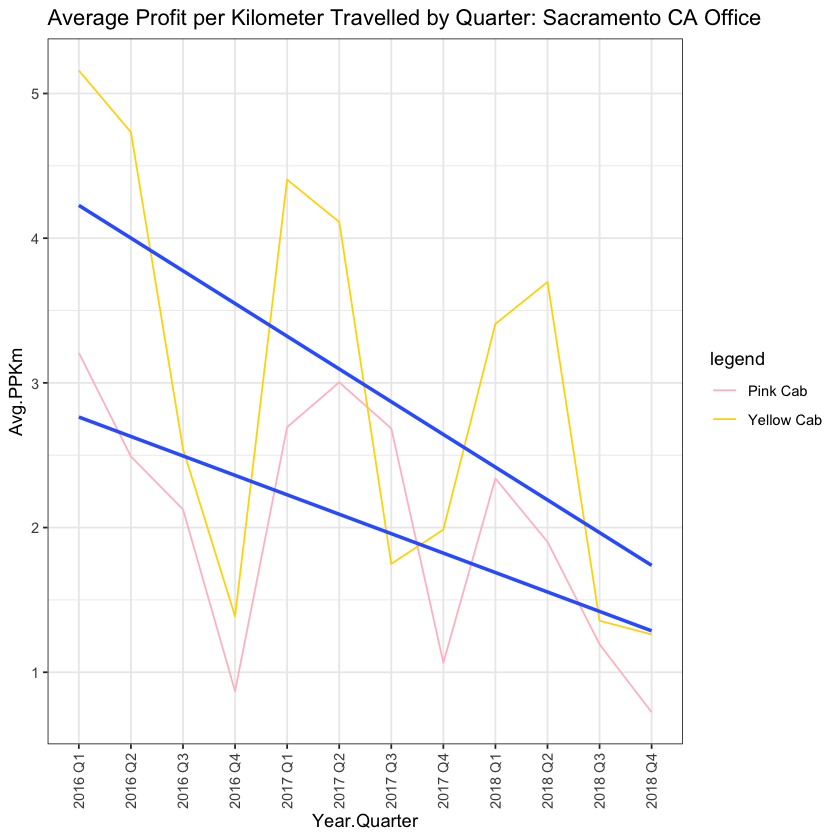

In [82]:
master_data %>%
    filter(City == 'SACRAMENTO CA') %>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'SACRAMENTO CA') %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Sacramento CA Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,2.920844
2016 Q1,Yellow Cab,5.981947
2016 Q2,Pink Cab,2.628680
2016 Q2,Yellow Cab,5.055335
2016 Q3,Pink Cab,2.683244
2016 Q3,Yellow Cab,3.734219
2016 Q4,Pink Cab,3.018026
2016 Q4,Yellow Cab,3.029869
2017 Q1,Pink Cab,3.771640
2017 Q1,Yellow Cab,6.372233


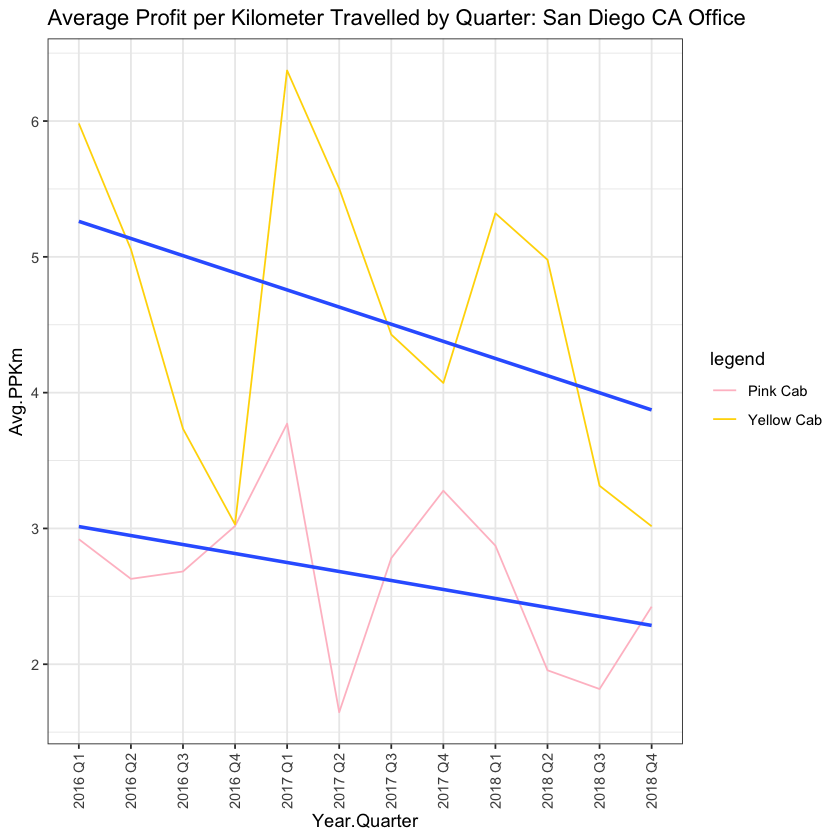

In [83]:
master_data %>%
    filter(City == 'SAN DIEGO CA')%>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'SAN DIEGO CA')%>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: San Diego CA Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,1.7118265
2016 Q1,Yellow Cab,5.0926767
2016 Q2,Pink Cab,2.2885958
2016 Q2,Yellow Cab,4.8204623
2016 Q3,Pink Cab,1.0337449
2016 Q3,Yellow Cab,4.3667350
2016 Q4,Pink Cab,3.0066546
2016 Q4,Yellow Cab,2.9099017
2017 Q1,Pink Cab,1.8199912
2017 Q1,Yellow Cab,5.7155203


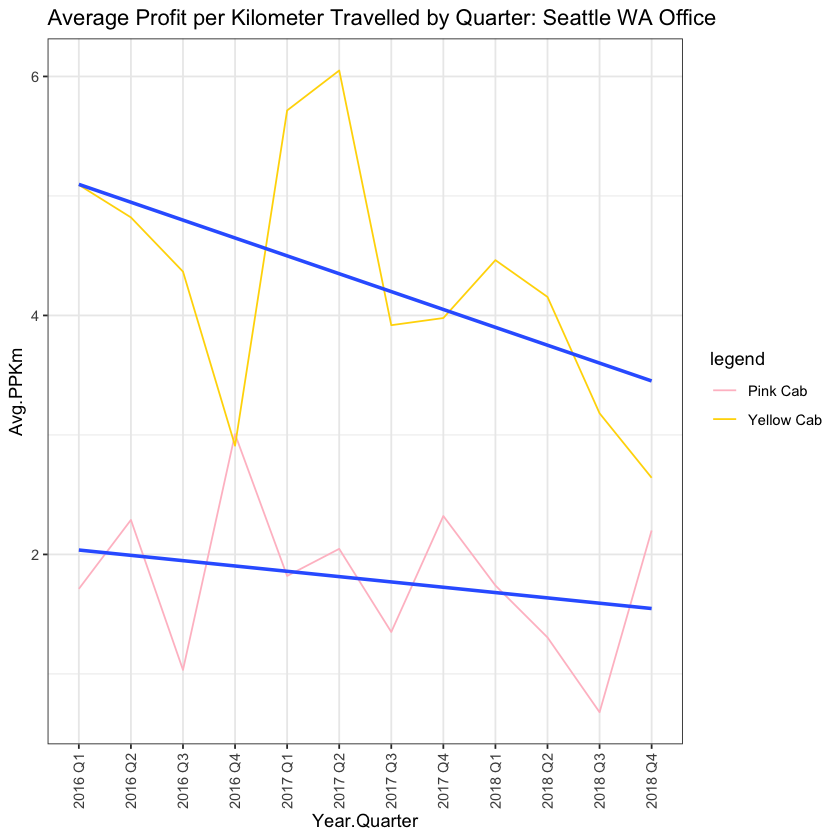

In [84]:
master_data %>%
    filter(City == 'SEATTLE WA')%>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'SEATTLE WA')%>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Seattle WA Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,6.286149
2016 Q1,Yellow Cab,11.706767
2016 Q2,Pink Cab,3.076493
2016 Q2,Yellow Cab,12.470474
2016 Q3,Pink Cab,3.282764
2016 Q3,Yellow Cab,7.378486
2016 Q4,Pink Cab,4.748474
2016 Q4,Yellow Cab,9.120082
2017 Q1,Pink Cab,5.480000
2017 Q1,Yellow Cab,11.930273


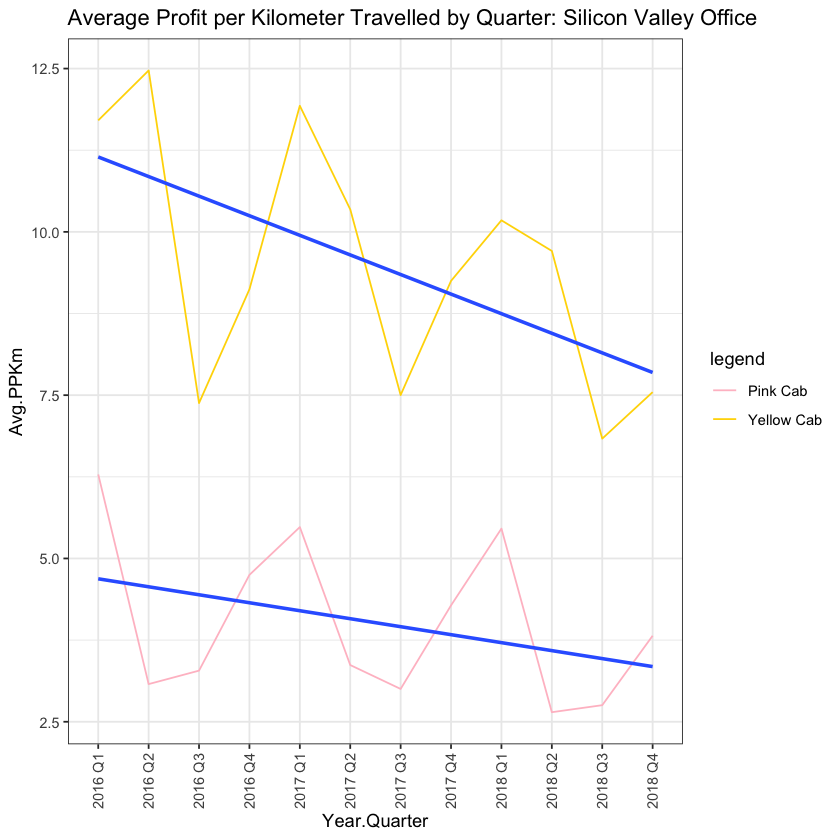

In [85]:
master_data %>%
    filter(City == 'SILICON VALLEY')%>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'SILICON VALLEY')%>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Silicon Valley Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,4.496332
2016 Q1,Yellow Cab,4.982930
2016 Q2,Pink Cab,3.831439
2016 Q2,Yellow Cab,3.155482
2016 Q3,Pink Cab,3.287581
2016 Q3,Yellow Cab,2.111148
2016 Q4,Pink Cab,4.467385
2016 Q4,Yellow Cab,3.015612
2017 Q1,Pink Cab,2.938331
2017 Q1,Yellow Cab,5.204295


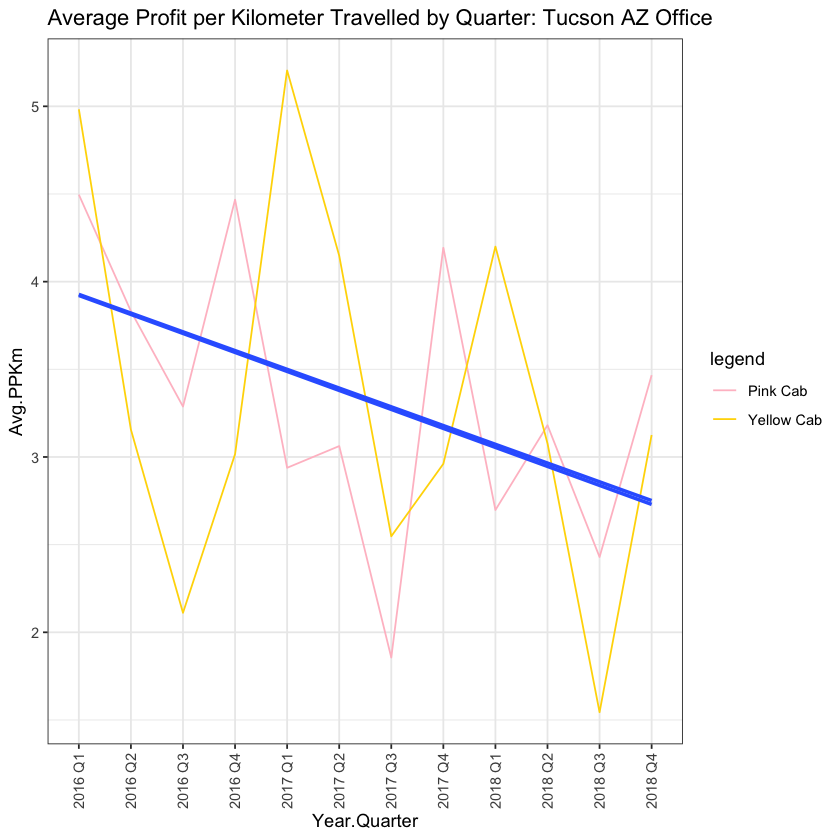

In [86]:
master_data %>%
    filter(City == 'TUCSON AZ')%>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'TUCSON AZ')%>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Tucson AZ Office')

Year.Quarter,Company,Avg.PPKm
2016 Q1,Pink Cab,2.900415
2016 Q1,Yellow Cab,4.811925
2016 Q2,Pink Cab,2.005626
2016 Q2,Yellow Cab,5.209109
2016 Q3,Pink Cab,1.463028
2016 Q3,Yellow Cab,2.556691
2016 Q4,Pink Cab,2.877334
2016 Q4,Yellow Cab,2.507888
2017 Q1,Pink Cab,2.417046
2017 Q1,Yellow Cab,5.314244


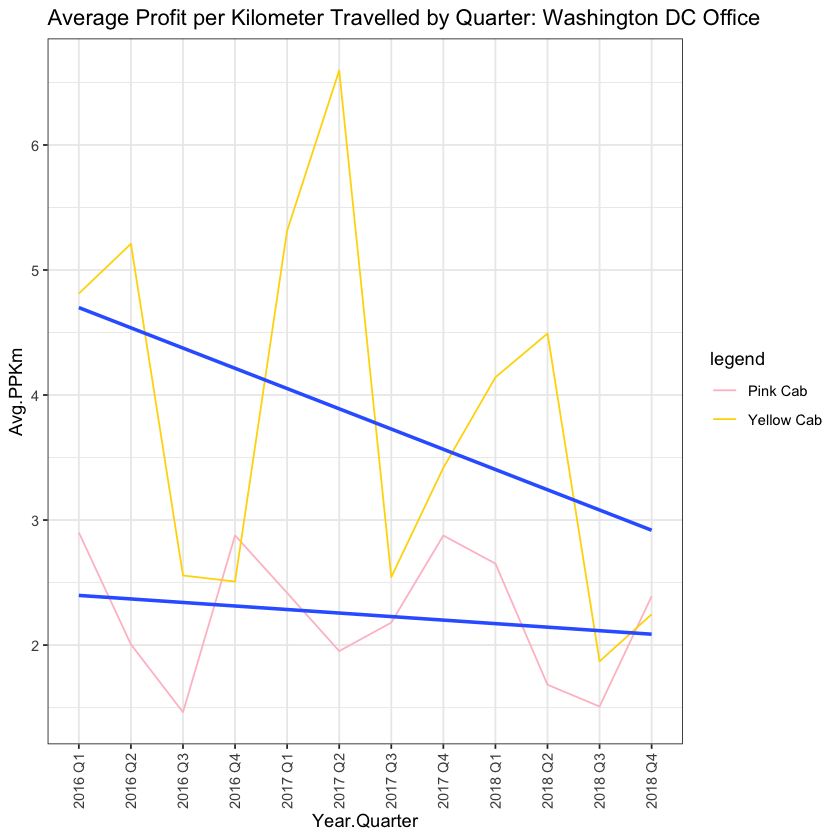

In [87]:
master_data %>%
    filter(City == 'WASHINGTON DC')%>%
    group_by(Year.Quarter, Company) %>%
    summarise(Avg.PPKm = mean(Profit/KM.Travelled))
ggplot(master_data %>%
           filter(City == 'WASHINGTON DC')%>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.PPKm = mean(Profit/KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.PPKm, group = Company)) + 
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Profit per Kilometer Travelled by Quarter: Washington DC Office')

Across most cities, there seems to be a clear difference between the charged price per kilometer travelled per quarter for each company, Yellow Cab company charging higher price per kilometer across most quarters of the time frame provided by the data set. Tucson AZ seems like the only city where Pink Cab company can compete with with Yellow Cab company. Aside from that city, Yellow Cab company charges more per kilometer travelled across time, & overall (on average).


***

avg km travelled between cities for each company & avg km quarterly for each company

City,Avg.KM.Travelled
ATLANTA GA,22.54403
AUSTIN TX,21.94818
BOSTON MA,22.74185
CHICAGO IL,22.50959
DALLAS TX,22.01942
DENVER CO,22.46100
LOS ANGELES CA,22.63891
MIAMI FL,22.31812
NASHVILLE TN,22.52947
NEW YORK NY,22.62134


City,Avg.KM.Travelled
ATLANTA GA,22.25407
AUSTIN TX,22.53396
BOSTON MA,22.53784
CHICAGO IL,22.66007
DALLAS TX,22.59227
DENVER CO,22.43935
LOS ANGELES CA,22.68357
MIAMI FL,22.63076
NASHVILLE TN,22.94143
NEW YORK NY,22.50084


Company,Avg.KM.Travelled
Pink Cab,22.55906
Yellow Cab,22.56953


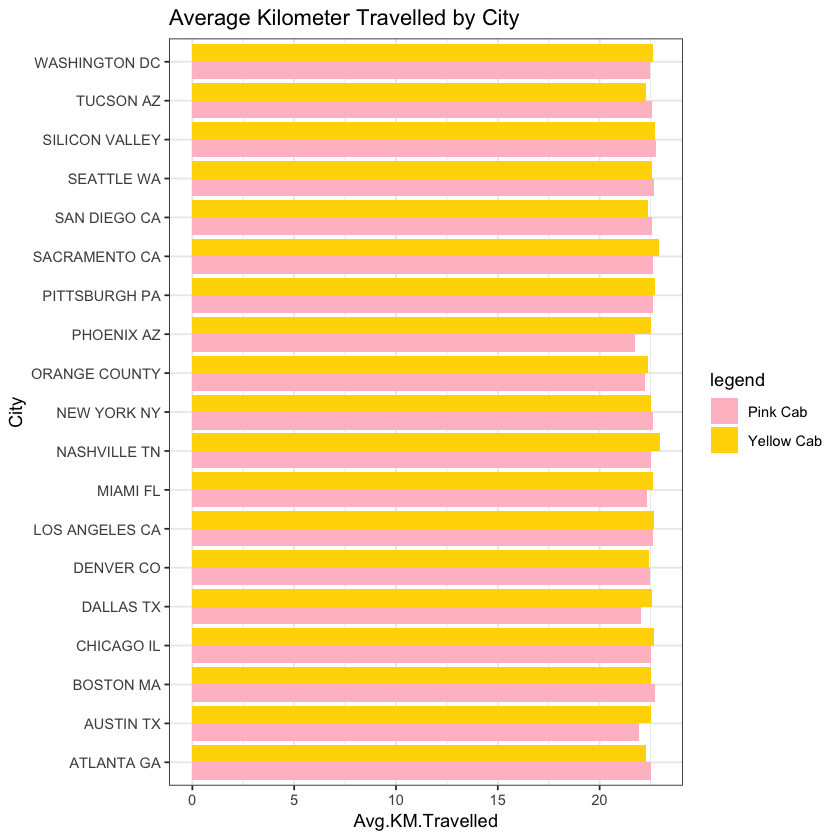

In [92]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(City) %>%
    summarise(Avg.KM.Travelled = mean(KM.Travelled))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(City) %>%
    summarise(Avg.KM.Travelled = mean(KM.Travelled))
master_data %>%
    group_by(Company) %>%
    summarise(Avg.KM.Travelled = mean(KM.Travelled))
ggplot(master_data %>%
           group_by(City, Company) %>%
           summarise(Avg.KM.Travelled = mean(KM.Travelled)),
       aes(x = City, y = Avg.KM.Travelled, fill = Company)) + 
    geom_bar(position = 'dodge', stat = 'identity') + 
    scale_fill_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    coord_flip() +
    labs(title = 'Average Kilometer Travelled by City')

Year.Quarter,Avg.KM.Travelled
2016 Q1,22.51250
2016 Q2,22.42593
2016 Q3,22.52199
2016 Q4,22.38958
2017 Q1,22.80559
2017 Q2,22.72749
2017 Q3,22.48459
2017 Q4,22.62246
2018 Q1,22.70910
2018 Q2,22.70867


Year.Quarter,Avg.KM.Travelled
2016 Q1,22.70269
2016 Q2,22.55218
2016 Q3,22.62593
2016 Q4,22.60484
2017 Q1,22.67397
2017 Q2,22.45270
2017 Q3,22.54642
2017 Q4,22.58214
2018 Q1,22.50993
2018 Q2,22.63875


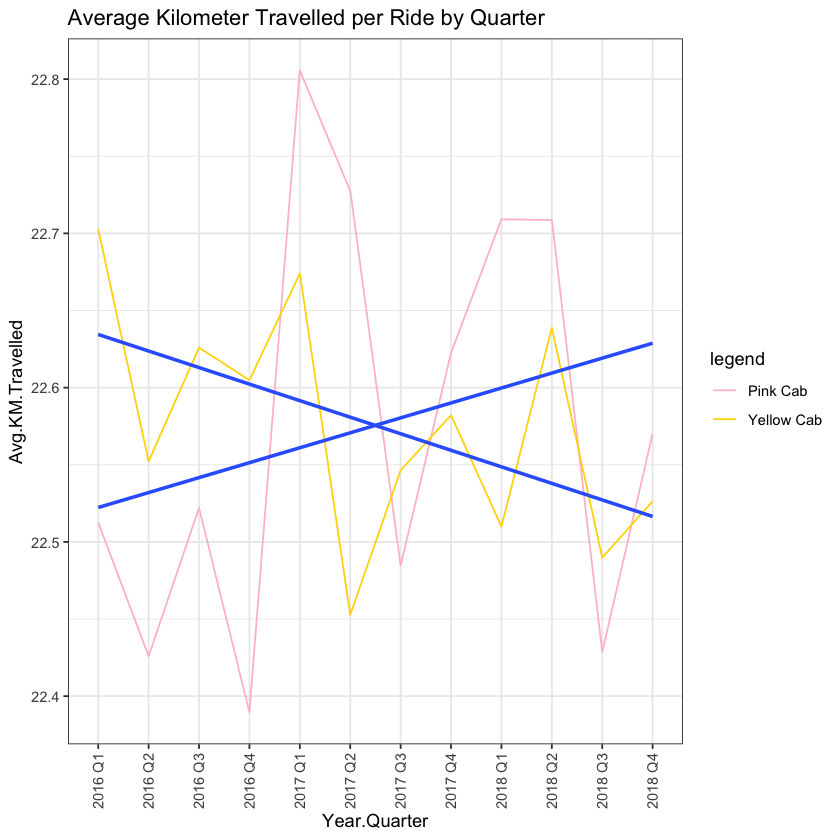

In [99]:
master_data %>%
    filter(Company == 'Pink Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(Avg.KM.Travelled = mean(KM.Travelled))
master_data %>%
    filter(Company == 'Yellow Cab') %>%
    group_by(Year.Quarter) %>%
    summarise(Avg.KM.Travelled = mean(KM.Travelled))
ggplot(master_data %>%
           group_by(Year.Quarter, Company) %>%
           summarise(Avg.KM.Travelled = mean(KM.Travelled)),
       aes(x = Year.Quarter, y = Avg.KM.Travelled, group = Company)) +
    geom_line(aes(colour = Company)) +
    geom_smooth(method = 'lm', se = FALSE) +
    scale_colour_manual('legend', values = c('Pink Cab' = 'Pink', 'Yellow Cab' = 'Gold')) +
    theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) +
    labs(title = 'Average Kilometer Travelled per Ride by Quarter')

Although all of our indicators point to Yellow Cab company being the better investment, it could be that although Yellow Cab company is generating all of this profit, profit per ride, profit per km, its provides more rides, it could be losing money. Its operational costs could be even higher than its total profits from rides, resulting in negative net income. It could be that Pink Cab company has low operational costs, thus making Pink Cab company the better investment. However because we weren't provided that information, based on the data available. Another thing that seems concerning is that although Yellow Cab company seems like the better company, all of its profit indicators seem to trend downward across quarters. Especially given the time frame of the situation, as apps like Uber, Lift, Cruise become more popular, perhaps that is why profits are, on average, decreasing quarter to quarter. So just based off of that, I would not even invest in either cab company. However, just based on a comparison standpoint, Yellow Cab company seems more established, they provide more rides, they charge more kilometer, they make more per ride & this seems to be true for nearly all of their offices. The number of rides per company over each quarter, on average, seems pretty consistent, & is the main driving factor in both company's profit. Although the PPR & PPKm are on average, decrease quarter to quarter, since the ride numbers are on average, pretty consistent, quarter to quarter, it will all depend on operational costs to see if the company is making or losing money. From the data provided, though, Yellow Cab company is the better investment. From a time frame perspective, both are not great investments.